*Initially created at 13.03.2018 by Petteri Nevavuori (<petteri.nevavuori@mtech.fi>)*

---

# ML III. CNN Optimization

In this notebook we'll train several CNNs with Drone datasets and research if the drone images are valid with just themselves as inputs in predicting the yield outputs. We will perform training by the datasets generated at the previous notebook. We will use the images as inputs and use area-wise means as training targets.

The CNN will effectively comprise of a multilayer CNN connected to several linear layers for yield prediction. Some research questions:

- How many layers is optimal?
- What optimizer is optimal?
- What hyperparameters are optimal?
- Which input image size yields best results?

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#1.-Optimizer-Comparison" data-toc-modified-id="1.-Optimizer-Comparison-1">1. Optimizer Comparison</a></span><ul class="toc-item"><li><span><a href="#1.1-Batch-Size-Limits" data-toc-modified-id="1.1-Batch-Size-Limits-1.1">1.1 Batch Size Limits</a></span><ul class="toc-item"><li><span><a href="#1.1.1-SGD" data-toc-modified-id="1.1.1-SGD-1.1.1">1.1.1 SGD</a></span></li><li><span><a href="#1.1.2-RMSProp" data-toc-modified-id="1.1.2-RMSProp-1.1.2">1.1.2 RMSProp</a></span></li><li><span><a href="#1.1.3-Adadelta" data-toc-modified-id="1.1.3-Adadelta-1.1.3">1.1.3 Adadelta</a></span></li><li><span><a href="#1.1.4-Conclusions" data-toc-modified-id="1.1.4-Conclusions-1.1.4">1.1.4 Conclusions</a></span></li></ul></li><li><span><a href="#1.2-Comparing-with-Distinct-Datasets" data-toc-modified-id="1.2-Comparing-with-Distinct-Datasets-1.2">1.2 Comparing with Distinct Datasets</a></span><ul class="toc-item"><li><span><a href="#1.2.1-NDVI-Earlier-Dataset" data-toc-modified-id="1.2.1-NDVI-Earlier-Dataset-1.2.1">1.2.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#1.2.2-NDVI-Later-Dataset" data-toc-modified-id="1.2.2-NDVI-Later-Dataset-1.2.2">1.2.2 NDVI Later Dataset</a></span></li><li><span><a href="#1.2.3-RGB-Earlier-Dataset" data-toc-modified-id="1.2.3-RGB-Earlier-Dataset-1.2.3">1.2.3 RGB Earlier Dataset</a></span></li><li><span><a href="#1.2.4-RGB-Later-Dataset" data-toc-modified-id="1.2.4-RGB-Later-Dataset-1.2.4">1.2.4 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#1.4-Conclusion-for-the-Optimizer" data-toc-modified-id="1.4-Conclusion-for-the-Optimizer-1.3">1.4 Conclusion for the Optimizer</a></span><ul class="toc-item"><li><span><a href="#1.4.1-NDVI-Datasets" data-toc-modified-id="1.4.1-NDVI-Datasets-1.3.1">1.4.1 NDVI Datasets</a></span></li><li><span><a href="#1.4.2-RGB-Datasets" data-toc-modified-id="1.4.2-RGB-Datasets-1.3.2">1.4.2 RGB Datasets</a></span></li><li><span><a href="#1.4.3-Final-Optimizer-Conclusions" data-toc-modified-id="1.4.3-Final-Optimizer-Conclusions-1.3.3">1.4.3 Final Optimizer Conclusions</a></span></li></ul></li></ul></li><li><span><a href="#2.-Optimal-Depth" data-toc-modified-id="2.-Optimal-Depth-2">2. Optimal Depth</a></span><ul class="toc-item"><li><span><a href="#2.1-Depth-Comparisons" data-toc-modified-id="2.1-Depth-Comparisons-2.1">2.1 Depth Comparisons</a></span><ul class="toc-item"><li><span><a href="#2.1.1-NDVI-Earlier-Dataset" data-toc-modified-id="2.1.1-NDVI-Earlier-Dataset-2.1.1">2.1.1 NDVI Earlier Dataset</a></span></li><li><span><a href="#2.1.2-NDVI-Later-Dataset" data-toc-modified-id="2.1.2-NDVI-Later-Dataset-2.1.2">2.1.2 NDVI Later Dataset</a></span><ul class="toc-item"><li><span><a href="#Re-training-poorly-initialized-models" data-toc-modified-id="Re-training-poorly-initialized-models-2.1.2.1">Re-training poorly initialized models</a></span></li></ul></li><li><span><a href="#2.1.3-RGB-Earlier-Dataset" data-toc-modified-id="2.1.3-RGB-Earlier-Dataset-2.1.3">2.1.3 RGB Earlier Dataset</a></span></li><li><span><a href="#2.1.4-RGB-Later-Dataset" data-toc-modified-id="2.1.4-RGB-Later-Dataset-2.1.4">2.1.4 RGB Later Dataset</a></span><ul class="toc-item"><li><span><a href="#Re-training-poorly-initialized-models" data-toc-modified-id="Re-training-poorly-initialized-models-2.1.4.1">Re-training poorly initialized models</a></span></li></ul></li></ul></li><li><span><a href="#2.3-Conclusion-for-the-Depth" data-toc-modified-id="2.3-Conclusion-for-the-Depth-2.2">2.3 Conclusion for the Depth</a></span></li></ul></li><li><span><a href="#3.-Regularization" data-toc-modified-id="3.-Regularization-3">3. Regularization</a></span><ul class="toc-item"><li><span><a href="#3.1-Initializing-Networks" data-toc-modified-id="3.1-Initializing-Networks-3.1">3.1 Initializing Networks</a></span><ul class="toc-item"><li><span><a href="#3.1.1-RGB-Earlier-Dataset" data-toc-modified-id="3.1.1-RGB-Earlier-Dataset-3.1.1">3.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.1.2-RGB-Later-Dataset" data-toc-modified-id="3.1.2-RGB-Later-Dataset-3.1.2">3.1.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2-Benchmark-Trainings" data-toc-modified-id="3.2-Benchmark-Trainings-3.2">3.2 Benchmark Trainings</a></span><ul class="toc-item"><li><span><a href="#3.2.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.1-RGB-Earlier-Dataset-3.2.1">3.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.2-RGB-Later-Dataset" data-toc-modified-id="3.2.2-RGB-Later-Dataset-3.2.2">3.2.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2-Weight-decay" data-toc-modified-id="3.2-Weight-decay-3.3">3.2 Weight decay</a></span><ul class="toc-item"><li><span><a href="#3.2.1-Grid-Search-with-Both-RGB-Datasets" data-toc-modified-id="3.2.1-Grid-Search-with-Both-RGB-Datasets-3.3.1">3.2.1 Grid Search with Both RGB Datasets</a></span><ul class="toc-item"><li><span><a href="#3.2.1.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.1.1-RGB-Earlier-Dataset-3.3.1.1">3.2.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.1.2-RGB-Later-Dataset" data-toc-modified-id="3.2.1.2-RGB-Later-Dataset-3.3.1.2">3.2.1.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2.2-Random-Search-with-Both-Datasets" data-toc-modified-id="3.2.2-Random-Search-with-Both-Datasets-3.3.2">3.2.2 Random Search with Both Datasets</a></span><ul class="toc-item"><li><span><a href="#3.2.2.1-RGB-Earlier-Dataset" data-toc-modified-id="3.2.2.1-RGB-Earlier-Dataset-3.3.2.1">3.2.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.2.2.2-RGB-Later-Dataset" data-toc-modified-id="3.2.2.2-RGB-Later-Dataset-3.3.2.2">3.2.2.2 RGB Later Dataset</a></span></li></ul></li><li><span><a href="#3.2.3-Conclusions" data-toc-modified-id="3.2.3-Conclusions-3.3.3">3.2.3 Conclusions</a></span></li></ul></li><li><span><a href="#3.3-Early-Stopping" data-toc-modified-id="3.3-Early-Stopping-3.4">3.3 Early Stopping</a></span><ul class="toc-item"><li><span><a href="#3.3.1-RGB-Earlier-Dataset" data-toc-modified-id="3.3.1-RGB-Earlier-Dataset-3.4.1">3.3.1 RGB Earlier Dataset</a></span></li><li><span><a href="#3.3.2-RGB-Later-Dataset" data-toc-modified-id="3.3.2-RGB-Later-Dataset-3.4.2">3.3.2 RGB Later Dataset</a></span></li><li><span><a href="#3.3.3-Conclusions" data-toc-modified-id="3.3.3-Conclusions-3.4.3">3.3.3 Conclusions</a></span></li></ul></li></ul></li><li><span><a href="#4.-Optimizer-Tuning" data-toc-modified-id="4.-Optimizer-Tuning-4">4. Optimizer Tuning</a></span><ul class="toc-item"><li><span><a href="#4.1-Grid-Search" data-toc-modified-id="4.1-Grid-Search-4.1">4.1 Grid Search</a></span><ul class="toc-item"><li><span><a href="#4.1.1-RGB-Earlier-Dataset" data-toc-modified-id="4.1.1-RGB-Earlier-Dataset-4.1.1">4.1.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.1.2-RGB-Later-Dataset" data-toc-modified-id="4.1.2-RGB-Later-Dataset-4.1.2">4.1.2 RGB Later Dataset</a></span></li><li><span><a href="#4.1.3-Conclusions" data-toc-modified-id="4.1.3-Conclusions-4.1.3">4.1.3 Conclusions</a></span></li></ul></li><li><span><a href="#4.2-Random-Search" data-toc-modified-id="4.2-Random-Search-4.2">4.2 Random Search</a></span><ul class="toc-item"><li><span><a href="#4.2.1-RGB-Earlier-Dataset" data-toc-modified-id="4.2.1-RGB-Earlier-Dataset-4.2.1">4.2.1 RGB Earlier Dataset</a></span></li><li><span><a href="#4.2.2-RGB-Later-Dataset" data-toc-modified-id="4.2.2-RGB-Later-Dataset-4.2.2">4.2.2 RGB Later Dataset</a></span></li><li><span><a href="#4.2.3-Conclusions" data-toc-modified-id="4.2.3-Conclusions-4.2.3">4.2.3 Conclusions</a></span></li></ul></li></ul></li><li><span><a href="#5.-Full-Training" data-toc-modified-id="5.-Full-Training-5">5. Full Training</a></span><ul class="toc-item"><li><span><a href="#5.1-RGB-Earlier-Dataset" data-toc-modified-id="5.1-RGB-Earlier-Dataset-5.1">5.1 RGB Earlier Dataset</a></span></li><li><span><a href="#5.2-RGB-Later-Dataset" data-toc-modified-id="5.2-RGB-Later-Dataset-5.2">5.2 RGB Later Dataset</a></span></li></ul></li></ul></div>

## 1. Optimizer Comparison

The first comparison point is the optimizer. While some hints were already provided in the CNN building phase, we'll asses the differences more distinctly here. We will compare vanilla implementations of `PyTorch`'s SGD with momentum, RMSProp and Adadelta. The CNN will by default use SGD with momentum, so we'll introduce explicitly only the RMSProp and Adadelta. We won't use early stopping yet, as we want to see how the training progresses.


### 1.1 Batch Size Limits

During the course of training the models with varying optimzier it was noticed that sometimes a batch size too large would result in the optimizer failing to reduce the objective loss. Thus we will explore the optimizer limits. The initial intuition is that there exists a dual limit to batch size. The first is the GPU memory and the second is a level above which the optimizer switches from functional to detrimental.

We will test every batch size with triple initialization. This is to see whether random initialization of model's parameters has a noticeable role.

In [1]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np
from torch import optim

from field_analysis.model.dataset.dataperiod import DroneNDVIEarlier, DroneRGBEarlier
from field_analysis.model.nets.cnn import DroneYieldMeanCNN

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]


def test_optimizer_batch_size(optimizer):
    plt.rcParams['figure.figsize'] = 10, 3
    batch_sizes = [32*2**x for x in range(6)]
    for i, source_dim in enumerate([32, 64, 128]):
        for j, dataset in enumerate([DroneNDVIEarlier, DroneRGBEarlier]):
            ds_name = "NDVI"
            if j == 1:
                ds_name = "RGB"
            for batch_size in batch_sizes:
                losses = []
                losses_deltas = []
                try:
                    for k in range(3):
                        train, test = dataset(dbs[i]).separate_train_test(
                            batch_size=batch_size,
                            train_ratio=0.8)
                        cnn = DroneYieldMeanCNN(
                            source_bands=max(1, 3*j),
                            source_dim=source_dim,
                            optimizer=optimizer)
                        losses_dict = cnn.train(
                            epochs=3,
                            training_data=train,
                            test_data=test,
                            visualize=False,
                            suppress_output=True,
                            save_model=False)
                        losses.append(np.array(losses_dict['test_losses_mean_std'])[:,0].min())
                except Exception as ex:
                    pass
                if len(losses) > 0:
                    losses = np.array(losses)
                    plt.scatter([batch_size]*len(losses), losses, alpha=0.5)
                    plt.errorbar(batch_size, losses.mean(),
                                 losses.std(), capsize=6, marker='o')
            plt.title('Best Test Losses for {} {}x{}'.format(ds_name, source_dim, source_dim))
            plt.xlabel('Batch Size')
            plt.ylabel('$\mu_{Loss}$')
            plt.xticks(batch_sizes)
            plt.ylim(bottom=0)
            plt.xlim(16, 1040)
            plt.grid()
            plt.tight_layout()
            plt.show()

#### 1.1.1 SGD

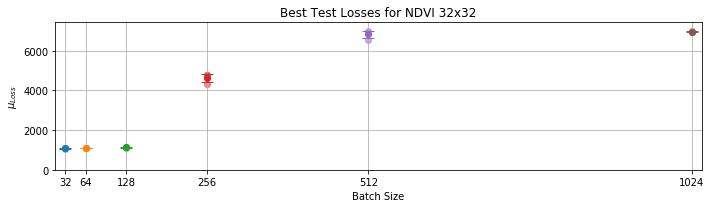

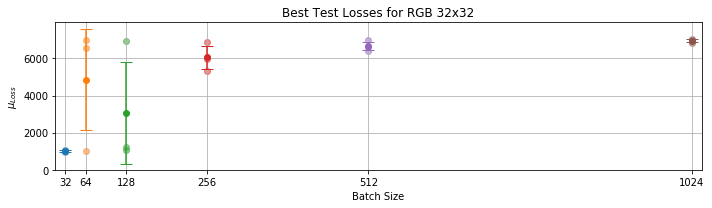

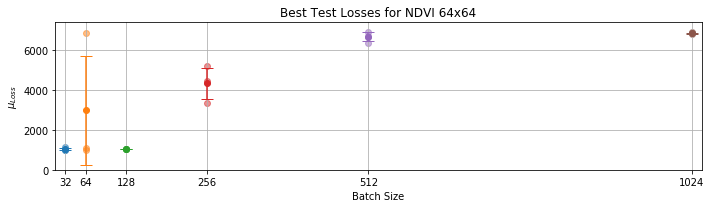

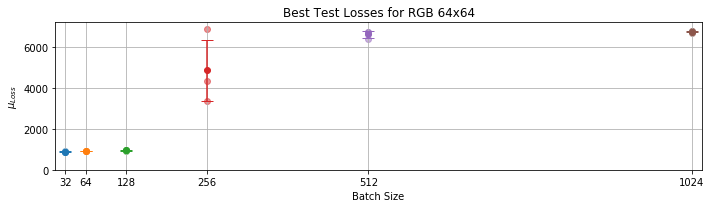

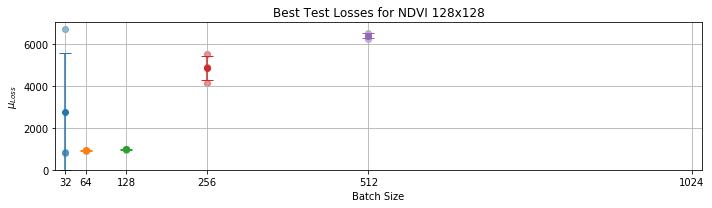

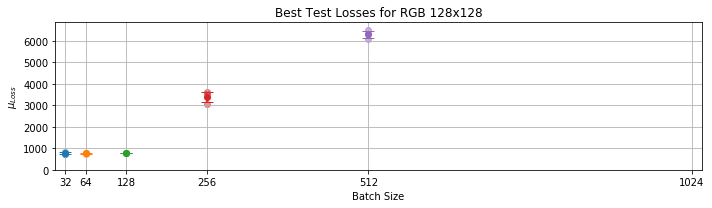

In [2]:
test_optimizer_batch_size(optimizer=None)

#### 1.1.2 RMSProp

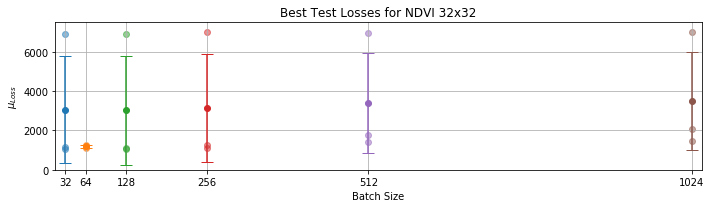

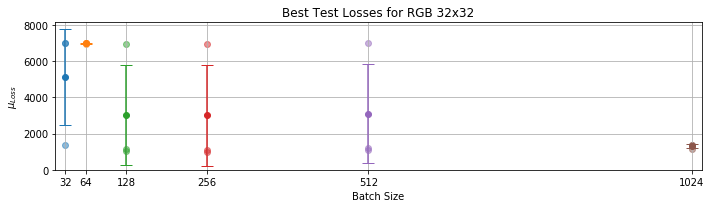

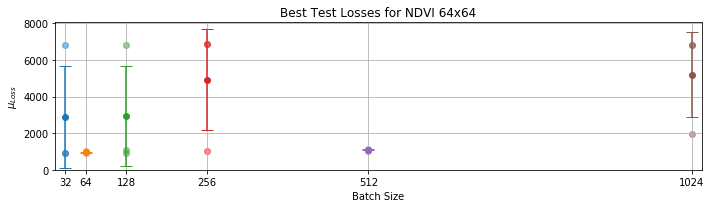

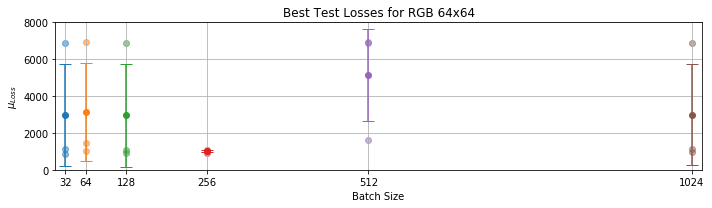

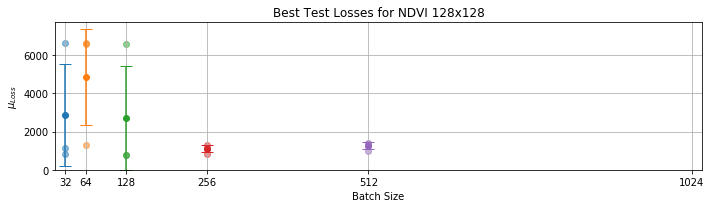

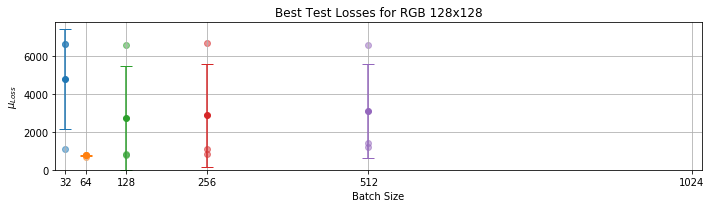

In [3]:
test_optimizer_batch_size(optimizer=optim.RMSprop)

#### 1.1.3 Adadelta

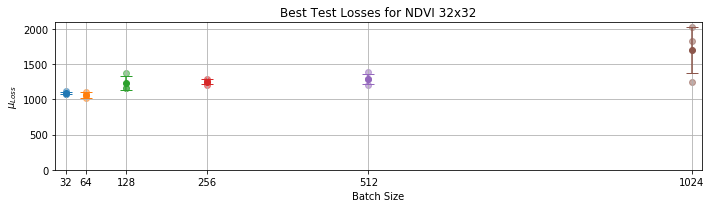

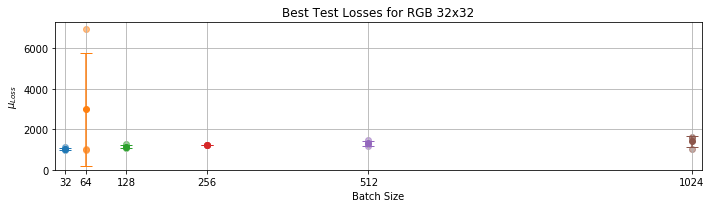

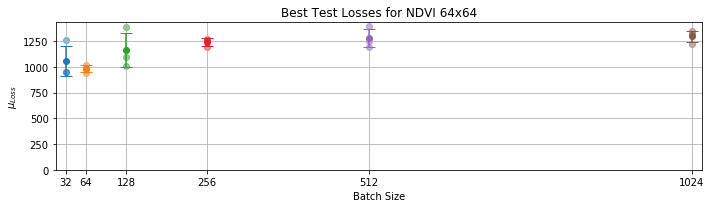

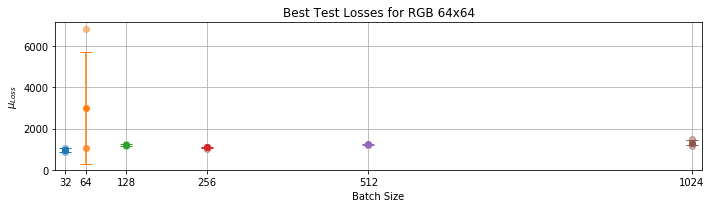

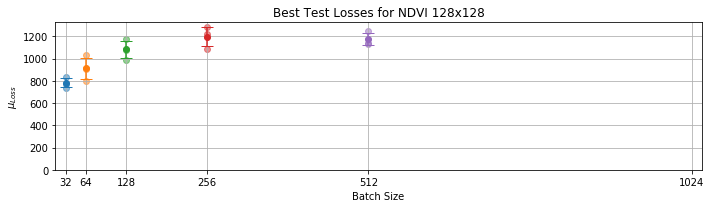

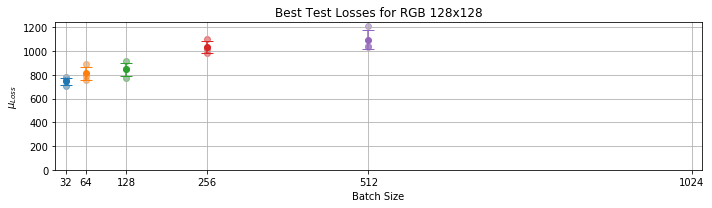

In [4]:
test_optimizer_batch_size(optimizer=optim.Adadelta)

#### 1.1.4 Conclusions

Here are the results from trying out multiple batch size in range $[2^5, 2^{10}]$. The results are given for each optimizer and dataset and presented in table below. The columns represent the batch sizes and the rows the batch-wise feasibilities for each optimizer and dataset. The possible outcomes are **feasible** (Y), **not feasible** (N) and **over the GPU memory limit** (-). 

The feasibility is determined by whether the optimizer was able to start minimizing the test error during three epochs. A telltale sign of the inability to minimize is when the values stay around the level of the median of the target values. This essentially means that the network produces values close to zero while the absolute target values are around 6500. As each dataset-optimizer-pair is initialized and trained three times, **a pair is feasible when majority of initializations provide sufficient minimization**. With three initialization this means that one non-minimizing initialization is within the threshold.

| *SGD*    | 32 | 64 | 128 | 256 | 512 | 1024 |
|----------|----|----|-----|-----|-----|------|
| NDVI 32  | Y  | Y  | Y   | Y   | N   | N    |
| RGB 32   | Y  | N  | Y   | Y   | N   | N    |
| NDVI 64  | Y  | Y  | Y   | Y   | N   | N    |
| RGB 64   | Y  | Y  | Y   | Y   | N   | N    |
| NDVI 128 | Y  | Y  | Y   | Y   | N   | -    |
| RGB 128  | Y  | Y  | Y   | Y   | N   | -    |

| *RMSprop* | 32 | 64 | 128 | 256 | 512 | 1024 |
|-----------|----|----|-----|-----|-----|------|
| NDVI 32   | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 32    | N  | N  | Y   | Y   | Y   | Y    |
| NDVI 64   | Y  | Y  | Y   | N   | Y   | N    |
| RGB 64    | Y  | Y  | Y   | Y   | N   | Y    |
| NDVI 128  | Y  | N  | Y   | Y   | Y   | -    |
| RGB 128   | N  | Y  | Y   | Y   | Y   | -    |

| *Adadelta* | 32 | 64 | 128 | 256 | 512 | 1024 |
|------------|----|----|-----|-----|-----|------|
| NDVI 32    | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 32     | Y  | Y  | Y   | Y   | Y   | Y    |
| NDVI 64    | Y  | Y  | Y   | Y   | Y   | Y    |
| RGB 64     | Y  | Y  | Y   | Y   | Y   | Y    |
| NDVI 128   | Y  | Y  | Y   | Y   | Y   | -    |
| RGB 128    | Y  | Y  | Y   | Y   | Y   | -    |

Adadelta seems to be the most robust while the RMSprop is the pickiest one. Also the way the RMSprop behaves induces mistrust towards it as it seems quite unreliable. **The comparison will thus continue with SGD and Adadelta only and with a fixed batch size of 128.** This is because they are reliable and do not seemingly randomly tend to fail to start initializing. This is the case with RMSprop, as there is no clear distinction in the setting that causes the optimization to fail. While SGD fails at times, it is clearly with higher batch sizes. RMSprop fails from the smallest to the largest  batch sizes.

### 1.2 Comparing with Distinct Datasets

We'll begin by looking at the NDVI datasets first. Initially we'll use a tad deeper topology, as it proved to have a large enough capacity to show distinction between training and test losses. This is a good thing as the model is able to fit better. This also makes the use of regularization viable in driving the test losses down. **Each model is trained for 50 epochs**.

Then we'll do the same comparison with RGB images. We will train each dataset with each of the optimizers and see how they manage.

In [1]:
import os
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]
optimizer_models_dir = os.path.join(model_settings.MODELS_DIR,'optimizer')
os.makedirs(optimizer_models_dir,exist_ok=True)

optimizers = [None, optim.Adadelta]

def test_optimizer(dataloader):
    losses = pd.DataFrame()
    for i, db in enumerate(dbs):
        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__
        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3
        for optimizer in optimizers:
            source_dim = 32*(2**i)
            if optimizer is not None:
                optim_name = 'Adadelta'
            else:
                optim_name = 'SGD'
            cnn = DroneYieldMeanCNN(
                source_bands=source_bands,
                source_dim=source_dim,
                cnn_layers=6,
                fc_layers=2,
                optimizer=optimizer)
            cnn.model_path = os.path.join(optimizer_models_dir,cnn.model_filename)
            print(cnn.model_path)
            losses_dict = cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            best_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
            losses.loc[source_dim,optim_name] = best_loss
    return losses

#### 1.2.1 NDVI Earlier Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_151633567_SGD_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1020.96


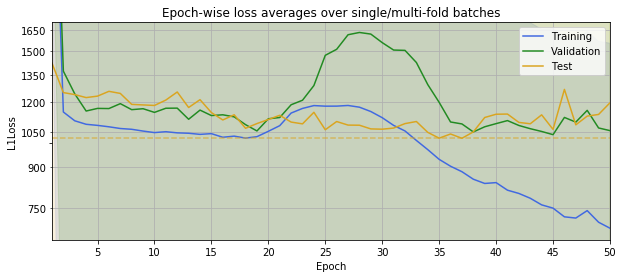

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_152359148_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1019.93


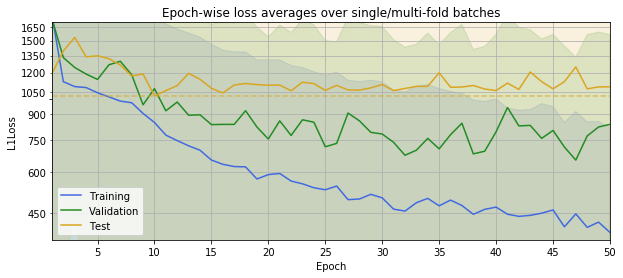

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_153142554_SGD_1x64x64_6cnn_2fc.pkl
Best Test Loss: 901.25


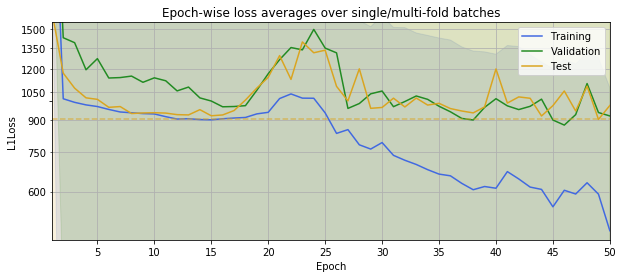

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_154229164_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 869.21


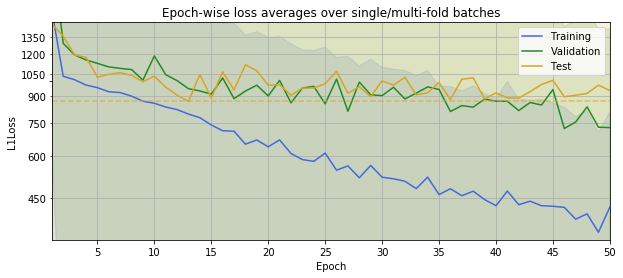

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_155330748_SGD_1x128x128_6cnn_2fc.pkl
Best Test Loss: 792.54


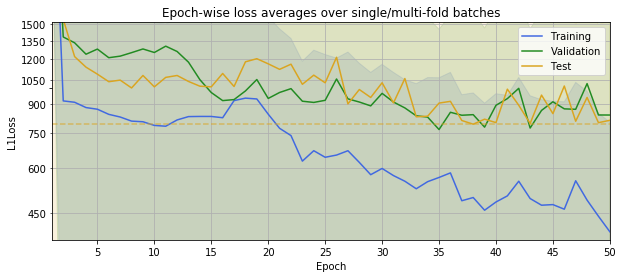

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_161536747_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 664.90


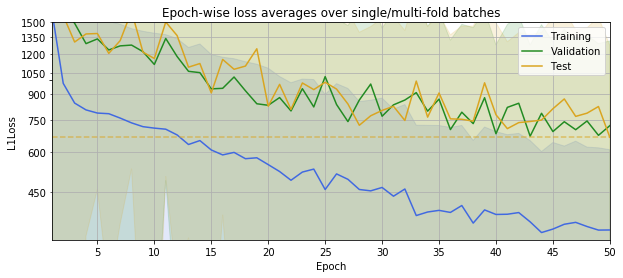

In [2]:
result_earlier_ndvi = test_optimizer(dataloader=dp.DroneNDVIEarlier)

#### 1.2.2 NDVI Later Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_163752026_SGD_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1403.98


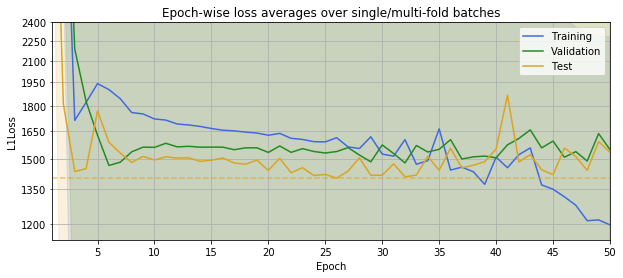

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_164535807_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1350.19


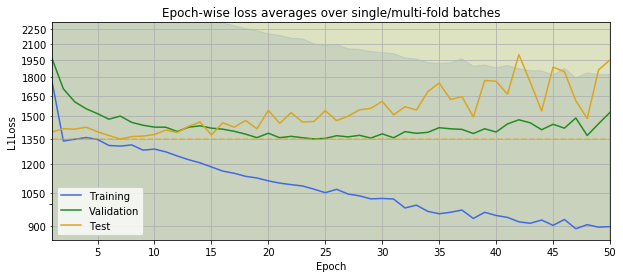

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_165334770_SGD_1x64x64_6cnn_2fc.pkl
Best Test Loss: 1310.73


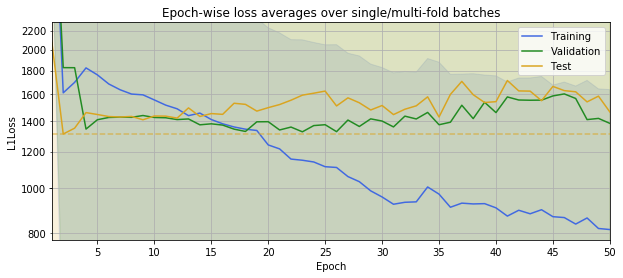

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_170424747_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 1118.56


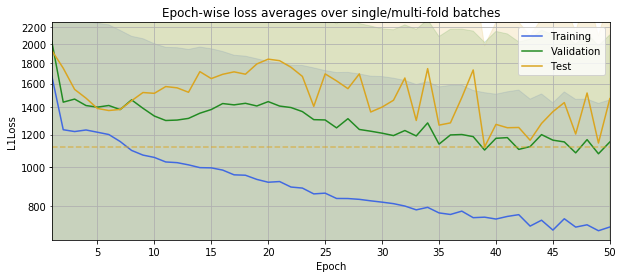

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_171528430_SGD_1x128x128_6cnn_2fc.pkl
Best Test Loss: 1170.83


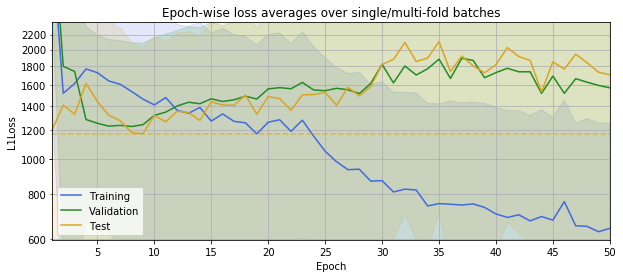

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_173714401_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 737.87


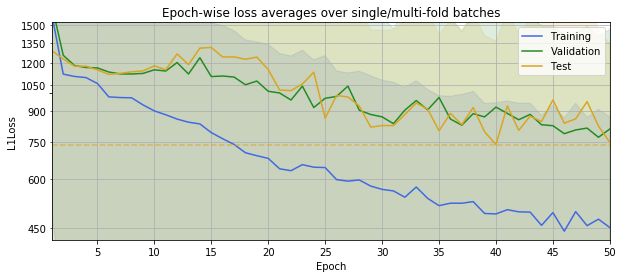

In [3]:
result_later_ndvi = test_optimizer(dataloader=dp.DroneNDVILater)

#### 1.2.3 RGB Earlier Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_175909741_SGD_3x32x32_6cnn_2fc.pkl
Best Test Loss: 1015.17


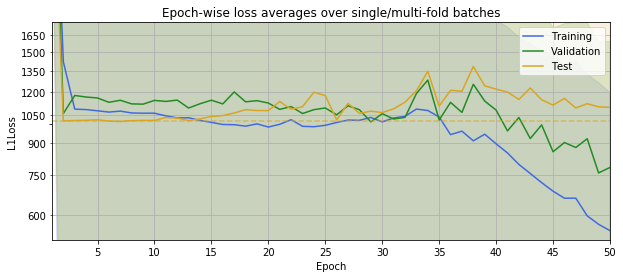

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_180733249_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 1099.81


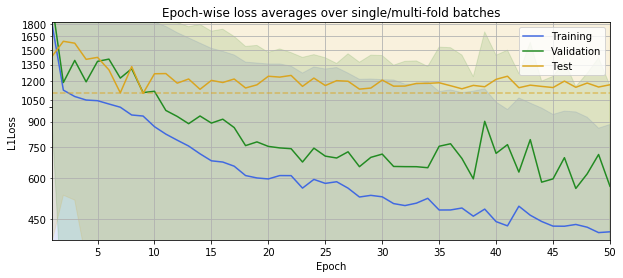

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_181610706_SGD_3x64x64_6cnn_2fc.pkl
Best Test Loss: 873.62


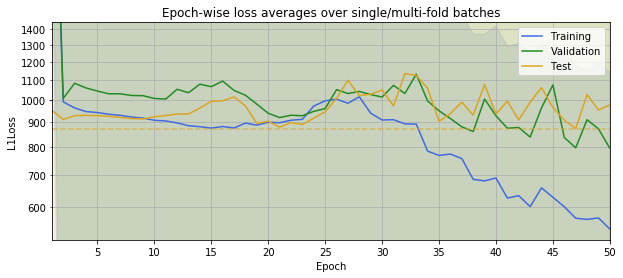

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_182826114_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 786.63


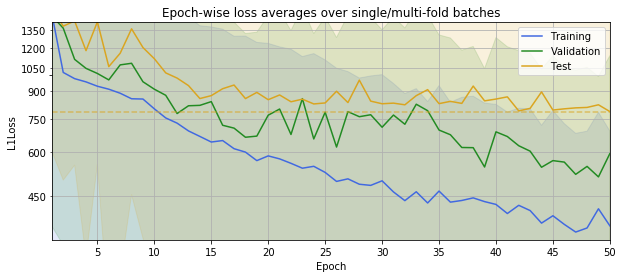

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_184051898_SGD_3x128x128_6cnn_2fc.pkl
Best Test Loss: 704.80


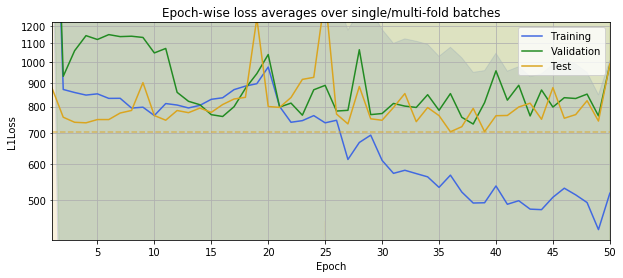

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_190804559_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 480.85


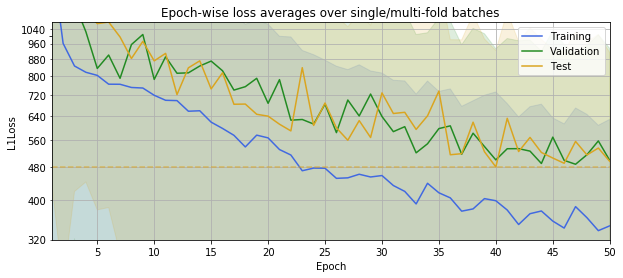

In [4]:
result_earlier_rgb = test_optimizer(dataloader=dp.DroneRGBEarlier)

#### 1.2.4 RGB Later Dataset

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_193527012_SGD_3x32x32_6cnn_2fc.pkl
Best Test Loss: 1028.20


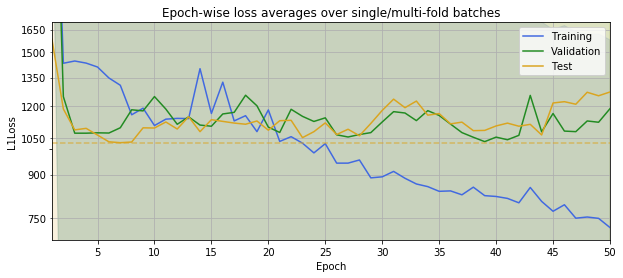

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_194334013_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 1109.56


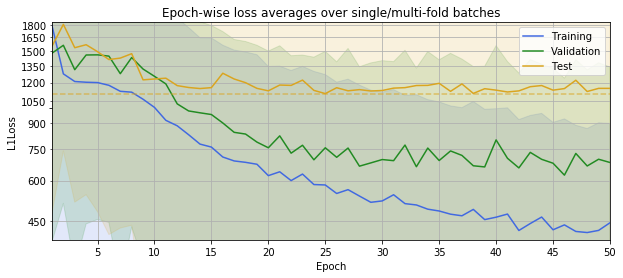

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_195156117_SGD_3x64x64_6cnn_2fc.pkl
Best Test Loss: 932.25


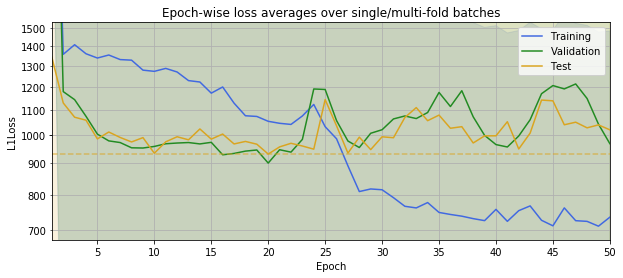

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_200331554_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 786.51


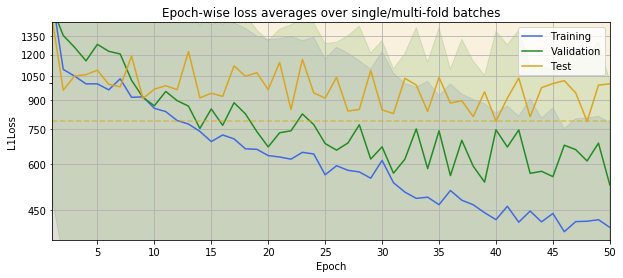

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_201518154_SGD_3x128x128_6cnn_2fc.pkl
Best Test Loss: 662.56


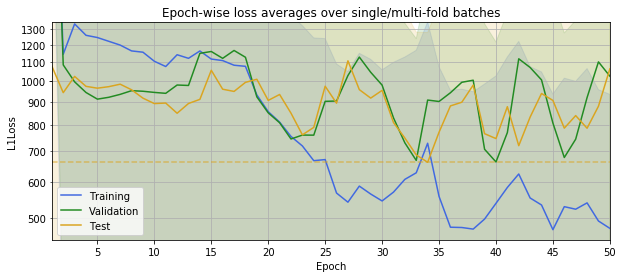

/home/nevavuor/crop-field-cnn/models/optimizer/20181209_203940240_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 377.23


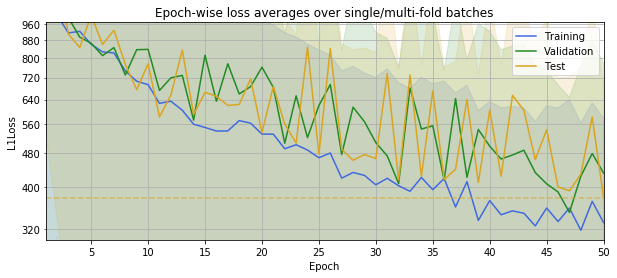

In [5]:
result_later_rgb = test_optimizer(dataloader=dp.DroneRGBLater)

### 1.4 Conclusion for the Optimizer

First we'll take a look at the test losses produced with distinct datasets for each optimizer.

In [6]:
pd.options.display.float_format = '{:.2f}'.format

#### 1.4.1 NDVI Datasets

The following tables show the best test L1-losses with distinct datasets and optimizers. The first table is for the earlier dataset with pre-July Drone NDVI images:

In [7]:
result_earlier_ndvi

,SGD,Adadelta
32,1020.96,1019.93
64,901.25,869.21
128,792.54,664.90


In [8]:
result_later_ndvi

,SGD,Adadelta
32,1403.98,1350.19
64,1310.73,1118.56
128,1170.83,737.87


#### 1.4.2 RGB Datasets

Let's pull up the tables for period-wise lowest L1-losses with only 50 epochs and no tuning. First one is the table for pre-July RGB datasets:

In [9]:
result_earlier_rgb

,SGD,Adadelta
32,1015.17,1099.81
64,873.62,786.63
128,704.80,480.85


In [10]:
result_later_rgb

,SGD,Adadelta
32,1028.20,1109.56
64,932.25,786.51
128,662.56,377.23


#### 1.4.3 Final Optimizer Conclusions

After ruling out the RMSprop in the optimal batch size exploration stage already the comparison was conducted between the SGD with momentum and Adadelta. Adadelta produced the best results out every training configuration. This means that it succeeded better in utilizing the capacity of the model. **We will thus use Adadelta as the optimizer.**

## 2. Optimal Depth

Next up is comparing several depths for the CNN component of the network. We will attempt at keeping the FC layers at two to really isolate the CNN performance. A good result is achieved when the network is able to even overfit. That means the capacity is sufficient and allows for the utilization of regularization to drive the test error down.

Even though the number of total trainings is high (48 distinct trainings), we will still go through them. In the later stages of the optimization we will use only some of the datasets if similar results are produced to the comparison of optimizers. We will also increase the number of epochs to see where the deeper models would progress.

In [3]:
import os
import pandas as pd
import numpy as np
from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

db_32 = 'field_analysis_10m_32px.db'
db_64 = 'field_analysis_20m_64px.db'
db_128 = 'field_analysis_40m_128px.db'
dbs = [db_32, db_64, db_128]
depth_models_dir = os.path.join(model_settings.MODELS_DIR,'depth')
results_dir = os.path.join(os.getcwd(),'results')
os.makedirs(depth_models_dir,exist_ok=True)
os.makedirs(results_dir,exist_ok=True)

def test_depth(dataloader, bands):
    depths = list(range(4, 14, 2))
    multi_index = pd.MultiIndex.from_product([[32,64,128],depths])
    losses = pd.DataFrame(index=['test','train'],columns=multi_index)
    for i, db in enumerate(dbs):
        dataset = dataloader(db_name=db)
        dataset_name = dataset.__class__.__name__
        source_bands = 1  # NDVI
        if 'RGB' in dataset_name:
            source_bands = 3
        for depth in depths:
            source_dim = 32*(2**i)
            cnn = DroneYieldMeanCNN(
                source_bands=bands,
                source_dim=source_dim,
                cnn_layers=depth,
                fc_layers=2,
                optimizer=optim.Adadelta)
            cnn.model_path = os.path.join(depth_models_dir,cnn.model_filename)
            print(cnn.model_path)
            losses_dict= cnn.train(
                epochs=50,
                training_data=dataset,
                k_cv_folds=3,
                suppress_output=True)
            best_test_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
            best_train_loss = np.array(losses_dict['training_losses_mean_std'])[:, 0].min()
            losses.loc['test',(source_dim,depth)] = best_test_loss
            losses.loc['train',(source_dim,depth)] = best_train_loss
    return losses

In [12]:
def test_depth_single(dataloader, bands, db, depth, dim):
    depths = list(range(4, 14, 2))
    multi_index = pd.MultiIndex.from_product([[32,64,128],depths])
    losses = pd.DataFrame(index=['test','train'],columns=multi_index)
    dataset = dataloader(db_name=db)
    dataset_name = dataset.__class__.__name__
    source_bands = 1  # NDVI
    if 'RGB' in dataset_name:
        source_bands = 3
    source_dim = dim
    cnn = DroneYieldMeanCNN(
        source_bands=bands,
        source_dim=source_dim,
        cnn_layers=depth,
        fc_layers=2,
        optimizer=optim.Adadelta)
    cnn.model_path = os.path.join(depth_models_dir,cnn.model_filename)
    print(cnn.model_path)
    losses_dict= cnn.train(
        epochs=50,
        training_data=dataset,
        k_cv_folds=3,
        suppress_output=True)
    best_test_loss = np.array(losses_dict['test_losses_mean_std'])[:, 0].min()
    best_train_loss = np.array(losses_dict['training_losses_mean_std'])[:, 0].min()
    losses.loc['test',(source_dim,depth)] = best_test_loss
    losses.loc['train',(source_dim,depth)] = best_train_loss
    return losses

### 2.1 Depth Comparisons

First, as with the optimizer, we'll go through the NDVI datasets. Then the RGB ones.

#### 2.1.1 NDVI Earlier Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181209_213346582_Adadelta_1x32x32_4cnn_2fc.pkl
Best Test Loss: 980.64


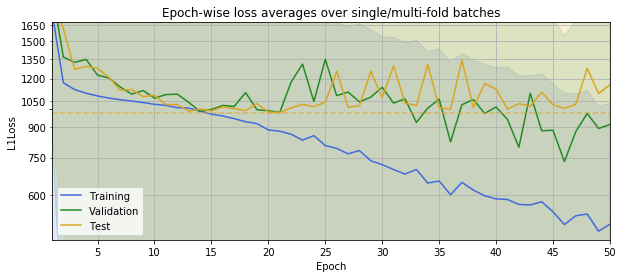

/home/nevavuor/crop-field-cnn/models/depth/20181209_214104568_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1102.42


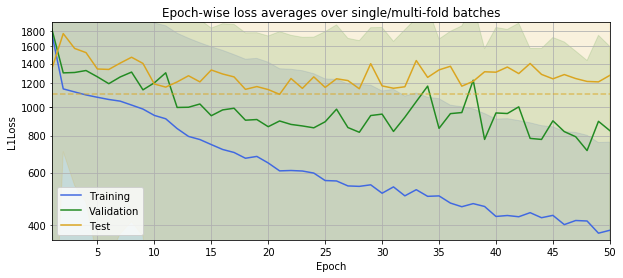

/home/nevavuor/crop-field-cnn/models/depth/20181209_214934640_Adadelta_1x32x32_8cnn_2fc.pkl
Best Test Loss: 1080.23


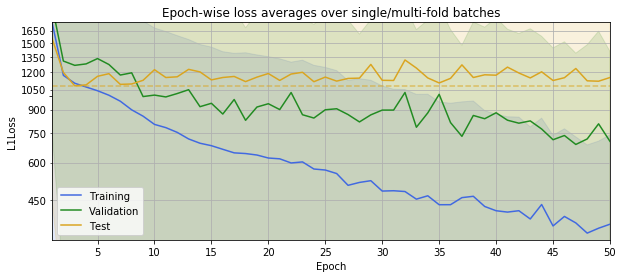

/home/nevavuor/crop-field-cnn/models/depth/20181209_215917717_Adadelta_1x32x32_10cnn_2fc.pkl
Best Test Loss: 1171.28


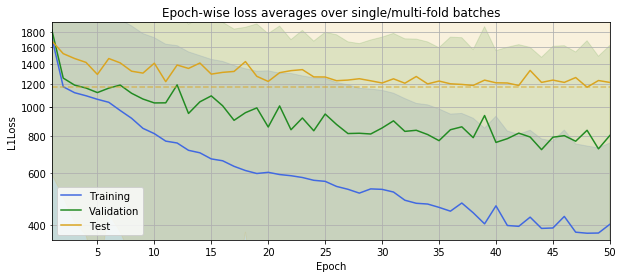

/home/nevavuor/crop-field-cnn/models/depth/20181209_221013809_Adadelta_1x32x32_12cnn_2fc.pkl
Best Test Loss: 1118.77


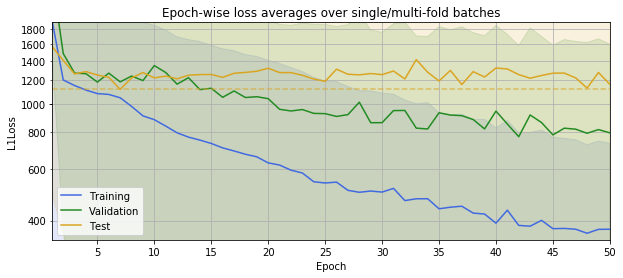

/home/nevavuor/crop-field-cnn/models/depth/20181209_222221969_Adadelta_1x64x64_4cnn_2fc.pkl
Best Test Loss: 802.34


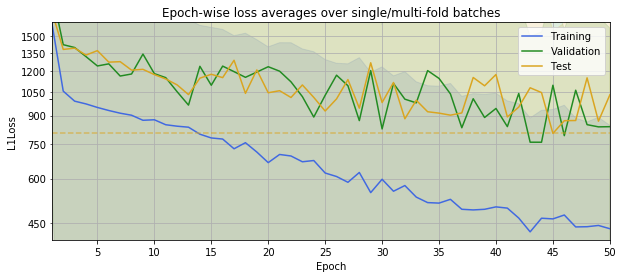

/home/nevavuor/crop-field-cnn/models/depth/20181209_223252093_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 848.58


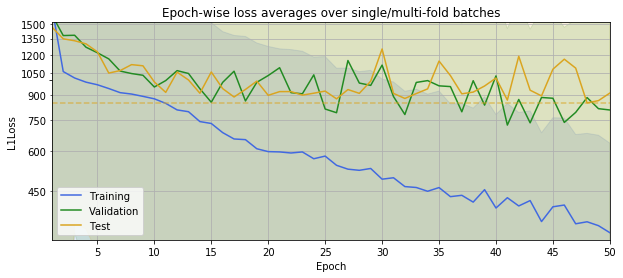

/home/nevavuor/crop-field-cnn/models/depth/20181209_224433699_Adadelta_1x64x64_8cnn_2fc.pkl
Best Test Loss: 884.02


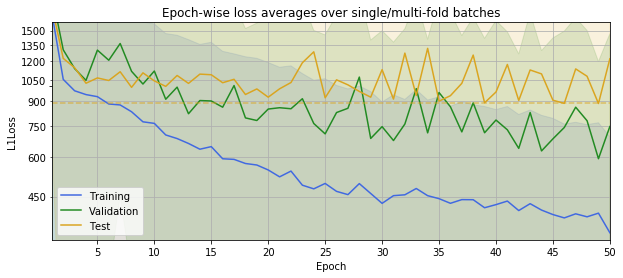

/home/nevavuor/crop-field-cnn/models/depth/20181209_225728572_Adadelta_1x64x64_10cnn_2fc.pkl
Best Test Loss: 952.11


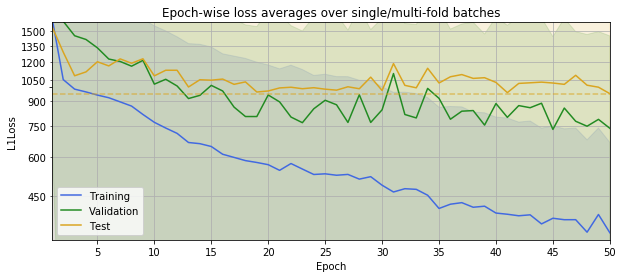

/home/nevavuor/crop-field-cnn/models/depth/20181209_231136289_Adadelta_1x64x64_12cnn_2fc.pkl
Best Test Loss: 937.99


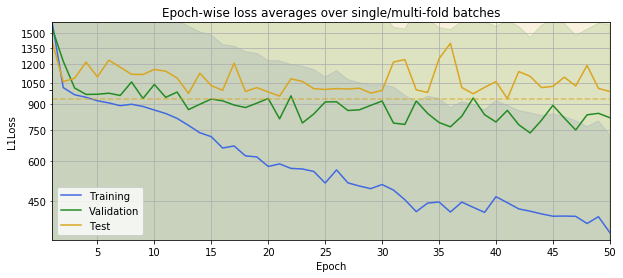

/home/nevavuor/crop-field-cnn/models/depth/20181209_232656463_Adadelta_1x128x128_4cnn_2fc.pkl
Best Test Loss: 640.68


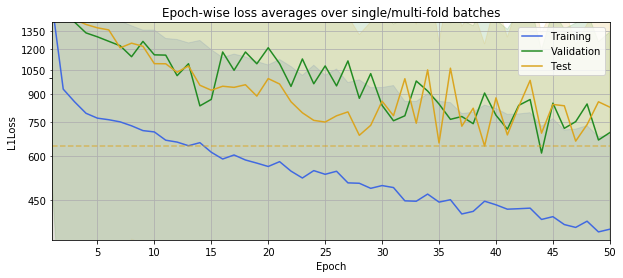

/home/nevavuor/crop-field-cnn/models/depth/20181209_234836255_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 544.44


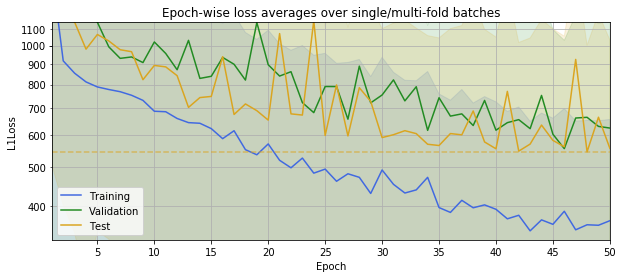

/home/nevavuor/crop-field-cnn/models/depth/20181210_001126286_Adadelta_1x128x128_8cnn_2fc.pkl
Best Test Loss: 553.77


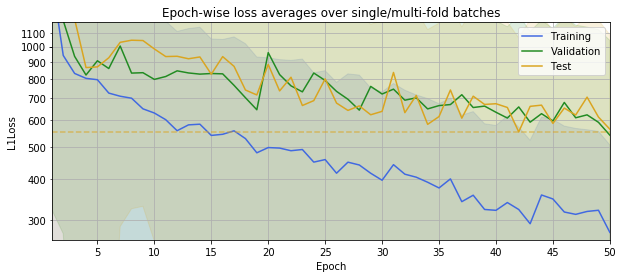

/home/nevavuor/crop-field-cnn/models/depth/20181210_003527396_Adadelta_1x128x128_10cnn_2fc.pkl
Best Test Loss: 602.17


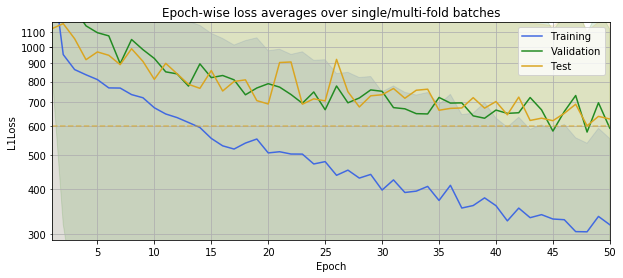

/home/nevavuor/crop-field-cnn/models/depth/20181210_010040758_Adadelta_1x128x128_12cnn_2fc.pkl
Best Test Loss: 546.72


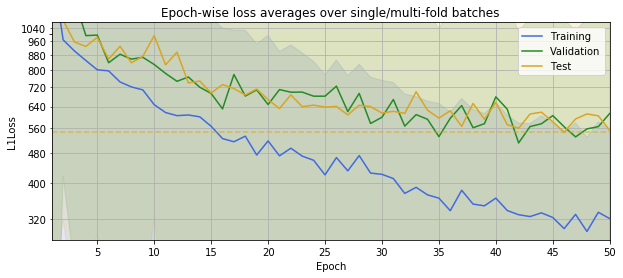

In [13]:
depth_ndvi_earlier = test_depth(dp.DroneNDVIEarlier, 1)
depth_ndvi_earlier.to_csv(os.path.join(results_dir,'depth_ndvi_earlier.csv'))

In [14]:
print("NDVI Earlier")
depth_ndvi_earlier

NDVI Earlier


32                                     64                        \
          4       6       8       10      12     4      6      8      10   
test  980.64 1102.42 1080.23 1171.28 1118.77 802.34 848.58 884.02 952.11   
train 484.53  374.91  349.40  375.02  361.99 425.45 332.51 346.28 345.30   

                128                              
          12     4      6      8      10     12  
test  937.99 640.68 544.44 553.77 602.17 546.72  
train 359.28 366.50 346.43 276.21 304.61 296.37

#### 2.1.2 NDVI Later Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181210_012706832_Adadelta_1x32x32_4cnn_2fc.pkl
Best Test Loss: 1485.00


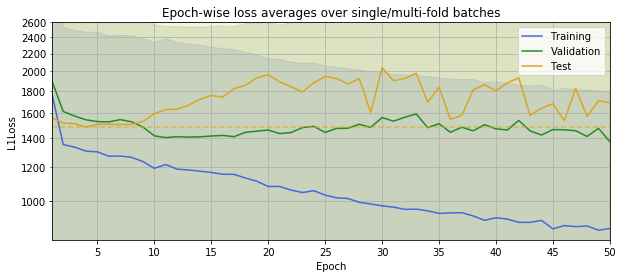

/home/nevavuor/crop-field-cnn/models/depth/20181210_013420710_Adadelta_1x32x32_6cnn_2fc.pkl
Best Test Loss: 1330.03


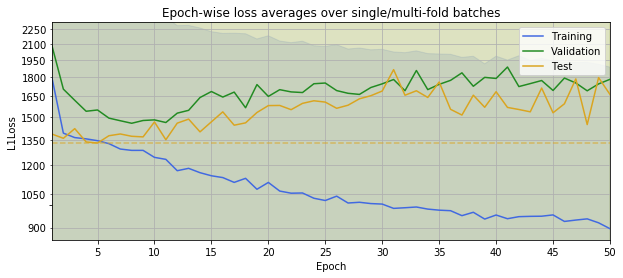

/home/nevavuor/crop-field-cnn/models/depth/20181210_014244753_Adadelta_1x32x32_8cnn_2fc.pkl
Best Test Loss: 1440.06


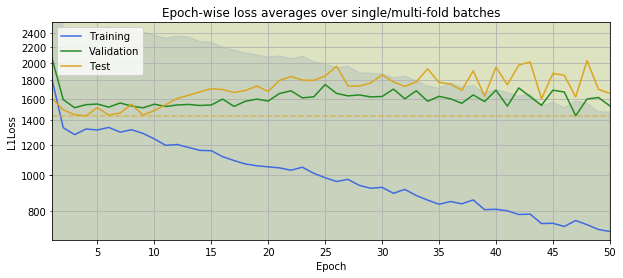

/home/nevavuor/crop-field-cnn/models/depth/20181210_015220329_Adadelta_1x32x32_10cnn_2fc.pkl
Best Test Loss: 1377.93


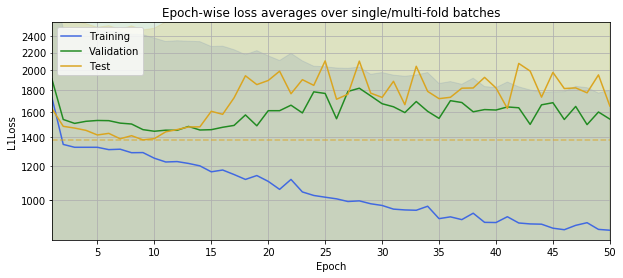

/home/nevavuor/crop-field-cnn/models/depth/20181210_020306006_Adadelta_1x32x32_12cnn_2fc.pkl
Best Test Loss: 1347.98


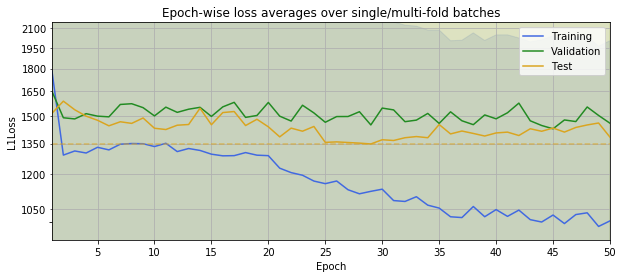

/home/nevavuor/crop-field-cnn/models/depth/20181210_021503756_Adadelta_1x64x64_4cnn_2fc.pkl
Best Test Loss: 1288.19


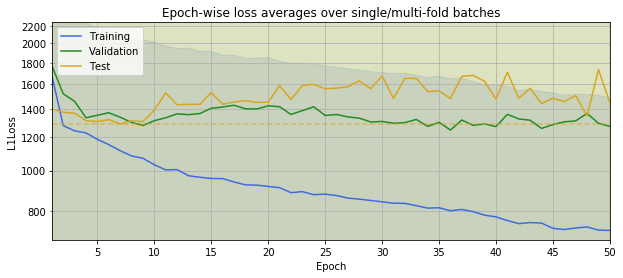

/home/nevavuor/crop-field-cnn/models/depth/20181210_022525890_Adadelta_1x64x64_6cnn_2fc.pkl
Best Test Loss: 1152.18


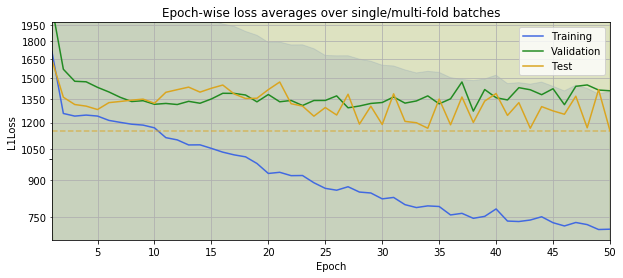

/home/nevavuor/crop-field-cnn/models/depth/20181210_023657174_Adadelta_1x64x64_8cnn_2fc.pkl
Best Test Loss: 1187.06


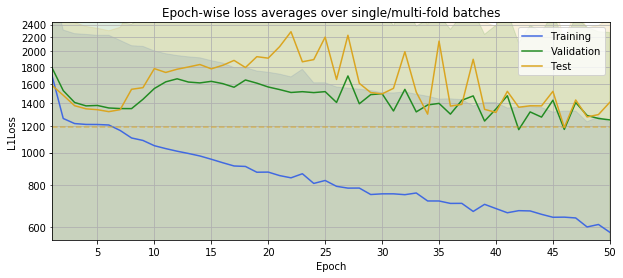

/home/nevavuor/crop-field-cnn/models/depth/20181210_024939158_Adadelta_1x64x64_10cnn_2fc.pkl
Best Test Loss: 1109.41


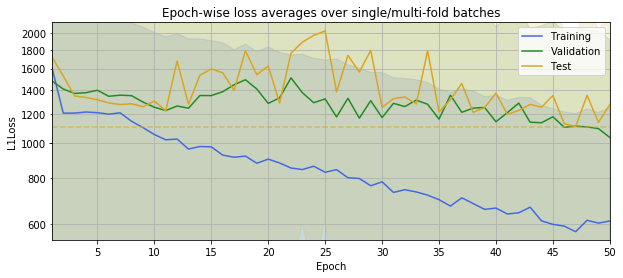

/home/nevavuor/crop-field-cnn/models/depth/20181210_030333209_Adadelta_1x64x64_12cnn_2fc.pkl
Best Test Loss: 1195.00


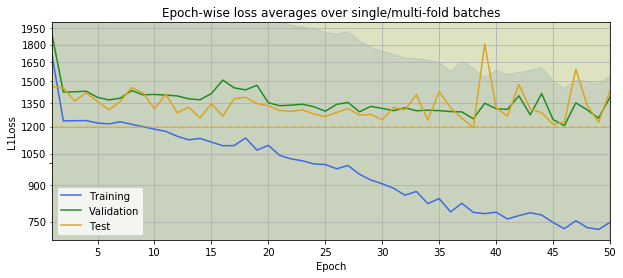

/home/nevavuor/crop-field-cnn/models/depth/20181210_031837883_Adadelta_1x128x128_4cnn_2fc.pkl
Best Test Loss: 691.10


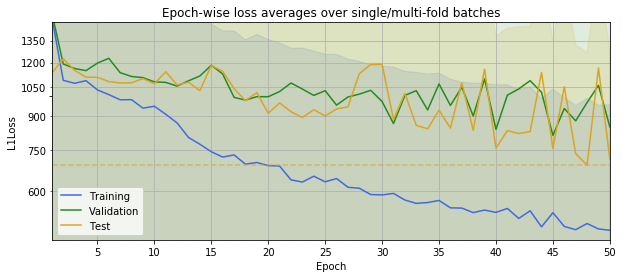

/home/nevavuor/crop-field-cnn/models/depth/20181210_033949065_Adadelta_1x128x128_6cnn_2fc.pkl
Best Test Loss: 658.53


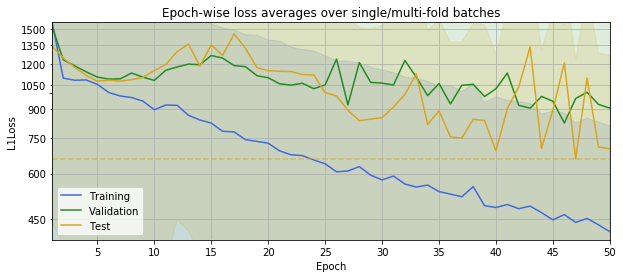

/home/nevavuor/crop-field-cnn/models/depth/20181210_040203922_Adadelta_1x128x128_8cnn_2fc.pkl
Best Test Loss: 1004.03


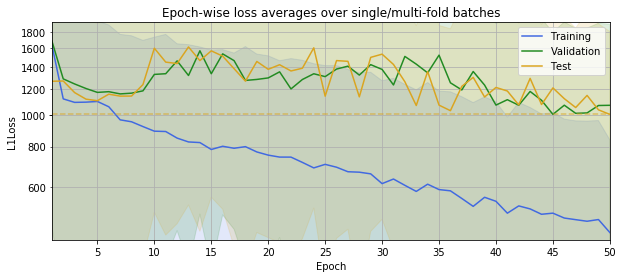

/home/nevavuor/crop-field-cnn/models/depth/20181210_042527686_Adadelta_1x128x128_10cnn_2fc.pkl
Best Test Loss: 960.70


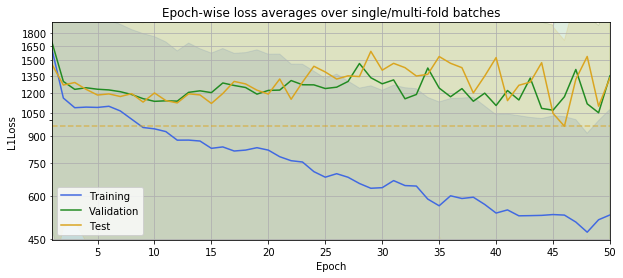

/home/nevavuor/crop-field-cnn/models/depth/20181210_045000291_Adadelta_1x128x128_12cnn_2fc.pkl
Best Test Loss: 1117.42


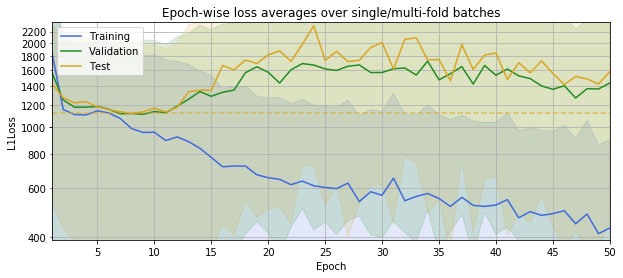

In [15]:
depth_ndvi_later = test_depth(dp.DroneNDVILater, 1)
depth_ndvi_later.to_csv(os.path.join(results_dir,'depth_ndvi_later.csv'))

In [16]:
print("NDVI Later")
depth_ndvi_later

NDVI Later


32                                      64                           \
           4       6       8       10      12      4       6       8       10   
test  1485.00 1330.03 1440.06 1377.93 1347.98 1288.19 1152.18 1187.06 1109.41   
train  854.90  895.64  704.94  849.34  982.00  721.34  703.65  579.09  571.46   

                 128                                
           12     4      6       8      10      12  
test  1195.00 691.10 658.53 1004.03 960.70 1117.42  
train  721.74 486.73 415.39  435.82 470.81  412.74

##### Re-training poorly initialized models

In [23]:
# depth_ndvi_later_single = test_depth_single(dp.DroneNDVILater, 1, db_64, 10, 64)

In [48]:
# depth_ndvi_later.loc[:,('64','10')] = depth_ndvi_later_single.loc[:,(64,10)]
# depth_ndvi_later.to_csv(os.path.join(results_dir,'depth_ndvi_later.csv'))

#### 2.1.3 RGB Earlier Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181210_051543909_Adadelta_3x32x32_4cnn_2fc.pkl
Best Test Loss: 1034.48


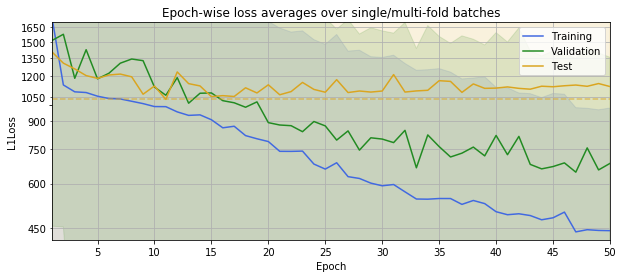

/home/nevavuor/crop-field-cnn/models/depth/20181210_052331485_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 1122.49


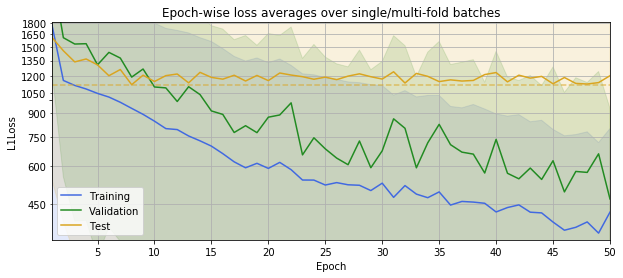

/home/nevavuor/crop-field-cnn/models/depth/20181210_053231179_Adadelta_3x32x32_8cnn_2fc.pkl
Best Test Loss: 1115.33


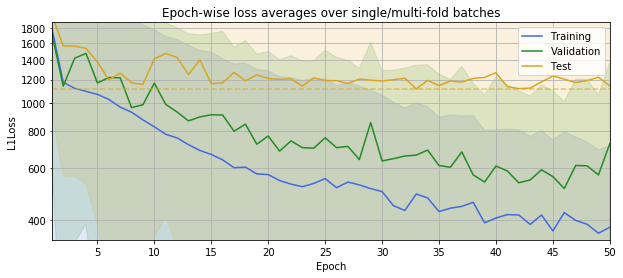

/home/nevavuor/crop-field-cnn/models/depth/20181210_054243007_Adadelta_3x32x32_10cnn_2fc.pkl
Best Test Loss: 1059.74


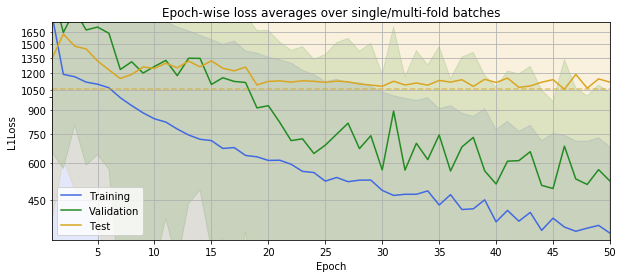

/home/nevavuor/crop-field-cnn/models/depth/20181210_055407372_Adadelta_3x32x32_12cnn_2fc.pkl
Best Test Loss: 1090.47


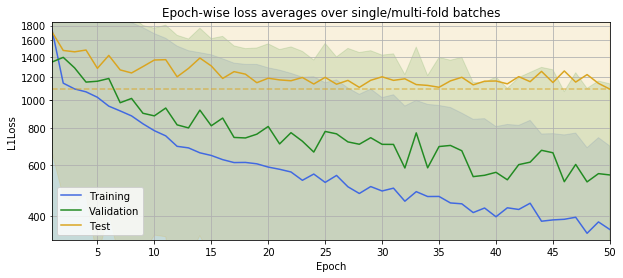

/home/nevavuor/crop-field-cnn/models/depth/20181210_060643246_Adadelta_3x64x64_4cnn_2fc.pkl
Best Test Loss: 797.94


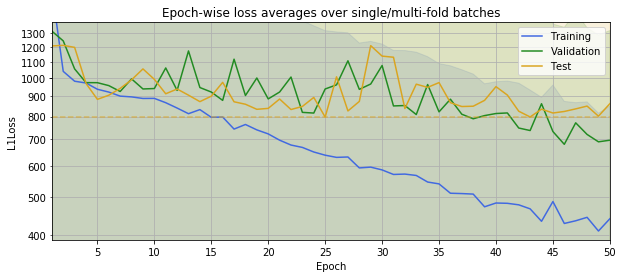

/home/nevavuor/crop-field-cnn/models/depth/20181210_061824972_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 810.63


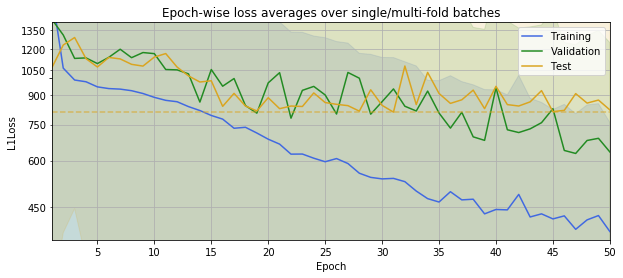

/home/nevavuor/crop-field-cnn/models/depth/20181210_063115737_Adadelta_3x64x64_8cnn_2fc.pkl
Best Test Loss: 814.61


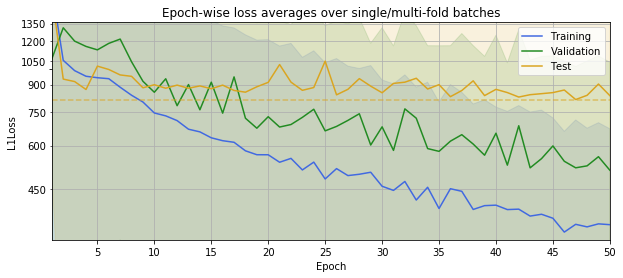

/home/nevavuor/crop-field-cnn/models/depth/20181210_064519552_Adadelta_3x64x64_10cnn_2fc.pkl
Best Test Loss: 851.76


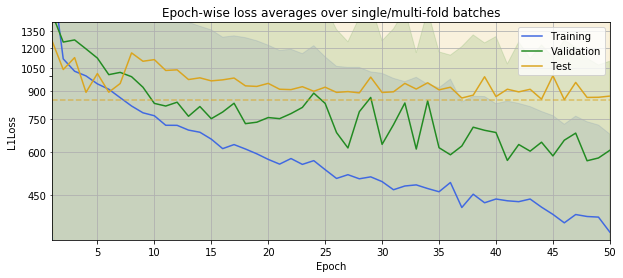

/home/nevavuor/crop-field-cnn/models/depth/20181210_070036099_Adadelta_3x64x64_12cnn_2fc.pkl
Best Test Loss: 883.73


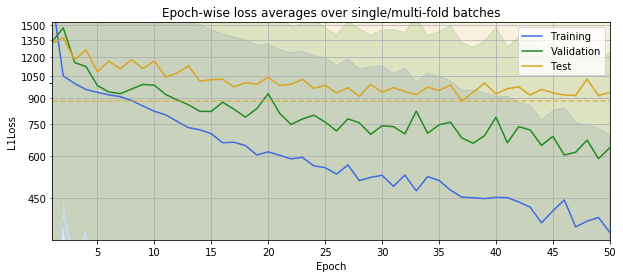

/home/nevavuor/crop-field-cnn/models/depth/20181210_071702632_Adadelta_3x128x128_4cnn_2fc.pkl
Best Test Loss: 623.04


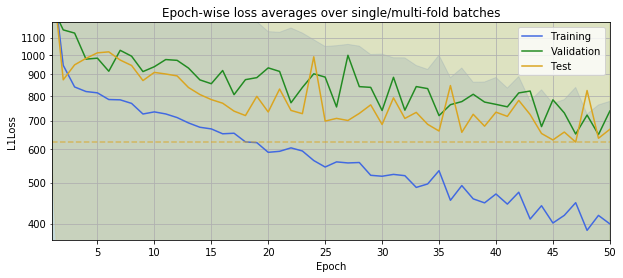

/home/nevavuor/crop-field-cnn/models/depth/20181210_074326392_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 465.37


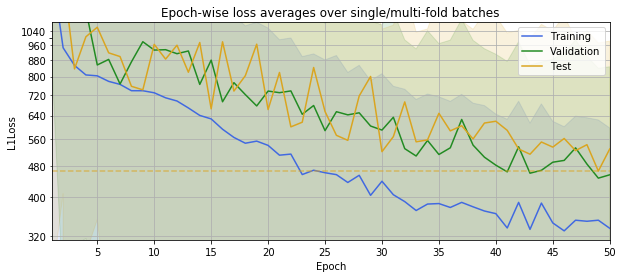

/home/nevavuor/crop-field-cnn/models/depth/20181210_081055260_Adadelta_3x128x128_8cnn_2fc.pkl
Best Test Loss: 543.40


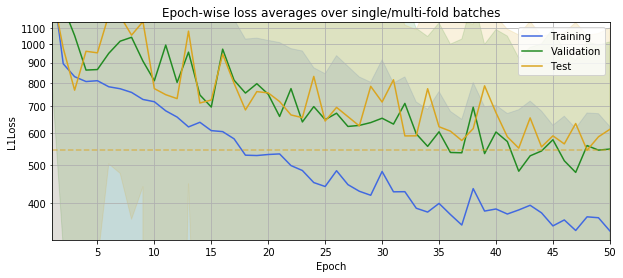

/home/nevavuor/crop-field-cnn/models/depth/20181210_083941540_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 479.14


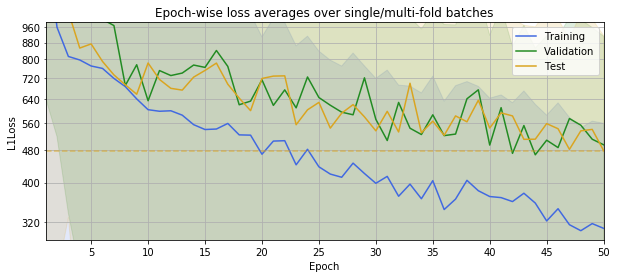

/home/nevavuor/crop-field-cnn/models/depth/20181210_090940864_Adadelta_3x128x128_12cnn_2fc.pkl
Best Test Loss: 612.97


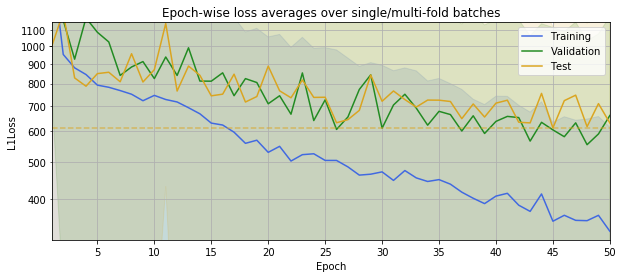

In [17]:
depth_rgb_earlier = test_depth(dp.DroneRGBEarlier, 3)
depth_rgb_earlier.to_csv(os.path.join(results_dir,'depth_rgb_earlier.csv'))

In [18]:
print("RGB Earlier")
depth_rgb_earlier

RGB Earlier


32                                     64                        \
           4       6       8       10      12     4      6      8      10   
test  1034.48 1122.49 1115.33 1059.74 1090.47 797.94 810.63 814.61 851.76   
train  438.80  359.33  361.25  349.67  350.02 410.20 386.67 337.24 350.88   

                128                              
          12     4      6      8      10     12  
test  883.73 623.04 465.37 543.40 479.14 612.97  
train 353.26 385.45 330.30 341.51 305.19 329.89

#### 2.1.4 RGB Later Dataset

/home/nevavuor/crop-field-cnn/models/depth/20181210_094052509_Adadelta_3x32x32_4cnn_2fc.pkl
Best Test Loss: 1050.04


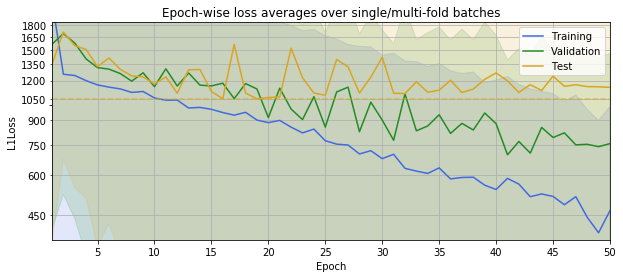

/home/nevavuor/crop-field-cnn/models/depth/20181210_094810693_Adadelta_3x32x32_6cnn_2fc.pkl
Best Test Loss: 1086.09


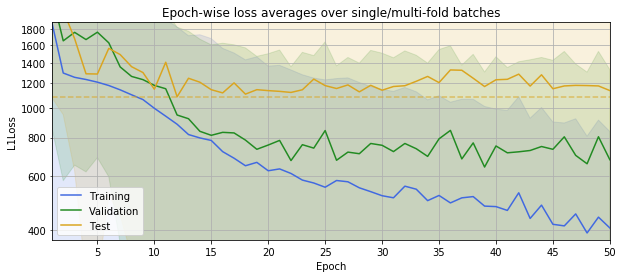

/home/nevavuor/crop-field-cnn/models/depth/20181210_095631921_Adadelta_3x32x32_8cnn_2fc.pkl
Best Test Loss: 6779.43


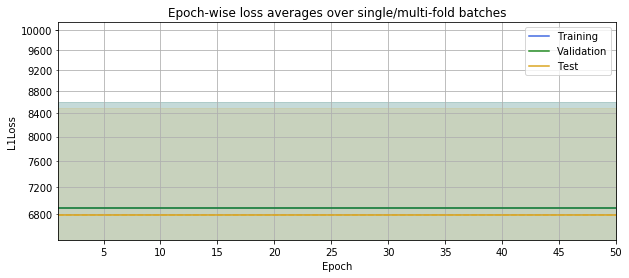

/home/nevavuor/crop-field-cnn/models/depth/20181210_100557588_Adadelta_3x32x32_10cnn_2fc.pkl
Best Test Loss: 1091.61


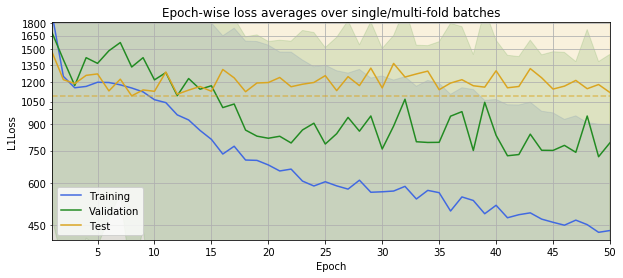

/home/nevavuor/crop-field-cnn/models/depth/20181210_101628998_Adadelta_3x32x32_12cnn_2fc.pkl
Best Test Loss: 1136.40


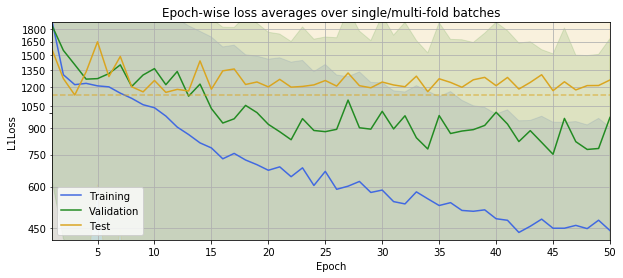

/home/nevavuor/crop-field-cnn/models/depth/20181210_102803823_Adadelta_3x64x64_4cnn_2fc.pkl
Best Test Loss: 679.95


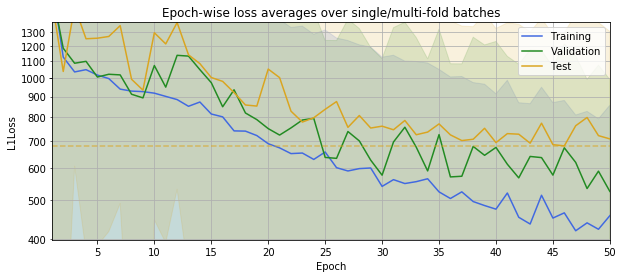

/home/nevavuor/crop-field-cnn/models/depth/20181210_103846762_Adadelta_3x64x64_6cnn_2fc.pkl
Best Test Loss: 813.52


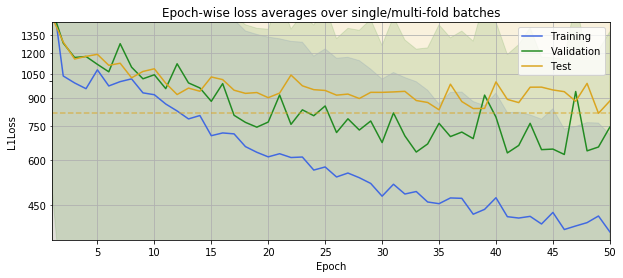

/home/nevavuor/crop-field-cnn/models/depth/20181210_105032562_Adadelta_3x64x64_8cnn_2fc.pkl
Best Test Loss: 823.22


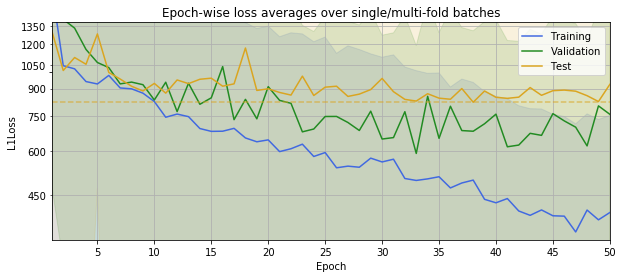

/home/nevavuor/crop-field-cnn/models/depth/20181210_110320551_Adadelta_3x64x64_10cnn_2fc.pkl
Best Test Loss: 868.47


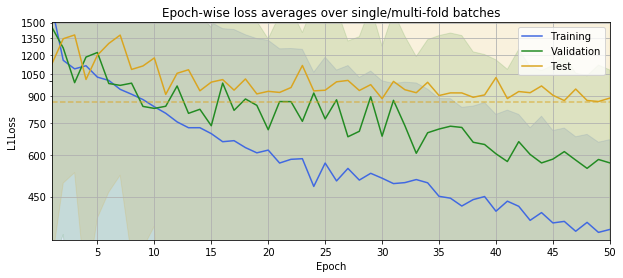

/home/nevavuor/crop-field-cnn/models/depth/20181210_111712654_Adadelta_3x64x64_12cnn_2fc.pkl
Best Test Loss: 839.32


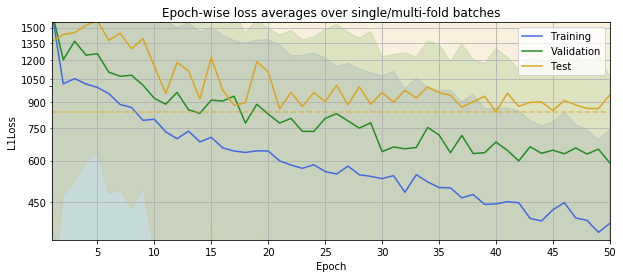

/home/nevavuor/crop-field-cnn/models/depth/20181210_113206101_Adadelta_3x128x128_4cnn_2fc.pkl
Best Test Loss: 394.87


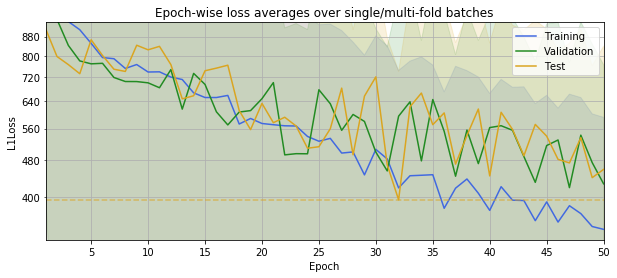

/home/nevavuor/crop-field-cnn/models/depth/20181210_115555259_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 372.63


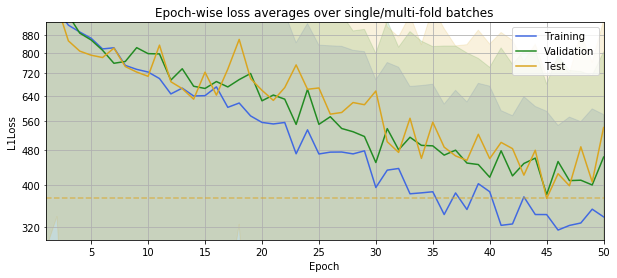

/home/nevavuor/crop-field-cnn/models/depth/20181210_122040158_Adadelta_3x128x128_8cnn_2fc.pkl
Best Test Loss: 481.72


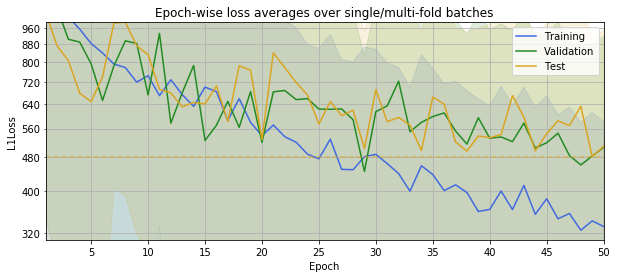

/home/nevavuor/crop-field-cnn/models/depth/20181210_124627101_Adadelta_3x128x128_10cnn_2fc.pkl
Best Test Loss: 456.73


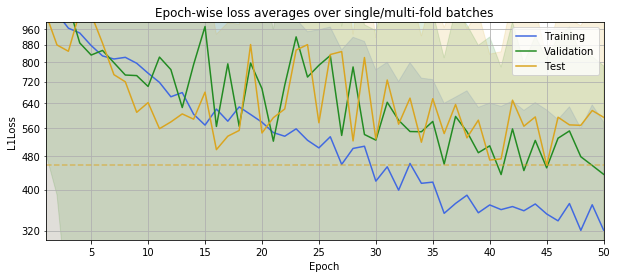

/home/nevavuor/crop-field-cnn/models/depth/20181210_131315988_Adadelta_3x128x128_12cnn_2fc.pkl
Best Test Loss: 463.30


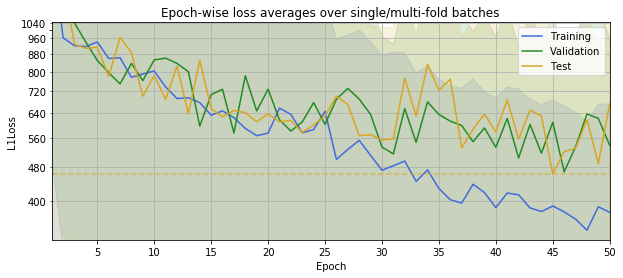

In [19]:
depth_rgb_later = test_depth(dp.DroneRGBLater, 3)
depth_rgb_later.to_csv(os.path.join(results_dir,'depth_rgb_later.csv'))

In [20]:
print("RGB Later")
depth_rgb_later

RGB Later


32                                     64                        \
           4       6       8       10      12     4      6      8      10   
test  1050.04 1086.09 6779.43 1091.61 1136.40 679.95 813.52 823.22 868.47   
train  394.72  390.92 6891.34  428.49  435.83 420.01 377.70 353.15 351.25   

                128                              
          12     4      6      8      10     12  
test  839.32 394.87 372.63 481.72 456.73 463.30  
train 365.71 341.63 315.47 324.44 320.40 342.58

##### Re-training poorly initialized models

/home/nevavuor/crop-field-cnn/models/depth/20181210_200941977_Adadelta_3x32x32_8cnn_2fc.pkl
Best Test Loss: 1175.59


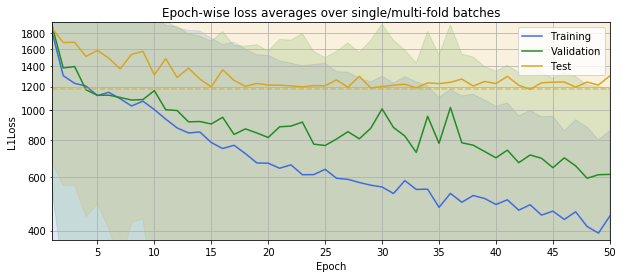

In [28]:
depth_rgb_later_single = test_depth_single(dp.DroneRGBLater, 3, db_32, 8, 32)

In [29]:
depth_rgb_later.loc[:,('32','8')] =  depth_rgb_later_single.loc[:,(32,8)]
depth_rgb_later.to_csv(os.path.join(results_dir,'depth_rgb_later.csv'))

### 2.3 Conclusion for the Depth

With so many numbers it is actually starting to get a bit hard to grasp the progression. We therefore take these numbers and plot them  out. The error values for the unfitted will be handled as `NaN`s to ensure proper scaling of the plots. The plotted areas use the training error as the upper bound and the test error as the lower bound.

In [4]:
import pandas as pd
import numpy as np
import os

depth_ndvi_earlier=pd.read_csv(os.path.join(results_dir,'depth_ndvi_earlier.csv'),index_col=0,header=[0,1])
depth_ndvi_later=pd.read_csv(os.path.join(results_dir,'depth_ndvi_later.csv'),index_col=0,header=[0,1])
depth_rgb_earlier=pd.read_csv(os.path.join(results_dir,'depth_rgb_earlier.csv'),index_col=0,header=[0,1])
depth_rgb_later=pd.read_csv(os.path.join(results_dir,'depth_rgb_later.csv'),index_col=0,header=[0,1])

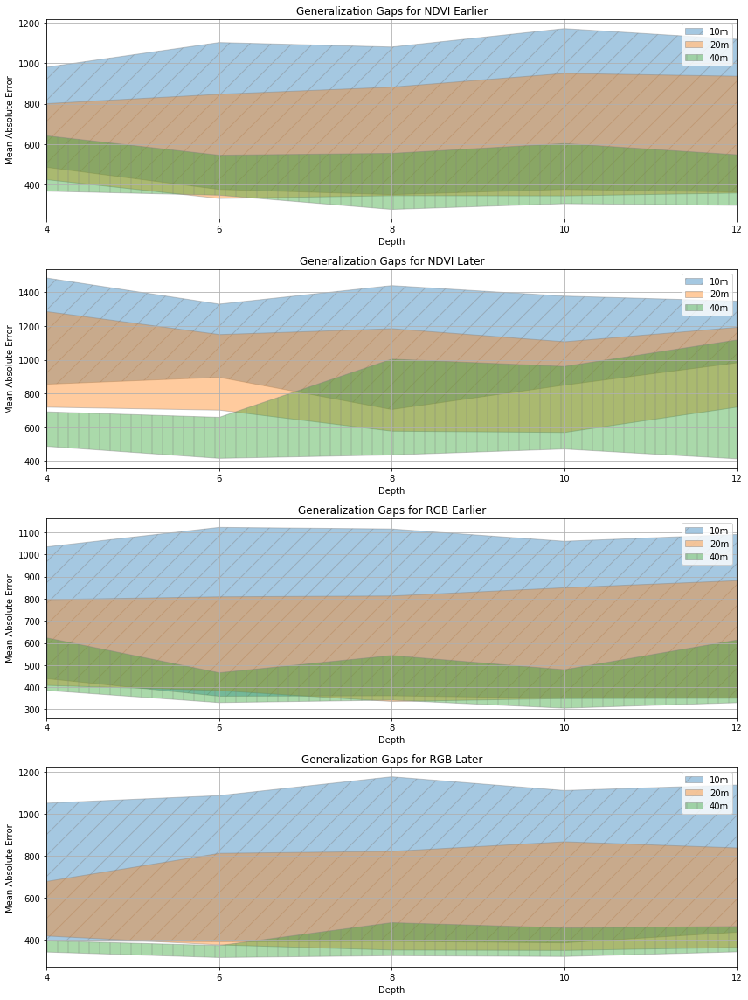

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os 

plt.rcParams['figure.figsize'] = 12, 16
hatches = ['/', None, '|']
x = list(range(4, 14, 2))
result_sets = [depth_ndvi_earlier, depth_ndvi_later, depth_rgb_earlier ,depth_rgb_later]
result_set_names = ['NDVI Earlier','NDVI Later','RGB Earlier','RGB Later']
for i, label in enumerate(['10m', '20m', '40m']):
    window_px = str(32*2**i)
    for j, result_set in enumerate(result_sets):
        plt.subplot(411+j)
        plt.fill_between(x, 
                         list(result_set.loc['train',window_px].values), 
                         list(result_set.loc['test',window_px].values),
                         label=label, 
                         hatch=hatches[i], 
                         edgecolor='gray', 
                         alpha=0.4)
        plt.xticks(x)
        plt.xlim([4, 12])
        plt.legend()
        plt.grid()
        plt.xlabel("Depth")
        plt.ylabel("Mean Absolute Error")
        plt.title(f"Generalization Gaps for {result_set_names[j]}")
plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'results','cnn-depth.png'),
            dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

The optimal result is achieved with **depth of 6 layers and the 128px/40m image dataset**. The test losses are however notably lower for the RGB images than for the NDVI images.

## 3. Regularization

We have already concluded that the optimal optimizer to use is the Adadelta and the optimal CNN depth is 8 layers. We have also concluded as a side product of the optimal depth research that minimal test loss is best achieved using 128px RGB datasets. Now it is time to attempt at drivin the test loss down by means of regularization. We have two possibilities, early stopping and weight decay.

The hyperparameter for the early stopping is the number of consecutive non-improving training iterations to perform before terminating the training. We will also implement a second boolean hyperparameter for whether to continue training after first termination. The hyperparameter for the weight decay is the decay coefficient. We will try out several values with random search. Thus we will try out a fixed amount of trainings and see which one of them produces the lowest test error.

We will set the hyperparameter value ranges as follows:

- Early stopping (`patience`): $[10, ... , 50]$
- Weight decay (`weight_decay`): $[0.0, ... , 1.0]$

While this is just a comparison, we'll continue using a limited amount of epochs to see how the overall progression of the training proceeds. We'll also proceed byt first testing the weight decay and only after that the early stopping. This is because the training times grow exceedingly after the number of epochs is in ballpark where early stopping is able to show its effectiveness.

In [1]:
import os
import shutil

import numpy as np
import pandas as pd
import torch
from torch import optim

from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings
%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
EPOCHS = 50
regularized_models_dir = os.path.join(model_settings.MODELS_DIR,'regularization')
os.makedirs(regularized_models_dir,exist_ok=True)


def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(regularized_models_dir,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)
    else:
        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

### 3.1 Initializing Networks

Before we delve deeper in to comparing the performance metrics with varying hyperparametervalues, we will initialize a network with no further training. This is to ensure that all the runs are performed with equally initialized model and.

#### 3.1.1 RGB Earlier Dataset

First we train the initial model for earlier dataset.

In [2]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=6,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=False, save=True)

Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181210_202836044_Adadelta_3x128x128_6cnn_2fc.pkl
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/20181210_202836044_Adadelta_3x128x128_6cnn_2fc.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl


#### 3.1.2 RGB Later Dataset

Then we train the later dataset initial model.

In [3]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=6,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=True, save=True)

Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181210_202836473_Adadelta_3x128x128_6cnn_2fc.pkl
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/20181210_202836473_Adadelta_3x128x128_6cnn_2fc.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_later.pkl


### 3.2 Benchmark Trainings

We will first perform benchmark trainings with no regularization. This is to see where the training would progress. We will then compare the regularized trainings to these to see the level of improvement attained.

#### 3.2.1 RGB Earlier Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_202836856_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_202836856_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (1m 55s) 	Mean Loss:	Train=815.76 +-726.07	Test=789.73 +-739.62
[   6/  50] (3m 32s) 	Mean Loss:	Train=768.76 +-739.27	Test=801.24 +-663.33
[   9/  50] (5m  9s) 	Mean Loss:	Train=714.52 +-679.53	Test=834.23 +-677.30
[  12/  50] (6m 46s) 	Mean Loss:	Train=612.24 +-589.89	Test=844.09 +-663.38
[  15/  50] (8m 22s) 	Mean Loss:	Train=566.71 +-539.40	Test=704.22 +-558.28
[  18/  50] (9m 59s) 	Mean Loss:	Train=536.39 +-481.09	Test=652.03 +-537.27
[  21/  50] (11m 36s) 	Mean Loss:	Train=451.11 +-371.45	Test=717.35 +-604.18
[  24/  50] (13m 12s) 	Mean Loss:	Train=442.91 +-364.46	Test=560.04 +-504.23
[  27/  50] (1

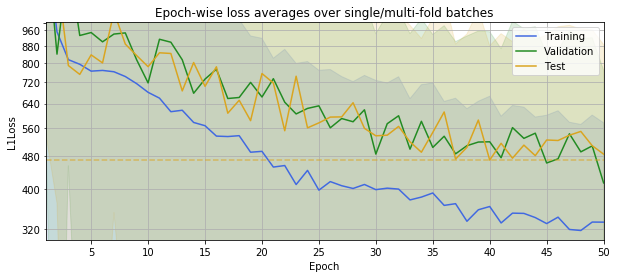

In [4]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=6,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=False, save=False)
cnn.load_model()
_ = cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBEarlier(DB_128),
    k_cv_folds=3)

#### 3.2.2 RGB Later Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_later.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_205551622_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_205551622_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[   3/  50] (1m 47s) 	Mean Loss:	Train=982.99 +-833.02	Test=867.87 +-698.05
[   6/  50] (3m 17s) 	Mean Loss:	Train=872.99 +-731.58	Test=748.86 +-578.90
[   9/  50] (4m 46s) 	Mean Loss:	Train=697.80 +-640.48	Test=655.19 +-518.06
[  12/  50] (6m 15s) 	Mean Loss:	Train=643.20 +-607.17	Test=636.13 +-480.68
[  15/  50] (7m 44s) 	Mean Loss:	Train=600.14 +-569.58	Test=576.76 +-472.76
[  18/  50] (9m 13s) 	Mean Loss:	Train=634.73 +-479.86	Test=562.69 +-503.81
[  21/  50] (10m 43s) 	Mean Loss:	Train=562.97 +-476.98	Test=519.71 +-438.30
[  24/  50] (12m 12s) 	Mean Loss:	Train=516.56 +-392.43	Test=502.40 +-409.23
[  27/  50] (13m

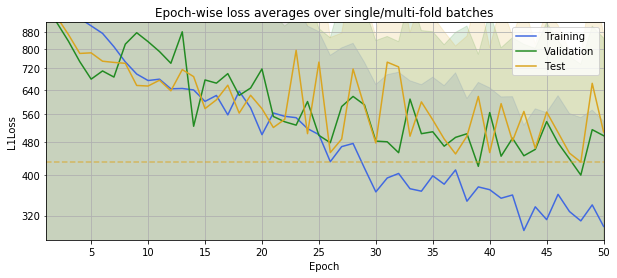

In [5]:
cnn = DroneYieldMeanCNN(
    source_bands=3,
    source_dim=128,
    cnn_layers=6,
    optimizer=optim.Adadelta)
copy_model(cnn=cnn, is_later=True, save=False)
cnn.load_model()
_ = cnn.train(
    epochs=EPOCHS,
    training_data=dp.DroneRGBLater(DB_128),
    k_cv_folds=3)

### 3.2 Weight decay

First we research the optimal weight decay by running series of grid searches. We want to first see if there is a coarse area of better test errors achieved with only a maximum of 50 epochs. After that we'll use this information to perform random searches in this neighborhood of best coarse values drawing random samples from a normal distribution with mean corresponding to the dataset-wise lowest grid search and standard deviation focusing the values around that particular mean value.

In [6]:
def test_weight_decay(dataset, weight_decays):
    best_losses = pd.DataFrame(
        columns=['weight_decay', 'best_loss', 'loss_mean', 'loss_std'])
    for weight_decay in weight_decays:
        print("weight_decay={}".format(
            weight_decay))
        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=6,
            optimizer=optim.Adadelta,
            optimizer_parameters={'weight_decay': weight_decay})
        copy_model(cnn=cnn, is_later=isinstance(dataset, dp.DroneRGBLater), save=False)
        cnn.load_model()
        losses_dict = cnn.train(
            epochs=EPOCHS,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            suppress_output=True)
        losses = np.array(losses_dict['test_losses_mean_std'])[:, 0]
        best_losses = best_losses.append(
            {'weight_decay': weight_decay,
             'best_loss': losses.min(),
             'loss_mean': losses.mean(),
             'loss_std': losses.std()},
            ignore_index=True)
    return best_losses.sort_values(by='weight_decay').reset_index(drop=True)

#(weight_decay, best_loss)
best_l2_earlier = (None,None)
best_l2_later = (None,None)

#### 3.2.1 Grid Search with Both RGB Datasets

So first we perform a crude grid search with multiple values of powers of ten.

##### 3.2.1.1 RGB Earlier Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_212059576_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_212059576_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 515.09


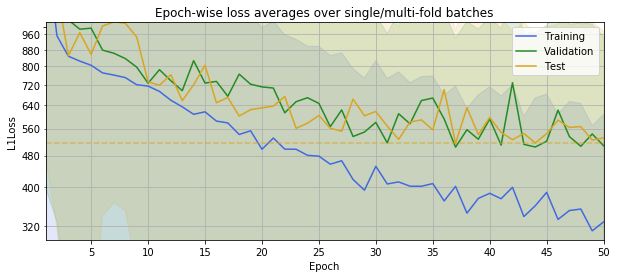

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_214831922_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_214831922_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 407.67


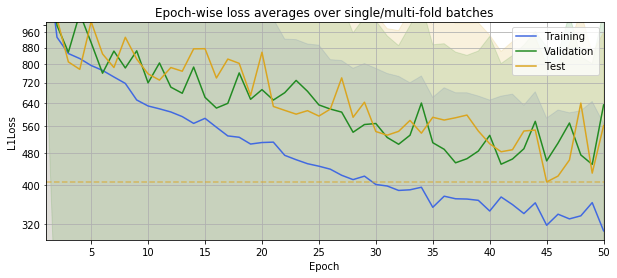

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_221611508_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_221611508_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 457.05


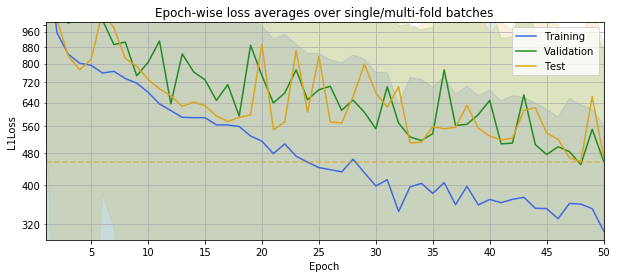

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_224349574_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_224349574_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 460.04


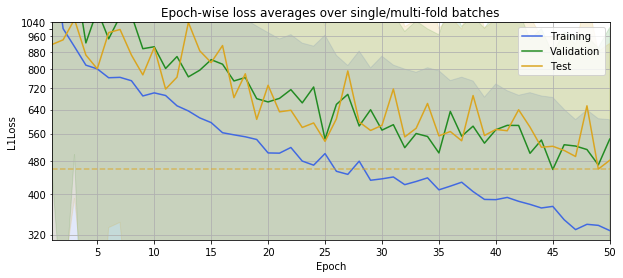

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_231128778_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_231128778_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 552.01


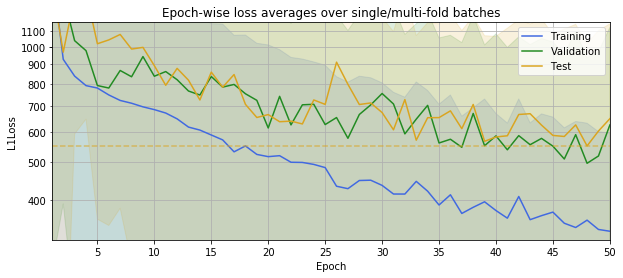

In [7]:
l2_earlier = test_weight_decay(dp.DroneRGBEarlier, [1e-3, 1e-2, 1e-1, 1e0, 1e1])

,weight_decay,best_loss,loss_mean,loss_std
0,0.001,515.093902,685.978749,199.063493
1,0.010,407.666200,677.804308,181.676728
2,0.100,457.052746,674.874732,194.055503
3,1.000,460.043286,692.152958,160.479336
4,10.000,552.014245,771.640497,209.272226


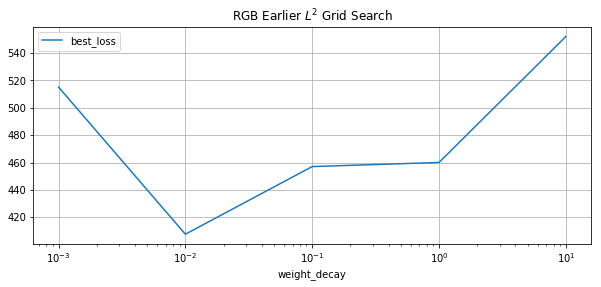

In [8]:
l2_earlier.plot(x='weight_decay', y='best_loss', logx=True, grid=True, title='RGB Earlier $L^2$ Grid Search')
l2_earlier

In [9]:
best_row = l2_earlier.loc[l2_earlier['best_loss'].idxmin()]
best_l2_earlier = (best_row['weight_decay'], best_row['best_loss'])
best_l2_earlier

(0.01, 407.6662000330483)

##### 3.2.1.2 RGB Later Dataset

weight_decay=0.001
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181210_233910119_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181210_233910119_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 388.21


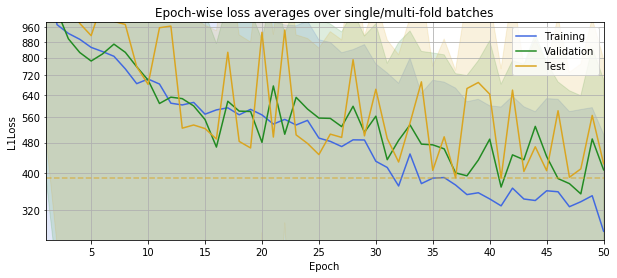

weight_decay=0.01
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_000404885_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_000404885_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 408.88


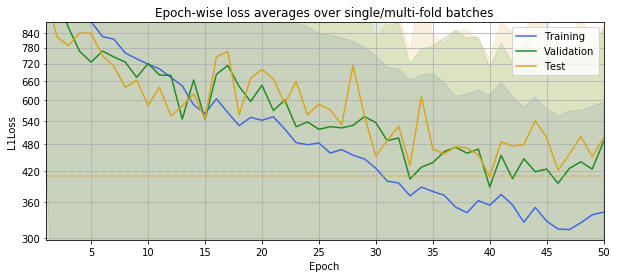

weight_decay=0.1
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_002859118_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_002859118_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 435.27


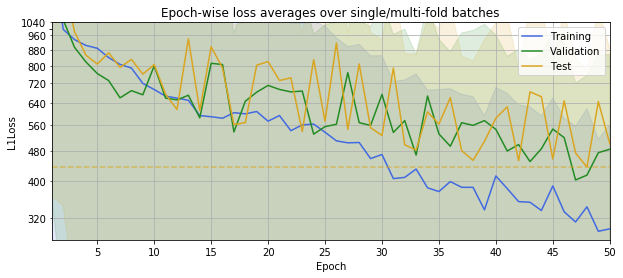

weight_decay=1.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_005351362_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_005351362_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 443.34


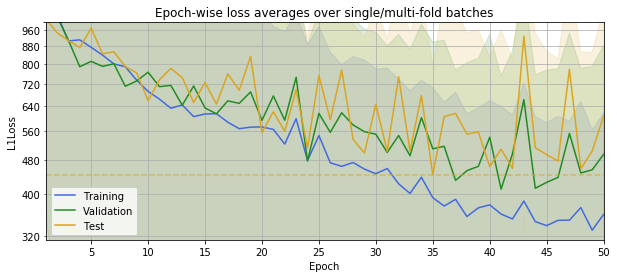

weight_decay=10.0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_011904582_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_011904582_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 398.54


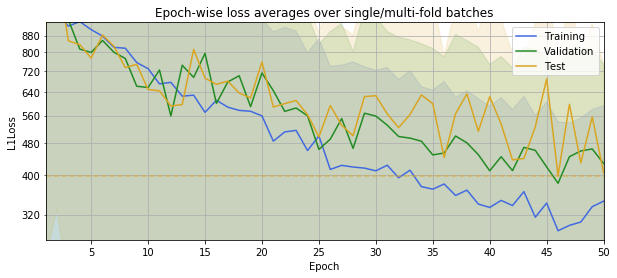

In [10]:
l2_later = test_weight_decay(dp.DroneRGBLater, [1e-3, 1e-2, 1e-1, 1e0, 1e1])

,weight_decay,best_loss,loss_mean,loss_std
0,0.001,388.205327,659.198044,259.213488
1,0.010,408.878554,590.236970,131.488187
2,0.100,435.270768,691.845609,196.091675
3,1.000,443.343296,666.571312,153.207868
4,10.000,398.540787,632.316914,155.062130


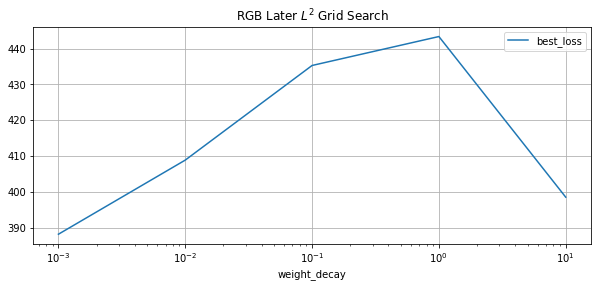

In [11]:
l2_later.plot(x='weight_decay', y='best_loss', logx=True, grid=True, title='RGB Later $L^2$ Grid Search')
l2_later

In [12]:
best_row = l2_later.loc[l2_later['best_loss'].idxmin()]
best_l2_later = (best_row['weight_decay'], best_row['best_loss'])
best_l2_later

(0.001, 388.20532696474464)

#### 3.2.2 Random Search with Both Datasets

Then we perform a zoomed search around the optimal values. 

There is one discussion point however, and that is the lowest test loss produced for RGB Earlier dataset. When comparing the loss progression with graphs, it seems that the lowest loss with ``weight_decay=0.001`` could be attributable to just random fluctuations. To support this notion, the graphs of other regularization values produce more values close to the lowest attained loss more coherently, while the loss of the first regularization test with the first dataset jumps back up to 550ish test loss range. 

Thus it seems that for both datasets we could use similar base ballpark of random search values. One option would to use a normal distribution. Another is to use a limited range uniform distribution. We will go with normal to properly zoom to a range of optimal values.

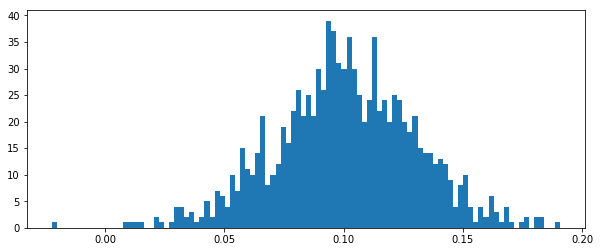

In [13]:
import matplotlib.pyplot as plt
import numpy as np
_ = plt.hist(np.random.normal(loc=1e-1, scale=3*1e-2, size=1000), bins=100)

##### 3.2.2.1 RGB Earlier Dataset

weight_decay=0.012570298659979108
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_014419395_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_014419395_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 454.76


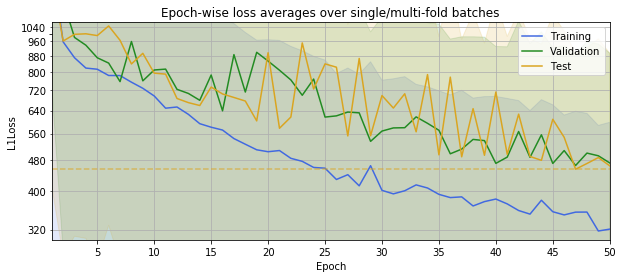

weight_decay=0.006468384276671129
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_021225729_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_021225729_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 518.06


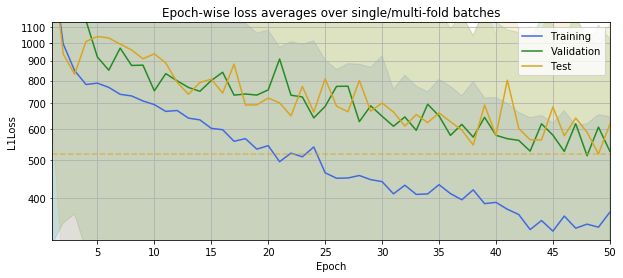

weight_decay=0.0018924573843675675
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_024008589_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_024008589_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 484.93


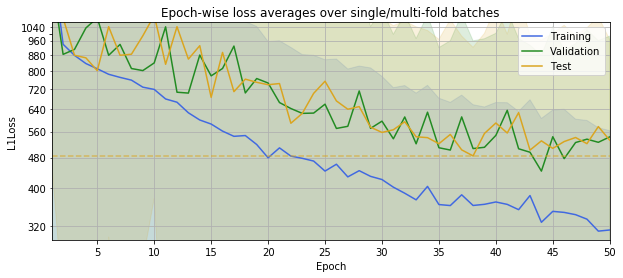

weight_decay=0.013287424820534941
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_030809086_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_030809086_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 402.99


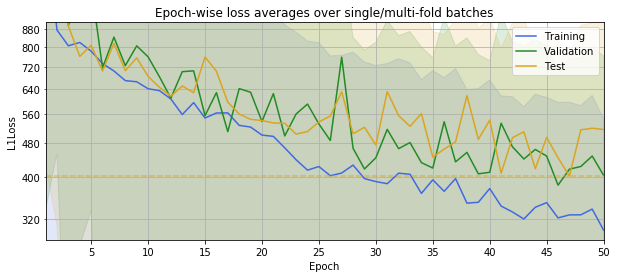

weight_decay=0.015466229444834091
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_033556174_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_033556174_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 439.70


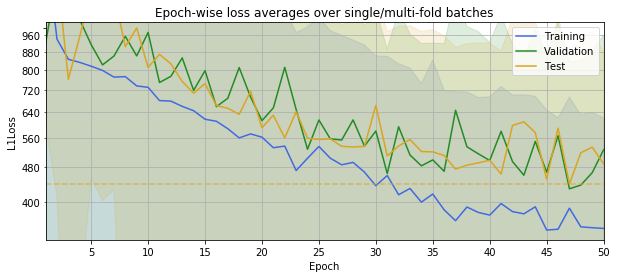

weight_decay=0.01751663798003235
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_040404117_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_040404117_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 486.40


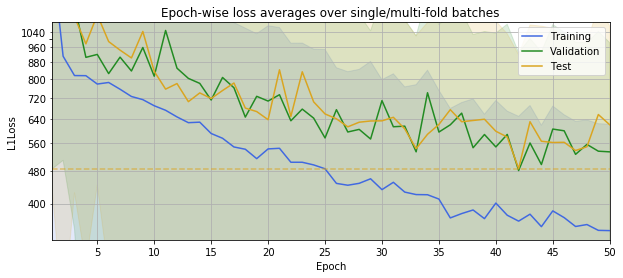

weight_decay=0.01349894193715346
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_043225319_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_043225319_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 443.17


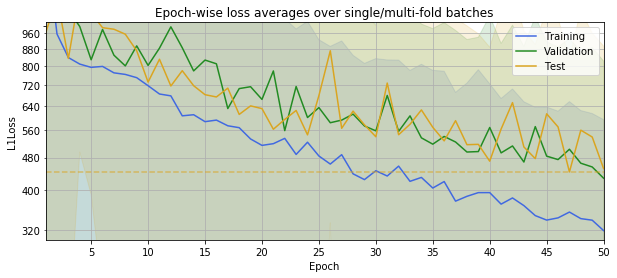

weight_decay=0.00541648766279092
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_050011978_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_050011978_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 483.21


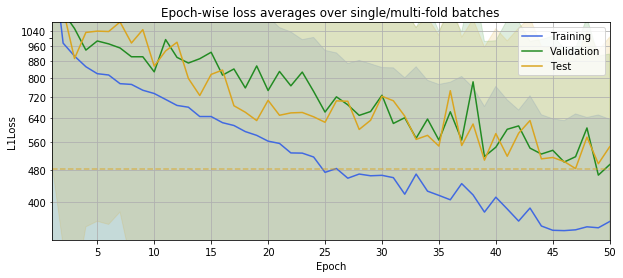

weight_decay=0.005373460346112736
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_052805503_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_052805503_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 520.05


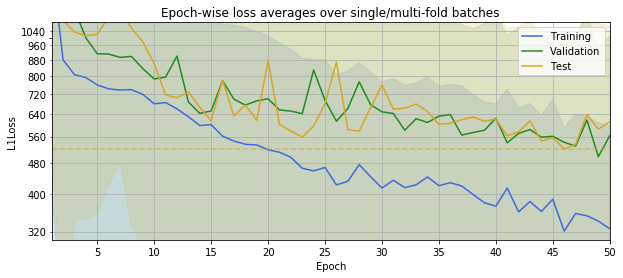

weight_decay=0.007267487453741722
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_055604132_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_055604132_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 505.71


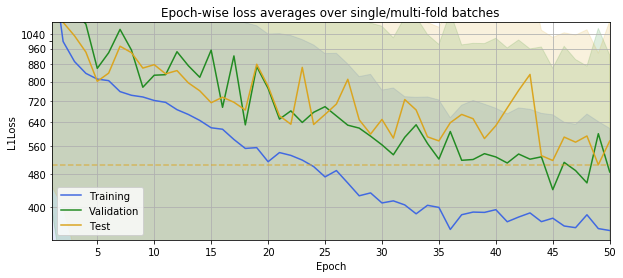

In [14]:
l2_earlier = test_weight_decay(dp.DroneRGBEarlier, 
                               np.abs(np.random.normal(loc=best_l2_earlier[0], 
                                                       scale=5*best_l2_earlier[0]*0.1, 
                                                       size=10)))

,weight_decay,best_loss,loss_mean,loss_std
0,0.001892,484.931495,712.644631,206.589402
1,0.005373,520.054908,731.314528,216.092804
2,0.005416,483.208500,729.195775,209.096294
3,0.006468,518.060699,752.580840,193.035792
4,0.007267,505.714682,739.695952,172.992872
5,0.012570,454.762964,713.615828,195.023293
6,0.013287,402.987608,609.120280,189.084124
7,0.013499,443.171824,679.167732,182.475476
8,0.015466,439.702170,684.994484,251.158479
9,0.017517,486.401476,733.330198,196.392070


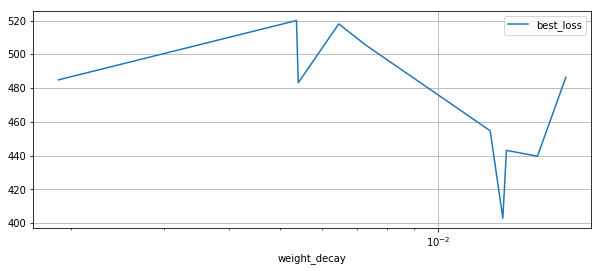

In [15]:
l2_earlier.plot(x='weight_decay', y='best_loss', logx=True, grid=True)
l2_earlier

In [16]:
best_row = l2_earlier.loc[l2_earlier['best_loss'].idxmin()]

if best_row['best_loss'] < best_l2_earlier[-1]:
    best_l2_earlier = (best_row['weight_decay'], best_row['best_loss'])

best_l2_earlier

(0.013287424820534941, 402.9876080024533)

##### 3.2.2.2 RGB Later Dataset

weight_decay=0.0009206190041825974
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_062351876_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_062351876_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 429.15


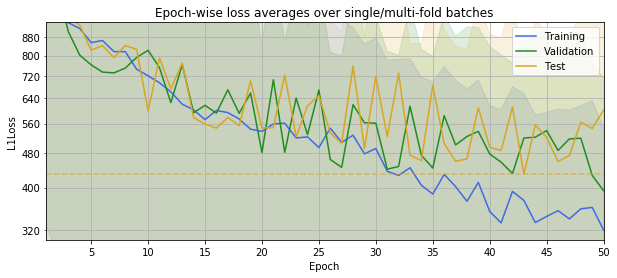

weight_decay=0.0010830903221997873
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_064854291_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_064854291_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 416.31


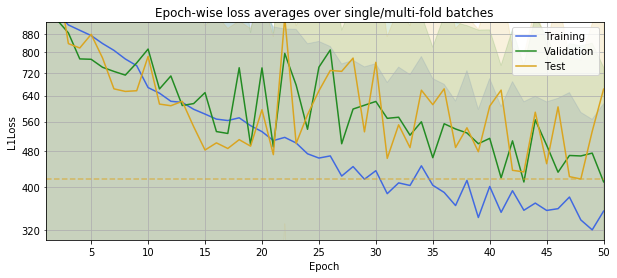

weight_decay=0.0011023606343785071
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_071349620_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_071349620_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 395.46


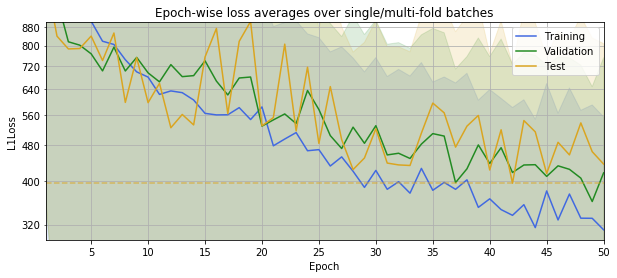

weight_decay=0.0003407193059609128
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_073846202_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_073846202_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 416.48


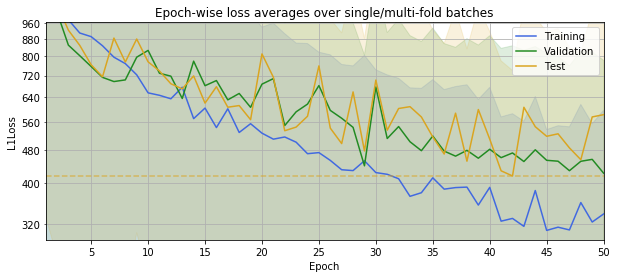

weight_decay=0.0010370310965154477
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_080355693_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_080355693_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 375.49


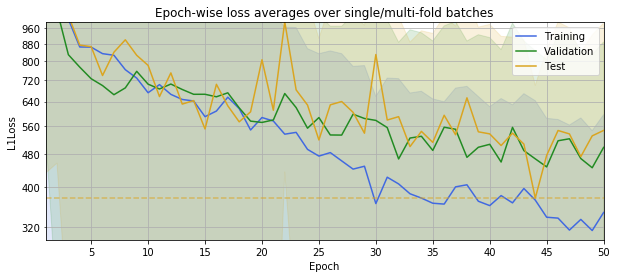

weight_decay=0.00022671414989837923
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_082853968_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_082853968_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 364.72


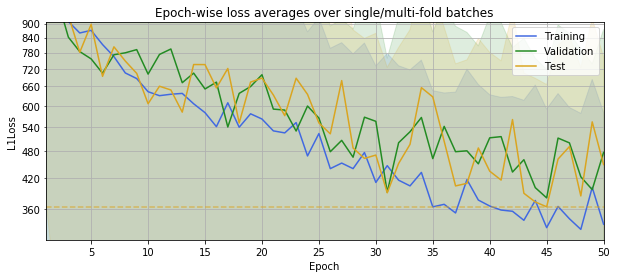

weight_decay=0.001190409049495163
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_085410700_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_085410700_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 404.14


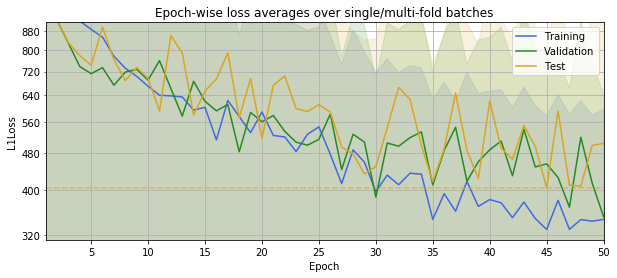

weight_decay=0.0004780675330735254
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_091904269_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_091904269_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 423.93


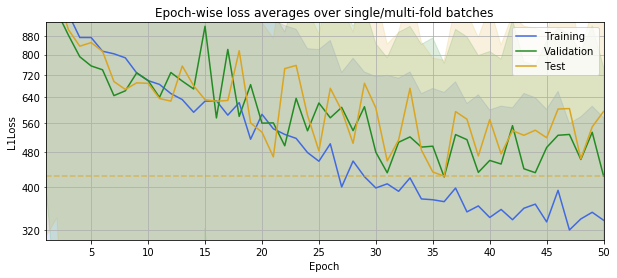

weight_decay=0.0008719169273705699
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_094418591_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_094418591_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 396.08


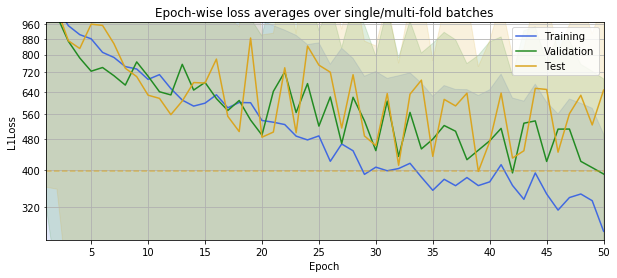

weight_decay=0.0011156294360863974
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_100915172_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_100915172_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 387.50


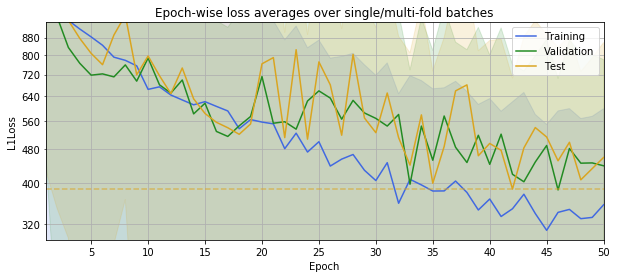

In [ ]:
result_later = test_weight_decay(dp.DroneRGBLater, 
                                 np.abs(np.random.normal(loc=best_l2_later[0], 
                                                       scale=5*best_l2_later[0]*0.1, 
                                                       size=10)))

,weight_decay,best_loss,loss_mean,loss_std
0,0.000227,364.715409,603.670646,180.515605
1,0.000341,416.475544,641.966631,157.693863
2,0.000478,423.928205,630.931107,148.931452
3,0.000872,396.081851,647.649506,167.313871
4,0.000921,429.148414,635.072115,159.471561
5,0.001037,375.490839,661.173112,176.541505
6,0.001083,416.312759,622.718796,159.104248
7,0.001102,395.459197,600.381328,162.472658
8,0.001116,387.501955,636.868013,182.545765
9,0.001190,404.135319,613.253131,145.145085


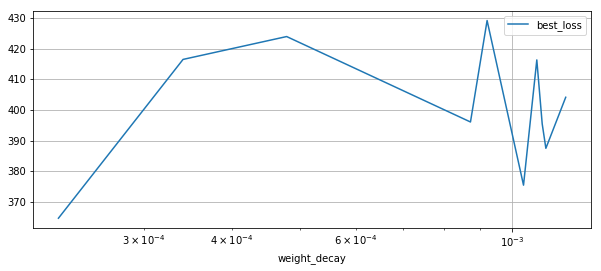

In [ ]:
result_later.plot(x='weight_decay', y='best_loss', logx=True, grid=True)
result_later

In [ ]:
best_row = l2_later.loc[l2_later['best_loss'].idxmin()]
if best_row['best_loss'] < best_l2_later[-1]:
    best_l2_later = (best_row['weight_decay'], best_row['best_loss'])
best_l2_later

(0.001, 388.20532696474464)

#### 3.2.3 Conclusions

In [2]:
best_l2_earlier = (0.013287424820534941, 402.9876080024533)
best_l2_later = (0.001, 388.20532696474464)

print("RGB Earlier")
print("\tWeight Decay: {}".format(best_l2_earlier[0]))
print("\tBest Loss: {}".format(best_l2_earlier[1]))
print("RGB Later")
print("\tWeight Decay: {}".format(best_l2_later[0]))
print("\tBest Loss: {}".format(best_l2_later[1]))

RGB Earlier
	Weight Decay: 0.013287424820534941
	Best Loss: 402.9876080024533
RGB Later
	Weight Decay: 0.001
	Best Loss: 388.20532696474464


### 3.3 Early Stopping

Next we test out multiple setting of early stopping. With early stopping it is adives by Goodfellow et al. (2016) to perform sequential training after the training has been terminated early using the same termination setting. We will thus try out several values for the early stopping patience, which is a number determining how many non-improving epochs we allow the training to pass before terminating it. We try with patiences 10, 20, 30, 40 and 50.

In [ ]:
def test_early_stopping(dataset, weight_decay, patiences):
    best_losses = pd.DataFrame(
        columns=['patience', 'best_loss', 'epochs', 'loss_mean', 'loss_std'])
    for patience in patiences:
        print("patience={}".format(
            patience))
        cnn = DroneYieldMeanCNN(
            source_bands=3,
            source_dim=128,
            cnn_layers=6,
            optimizer=optim.Adadelta,
            optimizer_parameters={'weight_decay': weight_decay})
        copy_model(cnn=cnn, is_later=isinstance(dataset, dp.DroneRGBLater), save=False)
        cnn.load_model()
        losses = []
        losses_dict = cnn.train(
            epochs=250,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)
        losses = list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
        losses_dict = cnn.train(
            epochs=250,
            training_data=dataset(DB_128),
            k_cv_folds=3,
            early_stopping_patience=patience)
        losses += list(np.array(losses_dict['test_losses_mean_std'])[:, 0])
        losses = np.array(losses).flatten()
        best_losses = best_losses.append(
            {'patience': patience,
             'epochs':losses.size,
             'best_loss': losses.min(),
             'loss_mean': losses.mean(),
             'loss_std': losses.std()},
            ignore_index=True)
    return best_losses.sort_values(by='patience').reset_index(drop=True)

#### 3.3.1 RGB Earlier Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_103431690_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_103431690_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (7m 27s) 	Mean Loss:	Train=662.64 +-634.34	Test=871.66 +-706.40
[  26/ 250] (14m 34s) 	Mean Loss:	Train=456.08 +-426.13	Test=569.08 +-533.52
[  39/ 250] (21m 42s) 	Mean Loss:	Train=401.89 +-336.87	Test=615.26 +-512.86
[  52/ 250] (28m 48s) 	Mean Loss:	Train=315.45 +-261.10	Test=507.01 +-433.20
[  65/ 250] (35m 55s) 	Mean Loss:	Train=258.31 +-204.66	Test=471.00 +-430.24
[  74/ 250] (40m 50s) 	Mean Loss:	Train=253.62 +-200.75	Test=403.39 +-362.26
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_103431690_Adadelta

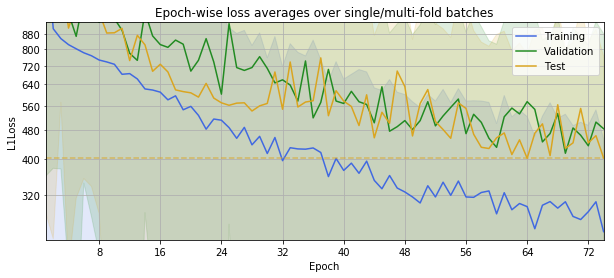

Starting the training with GPU:
[  13/ 250] (7m 26s) 	Mean Loss:	Train=305.94 +-222.30	Test=375.40 +-334.09
[  15/ 250] (8m 32s) 	Mean Loss:	Train=253.64 +-214.32	Test=362.80 +-312.74
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_103431690_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 347.94


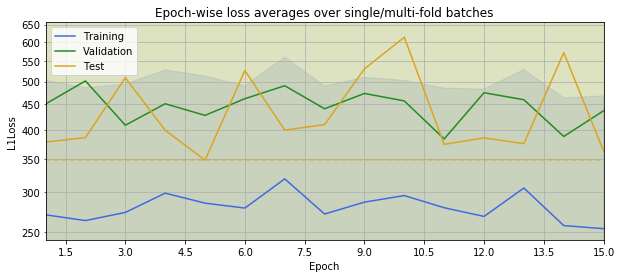

patience=20
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_112356101_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_112356101_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (7m 27s) 	Mean Loss:	Train=685.55 +-659.13	Test=1021.56 +-655.82
[  26/ 250] (14m 35s) 	Mean Loss:	Train=460.60 +-382.67	Test=527.03 +-483.30
[  39/ 250] (21m 42s) 	Mean Loss:	Train=376.38 +-299.49	Test=599.58 +-444.21
[  52/ 250] (28m 49s) 	Mean Loss:	Train=324.89 +-269.00	Test=536.96 +-483.98
[  65/ 250] (35m 55s) 	Mean Loss:	Train=315.10 +-222.88	Test=521.26 +-475.74
[  78/ 250] (43m  3s) 	Mean Loss:	Train=252.96 +-199.47	Test=435.13 +-417.79
[  91/ 250] (50m 11s) 	Mean Loss:	Train=246.01 +-198.92	Test=465.79 +-455.65
[ 104/ 250] (57m 17s) 	Mean Loss:	Train=228.10 +-174.50	Test=499.45 +-417

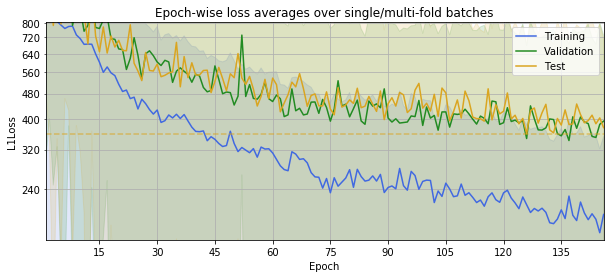

Starting the training with GPU:
[  13/ 250] (7m 31s) 	Mean Loss:	Train=217.75 +-168.33	Test=405.12 +-359.26
[  24/ 250] (13m 37s) 	Mean Loss:	Train=201.42 +-157.69	Test=334.28 +-303.05
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_112356101_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 295.32


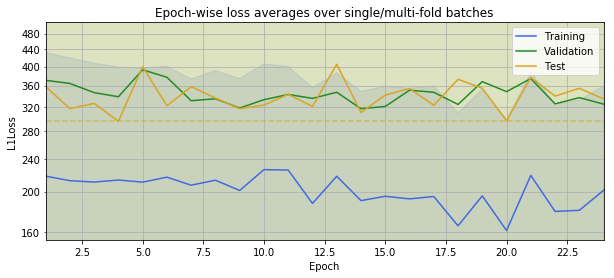

patience=30
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_125749864_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_125749864_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (7m 28s) 	Mean Loss:	Train=650.88 +-637.44	Test=1009.76 +-794.55
[  26/ 250] (14m 36s) 	Mean Loss:	Train=488.66 +-452.34	Test=640.98 +-573.72
[  39/ 250] (21m 45s) 	Mean Loss:	Train=392.26 +-316.26	Test=582.10 +-464.16
[  52/ 250] (28m 53s) 	Mean Loss:	Train=350.24 +-272.16	Test=583.24 +-435.87
[  65/ 250] (35m 60s) 	Mean Loss:	Train=309.12 +-251.79	Test=515.10 +-404.26
[  78/ 250] (43m  7s) 	Mean Loss:	Train=267.61 +-196.68	Test=431.66 +-365.95
[  91/ 250] (50m 15s) 	Mean Loss:	Train=282.91 +-197.64	Test=481.84 +-383.97
[ 104/ 250] (57m 23s) 	Mean Loss:	Train=246.89 +-181.27	Test=501.51 +-379

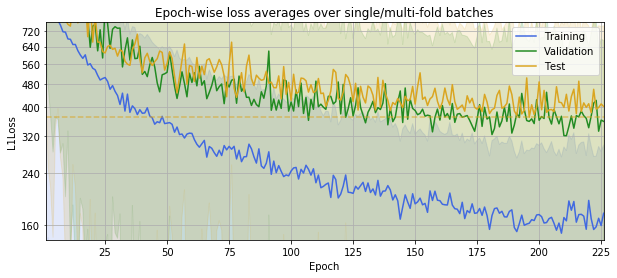

Starting the training with GPU:
[  13/ 250] (7m 28s) 	Mean Loss:	Train=154.51 +-116.12	Test=311.27 +-279.00
[  26/ 250] (14m 37s) 	Mean Loss:	Train=157.38 +-121.56	Test=350.99 +-315.87
[  39/ 250] (21m 45s) 	Mean Loss:	Train=152.67 +-114.41	Test=358.88 +-327.48
[  52/ 250] (28m 54s) 	Mean Loss:	Train=158.74 +-112.65	Test=407.08 +-364.30
[  65/ 250] (36m  2s) 	Mean Loss:	Train=155.03 +-111.13	Test=295.13 +-269.35
[  74/ 250] (40m 59s) 	Mean Loss:	Train=156.62 +-112.57	Test=438.62 +-372.20
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_125749864_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 293.29


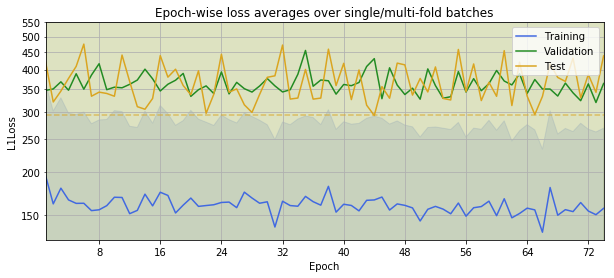

patience=40
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_154303113_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_154303113_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (7m 36s) 	Mean Loss:	Train=654.97 +-673.66	Test=794.22 +-725.56
[  26/ 250] (14m 53s) 	Mean Loss:	Train=473.08 +-453.76	Test=591.98 +-522.09
[  39/ 250] (22m 10s) 	Mean Loss:	Train=388.48 +-311.38	Test=556.54 +-484.80
[  52/ 250] (29m 25s) 	Mean Loss:	Train=326.38 +-266.40	Test=530.10 +-483.45
[  65/ 250] (36m 40s) 	Mean Loss:	Train=291.27 +-246.52	Test=514.85 +-481.47
[  78/ 250] (43m 55s) 	Mean Loss:	Train=280.56 +-220.36	Test=521.60 +-444.08
[  91/ 250] (51m 11s) 	Mean Loss:	Train=262.73 +-192.28	Test=455.04 +-438.16
[ 104/ 250] (58m 27s) 	Mean Loss:	Train=245.15 +-174.25	Test=447.70 +-434.

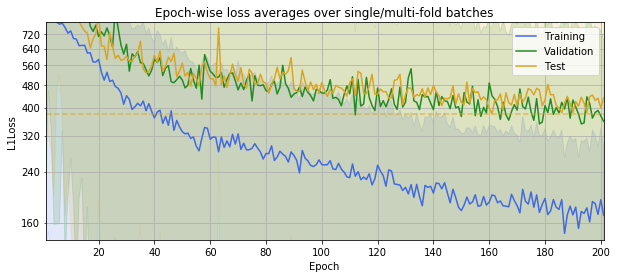

Starting the training with GPU:
[  13/ 250] (7m 34s) 	Mean Loss:	Train=164.94 +-127.84	Test=394.98 +-376.23
[  26/ 250] (14m 50s) 	Mean Loss:	Train=161.25 +-124.83	Test=391.56 +-356.88
[  39/ 250] (22m  5s) 	Mean Loss:	Train=172.34 +-128.49	Test=382.72 +-346.43
[  52/ 250] (29m 22s) 	Mean Loss:	Train=163.46 +-122.56	Test=394.45 +-363.62
[  63/ 250] (35m 30s) 	Mean Loss:	Train=164.83 +-130.70	Test=371.39 +-339.13
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_154303113_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 354.12


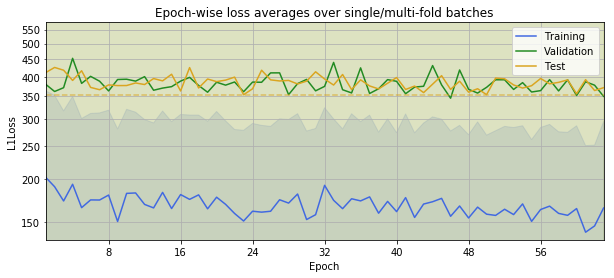

patience=50
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_181105879_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_181105879_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (7m 26s) 	Mean Loss:	Train=643.94 +-616.74	Test=655.57 +-720.54
[  26/ 250] (14m 33s) 	Mean Loss:	Train=437.17 +-388.60	Test=539.86 +-517.04
[  39/ 250] (21m 40s) 	Mean Loss:	Train=372.82 +-300.48	Test=539.82 +-450.85
[  52/ 250] (28m 46s) 	Mean Loss:	Train=321.56 +-263.13	Test=620.38 +-531.96
[  65/ 250] (35m 53s) 	Mean Loss:	Train=325.76 +-242.33	Test=541.98 +-478.89
[  78/ 250] (42m 59s) 	Mean Loss:	Train=276.68 +-211.23	Test=428.02 +-372.41
[  91/ 250] (50m  6s) 	Mean Loss:	Train=235.18 +-179.80	Test=455.08 +-453.52
[ 104/ 250] (57m 12s) 	Mean Loss:	Train=259.30 +-184.39	Test=425.99 +-392.

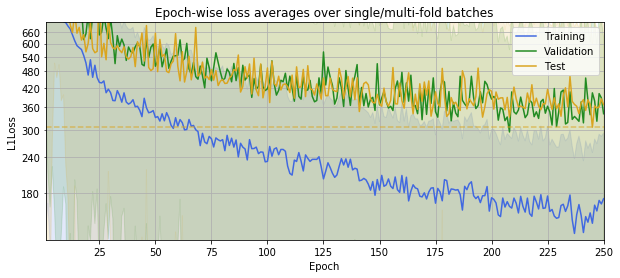

Starting the training with GPU:
[  13/ 250] (7m 26s) 	Mean Loss:	Train=164.60 +-126.35	Test=347.21 +-316.99
[  26/ 250] (14m 34s) 	Mean Loss:	Train=158.58 +-116.32	Test=387.51 +-340.28
[  39/ 250] (21m 41s) 	Mean Loss:	Train=167.86 +-118.11	Test=369.23 +-333.01
[  45/ 250] (24m 58s) 	Mean Loss:	Train=142.23 +-104.57	Test=348.74 +-314.28
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_181105879_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 306.16


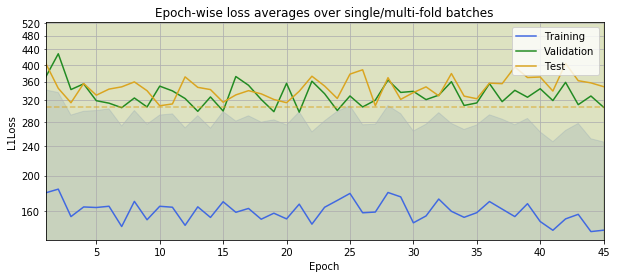

In [ ]:
patience_earlier = test_early_stopping(
    dataset=dp.DroneRGBEarlier, 
    weight_decay=best_l2_earlier[0], 
    patiences=[10,20,30,40,50])

#### 3.3.2 RGB Later Dataset

patience=10
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_205254444_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_205254444_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 49s) 	Mean Loss:	Train=620.76 +-589.87	Test=697.34 +-547.30
[  26/ 250] (13m 19s) 	Mean Loss:	Train=477.93 +-417.50	Test=466.37 +-415.63
[  39/ 250] (19m 48s) 	Mean Loss:	Train=401.00 +-286.77	Test=405.34 +-365.50
[  52/ 250] (26m 16s) 	Mean Loss:	Train=311.51 +-238.32	Test=465.80 +-381.82
[  63/ 250] (31m 45s) 	Mean Loss:	Train=288.13 +-202.05	Test=395.89 +-352.35
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_205254444_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 375.00


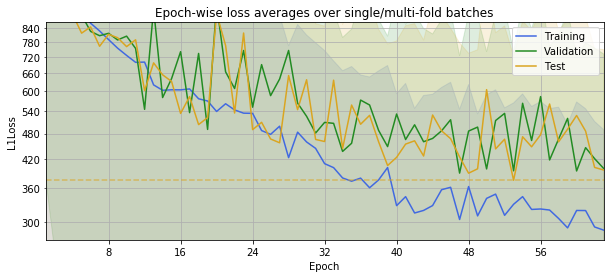

Starting the training with GPU:
[  13/ 250] (6m 42s) 	Mean Loss:	Train=278.75 +-197.95	Test=540.64 +-402.80
[  26/ 250] (13m  5s) 	Mean Loss:	Train=255.07 +-203.43	Test=374.48 +-314.29
[  31/ 250] (15m 32s) 	Mean Loss:	Train=252.02 +-186.48	Test=382.75 +-320.31
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_205254444_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 347.33


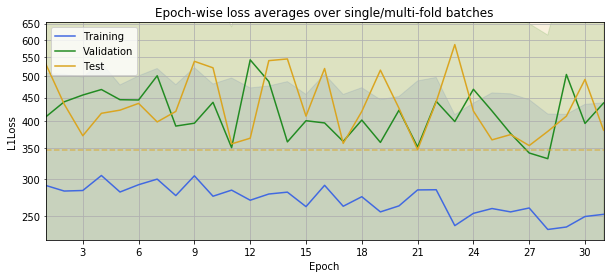

patience=20
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_214013349_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_214013349_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 43s) 	Mean Loss:	Train=624.24 +-589.60	Test=650.68 +-471.98
[  26/ 250] (13m  6s) 	Mean Loss:	Train=474.88 +-359.30	Test=496.45 +-406.28
[  39/ 250] (19m 30s) 	Mean Loss:	Train=361.08 +-266.52	Test=554.90 +-427.88
[  52/ 250] (25m 53s) 	Mean Loss:	Train=317.19 +-245.42	Test=399.80 +-350.41
[  65/ 250] (32m 17s) 	Mean Loss:	Train=292.34 +-197.91	Test=502.72 +-381.74
[  78/ 250] (38m 40s) 	Mean Loss:	Train=271.17 +-193.86	Test=398.64 +-339.28
[  86/ 250] (42m 35s) 	Mean Loss:	Train=250.39 +-182.78	Test=384.22 +-348.74
Early stopping criterion met, terminating training.
Saving the model to /h

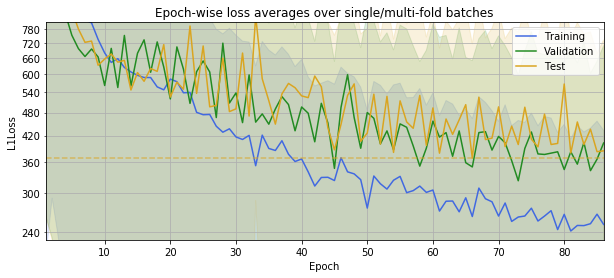

Starting the training with GPU:
[  13/ 250] (6m 41s) 	Mean Loss:	Train=220.97 +-169.26	Test=414.83 +-312.25
[  26/ 250] (13m  3s) 	Mean Loss:	Train=257.43 +-178.39	Test=381.06 +-274.59
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_214013349_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 311.54


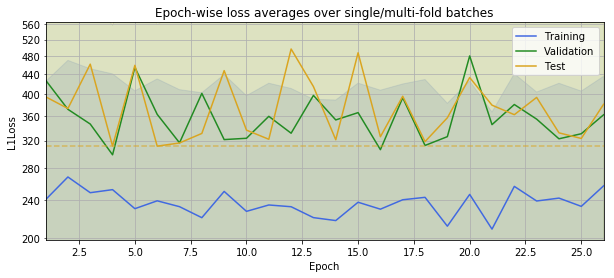

patience=30
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181211_223553726_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181211_223553726_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 42s) 	Mean Loss:	Train=636.76 +-553.53	Test=657.41 +-544.48
[  26/ 250] (13m  5s) 	Mean Loss:	Train=452.82 +-360.58	Test=765.62 +-574.78
[  39/ 250] (19m 28s) 	Mean Loss:	Train=360.15 +-270.22	Test=513.20 +-467.53
[  52/ 250] (25m 51s) 	Mean Loss:	Train=312.72 +-235.76	Test=420.68 +-352.41
[  65/ 250] (32m 13s) 	Mean Loss:	Train=292.14 +-222.24	Test=405.20 +-367.27
[  78/ 250] (38m 35s) 	Mean Loss:	Train=271.12 +-193.86	Test=502.47 +-428.13
[  91/ 250] (44m 57s) 	Mean Loss:	Train=244.29 +-184.74	Test=526.60 +-460.66
[ 104/ 250] (51m 18s) 	Mean Loss:	Train=251.17 +-178.48	Test=377.64 +-353.

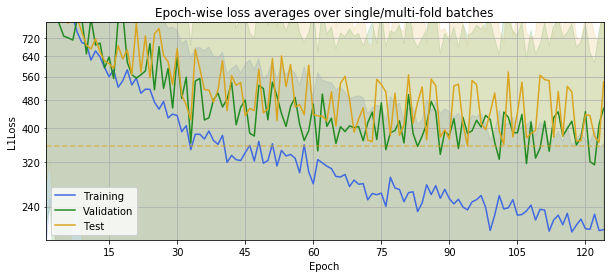

Starting the training with GPU:
[  13/ 250] (6m 46s) 	Mean Loss:	Train=213.36 +-156.74	Test=470.34 +-392.57
[  26/ 250] (13m 13s) 	Mean Loss:	Train=213.97 +-153.57	Test=462.17 +-402.27
[  39/ 250] (19m 41s) 	Mean Loss:	Train=199.83 +-139.71	Test=461.53 +-397.76
[  48/ 250] (24m  9s) 	Mean Loss:	Train=199.43 +-136.15	Test=440.80 +-390.47
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181211_223553726_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 269.61


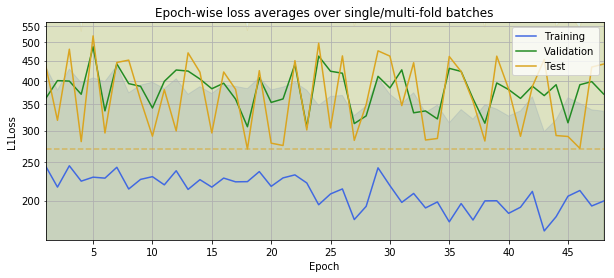

patience=40
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181212_000110816_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181212_000110816_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 44s) 	Mean Loss:	Train=645.96 +-601.16	Test=557.78 +-490.77
[  26/ 250] (13m  7s) 	Mean Loss:	Train=431.80 +-352.20	Test=445.57 +-365.16
[  39/ 250] (19m 30s) 	Mean Loss:	Train=387.66 +-279.02	Test=418.52 +-355.45
[  52/ 250] (25m 52s) 	Mean Loss:	Train=340.90 +-233.56	Test=401.80 +-346.44
[  65/ 250] (32m 14s) 	Mean Loss:	Train=276.38 +-202.47	Test=387.41 +-323.03
[  78/ 250] (38m 35s) 	Mean Loss:	Train=264.97 +-198.92	Test=542.71 +-436.84
[  91/ 250] (44m 57s) 	Mean Loss:	Train=244.36 +-168.65	Test=370.16 +-309.67
[ 104/ 250] (51m 17s) 	Mean Loss:	Train=221.66 +-162.26	Test=583.99 +-450.

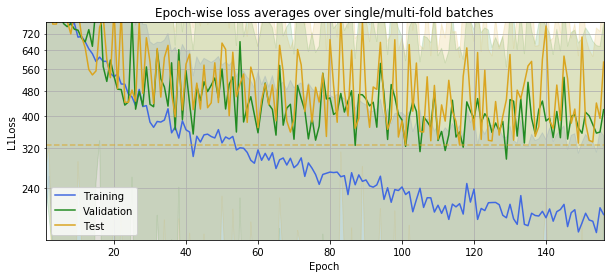

Starting the training with GPU:
[  13/ 250] (6m 39s) 	Mean Loss:	Train=205.08 +-149.03	Test=448.34 +-352.72
[  26/ 250] (12m 60s) 	Mean Loss:	Train=160.14 +-123.93	Test=315.08 +-293.27
[  39/ 250] (19m 20s) 	Mean Loss:	Train=184.49 +-126.09	Test=332.95 +-301.54
[  52/ 250] (25m 40s) 	Mean Loss:	Train=169.45 +-122.17	Test=566.54 +-417.30
[  65/ 250] (32m  0s) 	Mean Loss:	Train=148.05 +-110.05	Test=297.97 +-269.82
[  73/ 250] (35m 54s) 	Mean Loss:	Train=171.40 +-124.92	Test=320.18 +-323.42
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181212_000110816_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 289.83


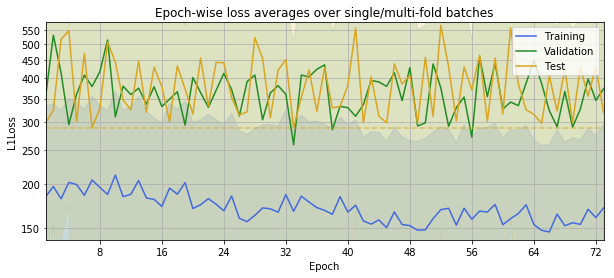

patience=50
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/regularization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/regularization/20181212_015347366_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/regularization/20181212_015347366_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 46s) 	Mean Loss:	Train=570.41 +-545.27	Test=724.71 +-529.69
[  26/ 250] (13m 13s) 	Mean Loss:	Train=462.24 +-371.60	Test=696.40 +-528.21
[  39/ 250] (19m 42s) 	Mean Loss:	Train=357.32 +-266.42	Test=508.09 +-382.38
[  52/ 250] (26m  9s) 	Mean Loss:	Train=308.53 +-221.68	Test=519.45 +-439.66
[  65/ 250] (32m 36s) 	Mean Loss:	Train=300.94 +-218.20	Test=393.58 +-324.56
[  78/ 250] (39m  3s) 	Mean Loss:	Train=259.12 +-195.03	Test=552.46 +-446.43
[  91/ 250] (45m 30s) 	Mean Loss:	Train=220.52 +-164.55	Test=376.69 +-327.40
[ 104/ 250] (51m 57s) 	Mean Loss:	Train=234.30 +-162.51	Test=420.29 +-379.

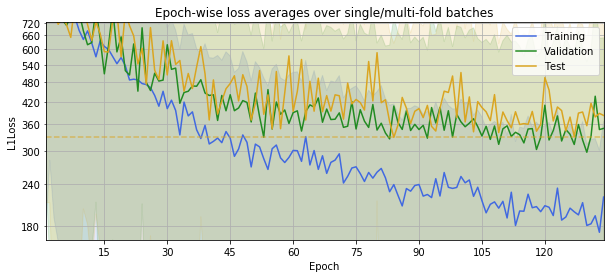

Starting the training with GPU:
[  13/ 250] (6m 45s) 	Mean Loss:	Train=190.31 +-138.65	Test=280.49 +-236.49
[  26/ 250] (13m 10s) 	Mean Loss:	Train=178.22 +-133.68	Test=506.82 +-373.31
[  39/ 250] (19m 34s) 	Mean Loss:	Train=195.26 +-139.02	Test=298.73 +-251.08
[  52/ 250] (25m 59s) 	Mean Loss:	Train=168.93 +-122.39	Test=276.60 +-217.70
[  65/ 250] (32m 23s) 	Mean Loss:	Train=176.10 +-126.54	Test=451.56 +-356.75
[  78/ 250] (38m 47s) 	Mean Loss:	Train=157.13 +-121.47	Test=442.29 +-351.74
[  91/ 250] (45m 11s) 	Mean Loss:	Train=165.79 +-113.95	Test=554.11 +-370.21
[ 104/ 250] (51m 36s) 	Mean Loss:	Train=147.07 +-107.56	Test=381.96 +-311.10
[ 109/ 250] (54m  3s) 	Mean Loss:	Train=139.87 +-104.72	Test=418.10 +-358.47
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/regularization/20181212_015347366_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 263.22


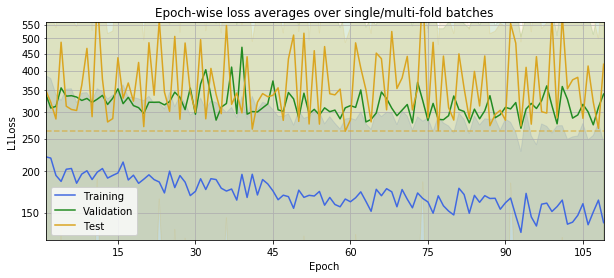

In [ ]:
patience_later = test_early_stopping(
    dataset=dp.DroneRGBLater, 
    weight_decay=best_l2_later[0], 
    patiences=[10,20,30,40,50])

#### 3.3.3 Conclusions

The results of early stopping are given for both datasets in the following tables:

In [ ]:
print("RGB Earlier")
patience_earlier

RGB Earlier


,patience,best_loss,epochs,loss_mean,loss_std
0,10.0,347.941031,89.0,598.049171,202.067635
1,20.0,295.317342,170.0,507.912193,184.385330
2,30.0,293.294478,300.0,478.559818,147.942752
3,40.0,354.115682,264.0,492.330864,145.699829
4,50.0,306.159928,295.0,455.188578,155.117565


In [ ]:
print("RGB Later")
patience_later

RGB Later


,patience,best_loss,epochs,loss_mean,loss_std
0,10.0,347.327959,94.0,529.779719,150.800943
1,20.0,311.535437,112.0,502.967811,143.730578
2,30.0,269.610595,172.0,487.531960,143.967646
3,40.0,289.833897,229.0,476.598456,145.953519
4,50.0,263.220605,243.0,432.270162,128.445650


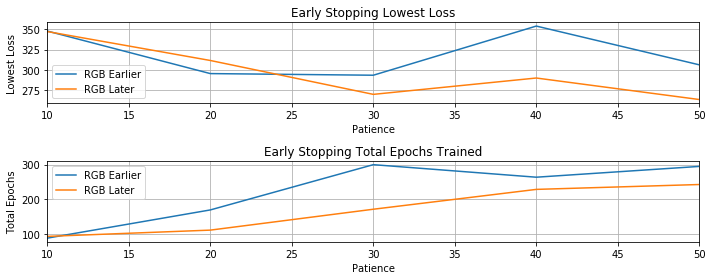

In [ ]:
import matplotlib.pyplot as plt
plt.subplot(211)
plt.plot(patience_earlier['patience'],patience_earlier['best_loss'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['best_loss'],label='RGB Later')
plt.title("Early Stopping Lowest Loss")
plt.xlabel("Patience")
plt.ylabel("Lowest Loss")
plt.xlim(10,50)
plt.grid()
plt.legend()
plt.subplot(212)
plt.plot(patience_earlier['patience'],patience_earlier['epochs'],label='RGB Earlier')
plt.plot(patience_later['patience'],patience_later['epochs'],label='RGB Later')
plt.title("Early Stopping Total Epochs Trained")
plt.xlabel("Patience")
plt.ylabel("Total Epochs")
plt.xlim(10,50)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

The increase in in patience seems have the average effect of linearly increasing the training time. However at the same time the losses behave in convex way, where the minimum is somewhere between 150 and 300 total epochs trained. We will use patience of ``30`` for the earlier and ``30`` for the later dataset.

## 4. Optimizer Tuning

The last step is to tune the hyperparameters of the optimizer. Adadelta has effectively two parameters that can be tuned. These are the initial learning rate ``lr`` that will be dynamically changed by the optimizer and the coefficient for running average of squared gradients ``rho`` used to determinate the changing of the learning rate. 

In the original Adadelta paper they performed hyperparameter tuning with just 6 epochs on the digit classification task. We will be a bit more generous to our network and use 25 epochs to determine the optimal settings. This means that we wont be utilizing early stopping here, but we will incorporate weight decay.

We will first conduct coarse grid search and random searh after that if necessary. We will use same initialized models as in the regularization testing phase.

In [1]:
import os
import shutil
import numpy as np
import pandas as pd
import seaborn as sns

from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings

%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
optimized_models_dir = os.path.join(model_settings.MODELS_DIR,'optimization')
os.makedirs(optimized_models_dir,exist_ok=True)

regularized_models_dir = os.path.join(model_settings.MODELS_DIR,'regularization')
for dataset_name in DATASET_NAMES:
    model_name = "initial_model_{}.pkl".format(dataset_name)
    shutil.copyfile(
        os.path.join(regularized_models_dir,model_name),
        os.path.join(optimized_models_dir,model_name))
    assert os.path.isfile(os.path.join(optimized_models_dir,model_name))

def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(optimized_models_dir,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)
    else:
        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

def test_optimizer(dataset, weight_decay, lrs, rhos):
    best_losses = pd.DataFrame(
        columns=['lr', 'rho', 'best_loss', 'loss_mean', 'loss_std'])
    for lr in lrs:
        for rho in rhos:
            print("lr={}, rho={}".format(lr, rho))
            cnn = DroneYieldMeanCNN(
                source_bands=3,
                source_dim=128,
                cnn_layers=6,
                optimizer=optim.Adadelta,
                optimizer_parameters={
                    'weight_decay': weight_decay,
                    'lr': lr,
                    'rho': rho})
            copy_model(
                cnn=cnn,
                is_later=isinstance(dataset, dp.DroneRGBLater),
                save=False)
            cnn.load_model()
            losses_dict = cnn.train(
                epochs=50,
                training_data=dataset(DB_128),
                k_cv_folds=3,
                suppress_output=True)
            losses = np.array(losses_dict['test_losses_mean_std'])[:, 0]
            best_losses = best_losses.append(
                {'lr': lr,
                 'rho': rho,
                 'best_loss': losses.min(),
                 'loss_mean': losses.mean(),
                 'loss_std': losses.std()},
                ignore_index=True)
    return best_losses.sort_values(by='best_loss').reset_index(drop=True)

# (lr, rho, loss)
best_optimizer_earlier = (None, None, None)
best_optmizer_later = (None, None, None)

### 4.1 Grid Search

For the initial values we will use learning rates of ``1e-4``,``1e-3``,``1e-2``,``1e-1`` and ``1e0``. For the running average coefficient we will use ``0.0``,``0.3``,``0.6`` and ``0.9``. This totals to 20 trainings per dataset.

#### 4.1.1 RGB Earlier Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181212_205737563_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181212_205737563_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 464.72


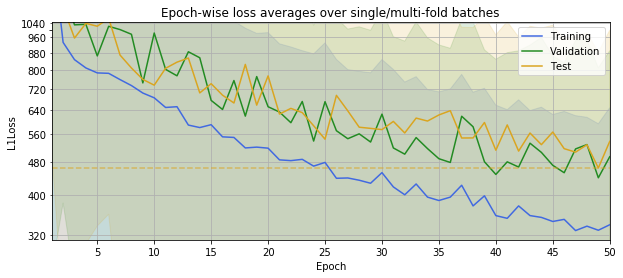

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181212_212520269_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181212_212520269_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 486.25


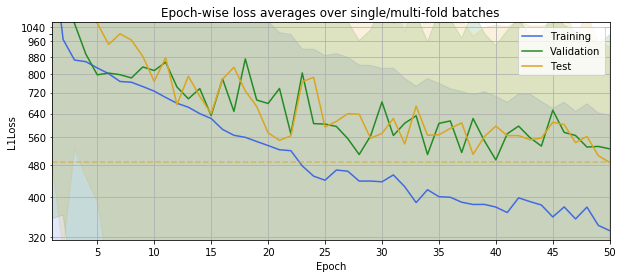

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181212_215314345_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181212_215314345_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 432.58


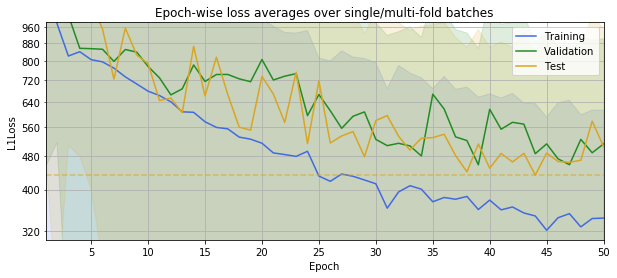

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181212_222117368_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181212_222117368_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 464.79


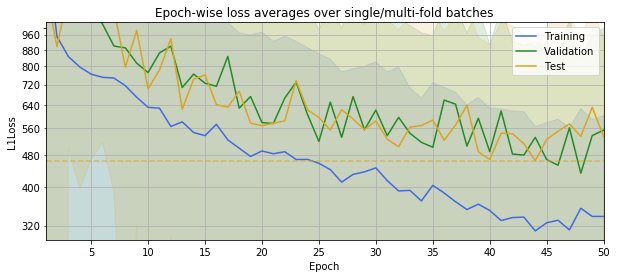

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181212_224912412_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181212_224912412_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 508.30


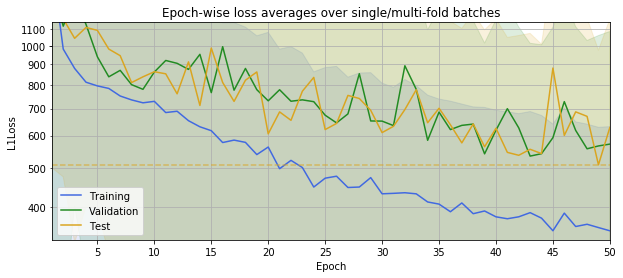

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181212_231720228_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181212_231720228_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 453.29


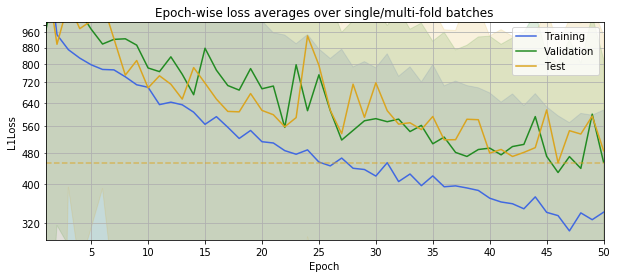

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181212_234514956_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181212_234514956_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 554.48


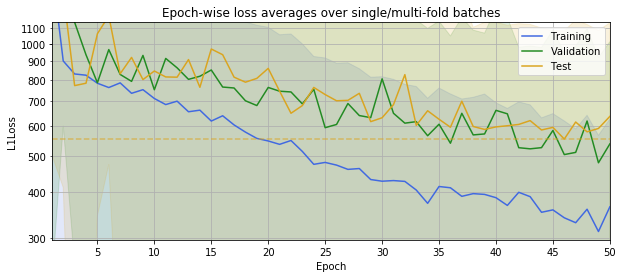

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_001308077_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_001308077_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 397.84


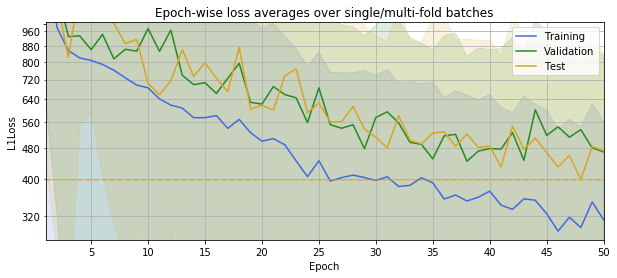

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_004100409_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_004100409_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 412.50


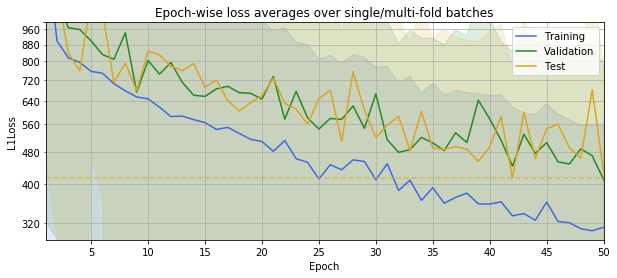

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_010850941_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_010850941_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 460.04


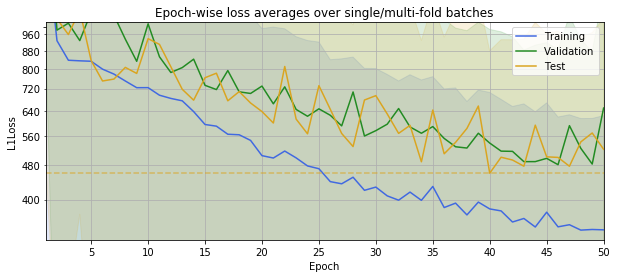

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_013657096_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_013657096_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 514.27


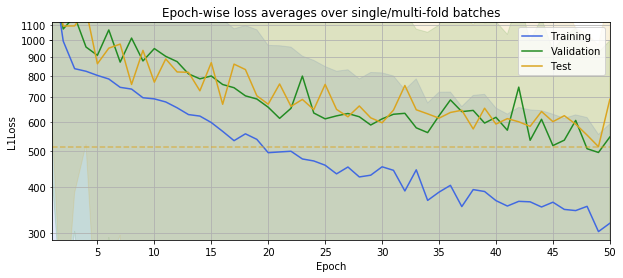

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_020452150_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_020452150_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 495.73


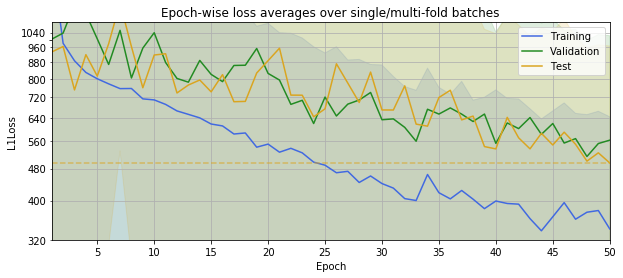

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_023242902_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_023242902_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 538.19


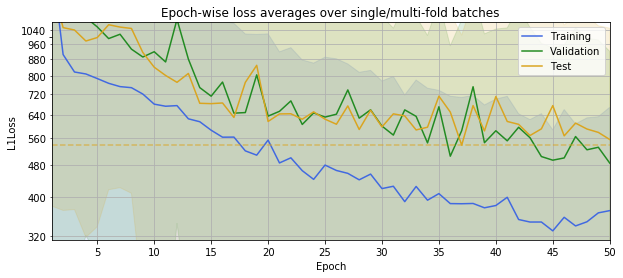

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_030031846_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_030031846_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 411.49


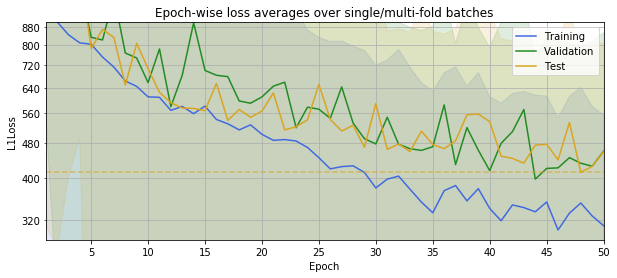

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_032845800_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_032845800_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 432.72


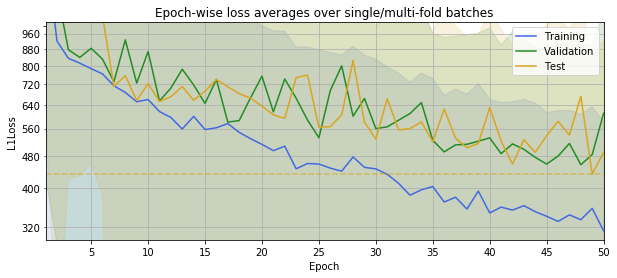

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_035634978_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_035634978_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 468.32


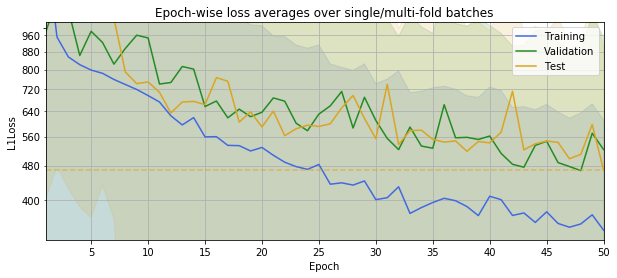

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_042421111_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_042421111_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 497.55


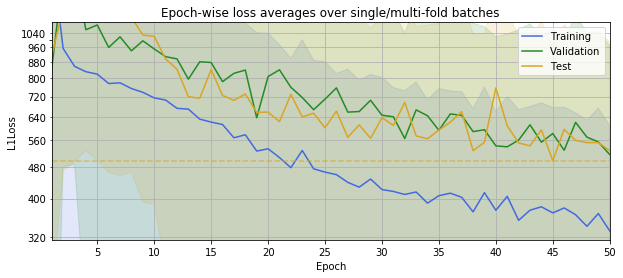

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_045208174_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_045208174_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 461.07


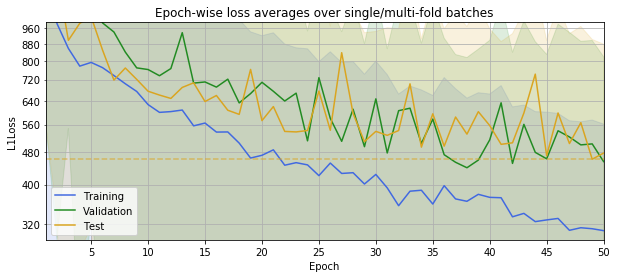

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_051954739_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_051954739_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 511.18


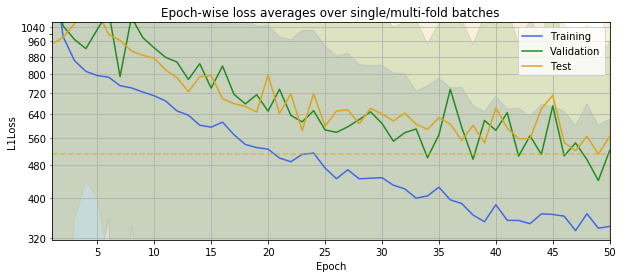

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181213_054741277_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181213_054741277_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 396.43


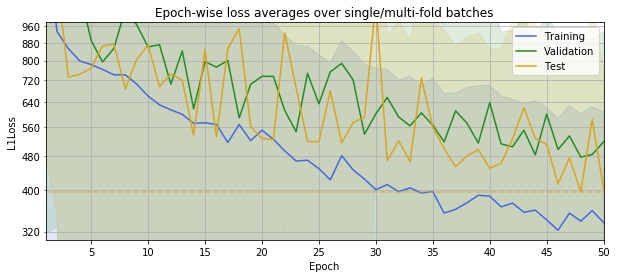

In [3]:
optimizer_earlier = test_optimizer(dp.DroneRGBEarlier, 
                                   best_l2_earlier[0], 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,464.715183,486.251299,432.575477,464.792095
0.0010,508.301325,453.288830,554.475136,397.837212
0.0100,412.499483,460.044801,514.269881,495.727039
0.1000,538.190331,411.491043,432.722757,468.319118
1.0000,497.551947,461.071353,511.183395,396.431082


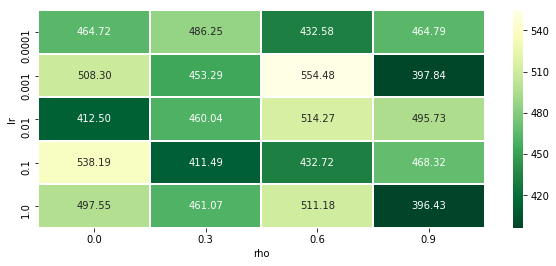

In [4]:
pivot = optimizer_earlier.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [5]:
best_row = optimizer_earlier.loc[optimizer_earlier['best_loss'].idxmin()]
best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_earlier

(1.0, 0.9, 396.4310816322885)

In [3]:
# best_optimizer_earlier = (1.0, 0.9, 396.4310816322885)

#### 4.1.2 RGB Later Dataset

lr=0.0001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_085803965_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_085803965_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 382.68


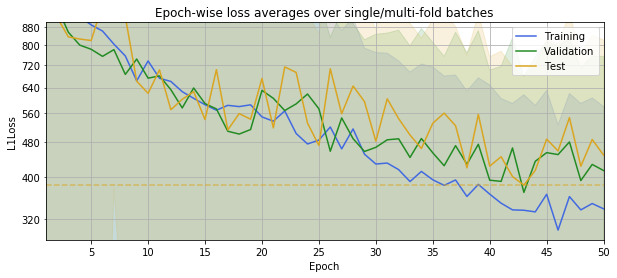

lr=0.0001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_092251824_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_092251824_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 438.34


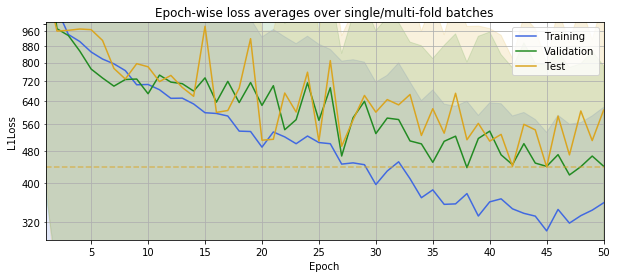

lr=0.0001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_094817881_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_094817881_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 408.54


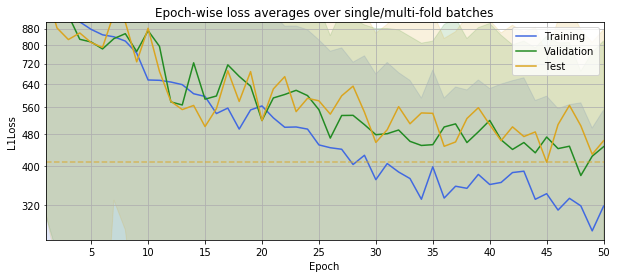

lr=0.0001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_101349155_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_101349155_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 388.48


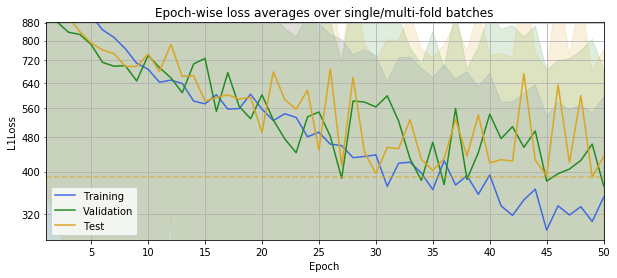

lr=0.001, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_103921449_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_103921449_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 424.90


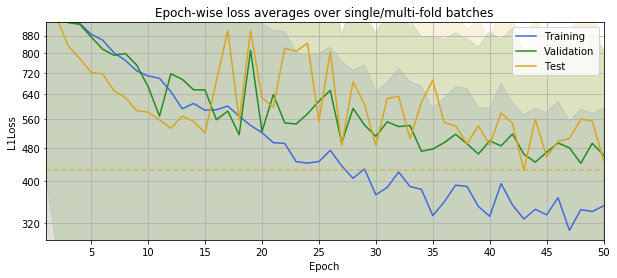

lr=0.001, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_110454929_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_110454929_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 375.38


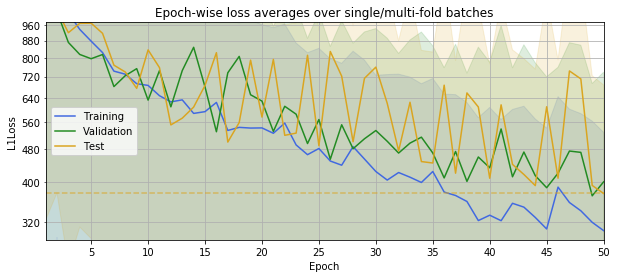

lr=0.001, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_113028805_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_113028805_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 444.42


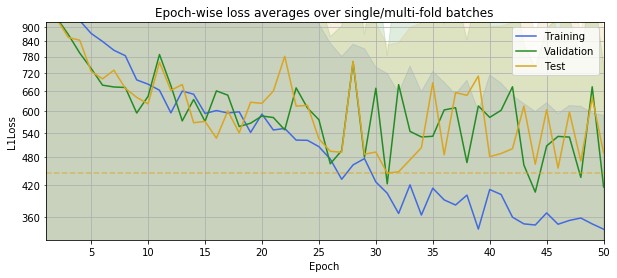

lr=0.001, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_115601179_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_115601179_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 385.43


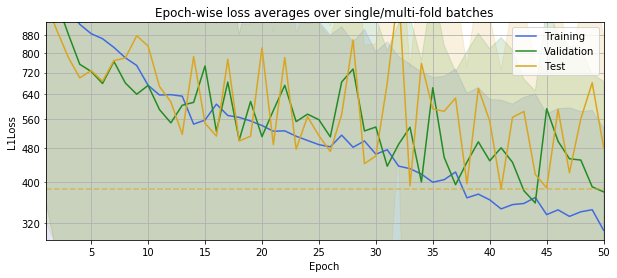

lr=0.01, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_122134693_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_122134693_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 399.01


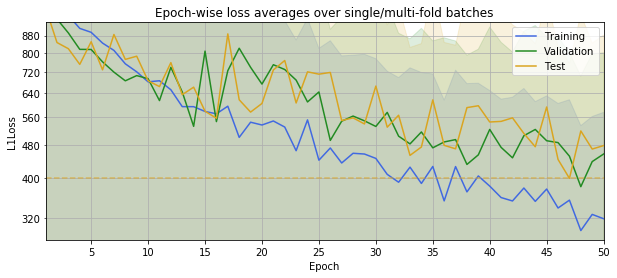

lr=0.01, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_124705814_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_124705814_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 446.27


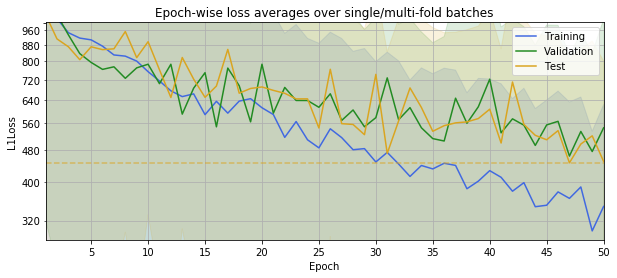

lr=0.01, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_131235910_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_131235910_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 413.85


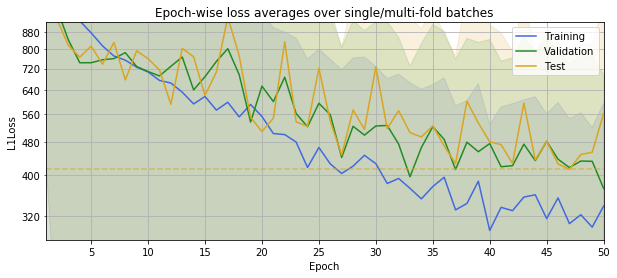

lr=0.01, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_133806116_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_133806116_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 390.13


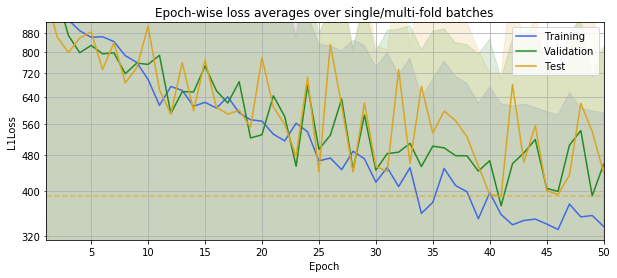

lr=0.1, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_140337515_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_140337515_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 373.92


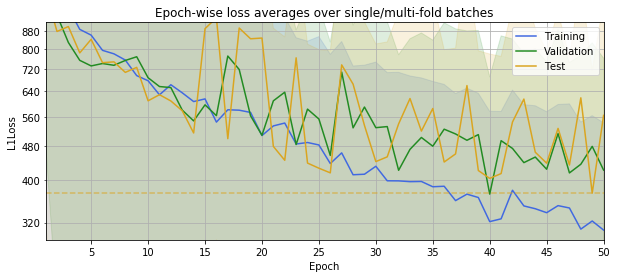

lr=0.1, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_142905034_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_142905034_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 353.75


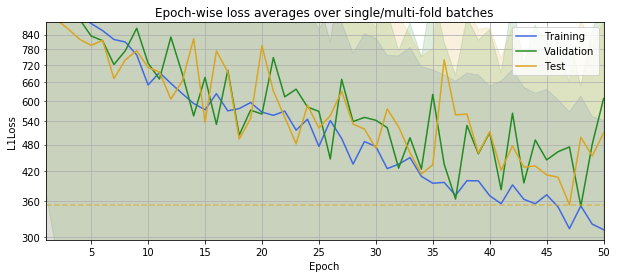

lr=0.1, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_145431630_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_145431630_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 427.00


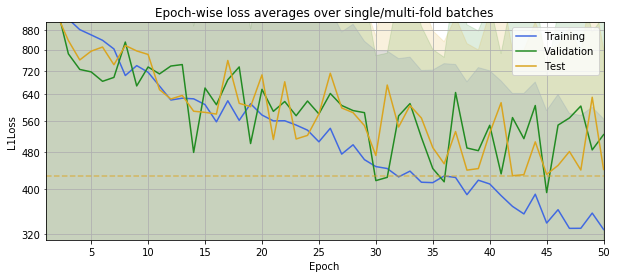

lr=0.1, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_151959919_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_151959919_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 426.77


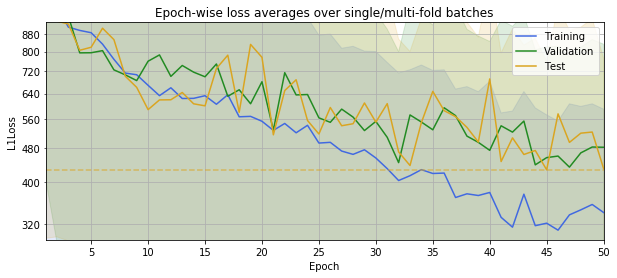

lr=1.0, rho=0
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_154526118_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_154526118_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 427.45


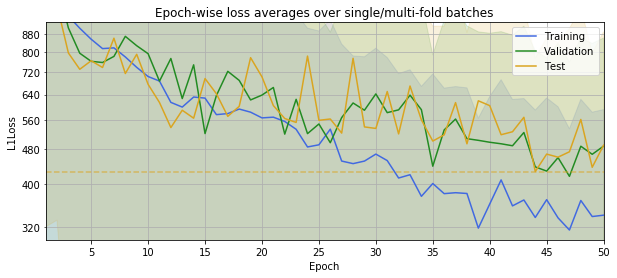

lr=1.0, rho=0.3
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_161053120_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_161053120_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 357.33


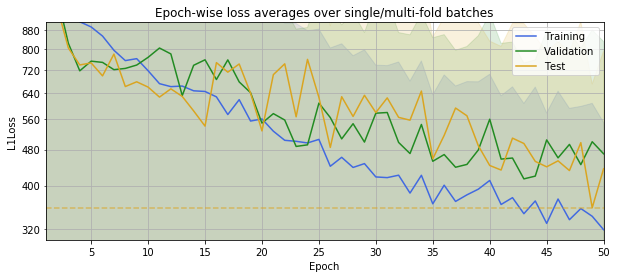

lr=1.0, rho=0.6
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_163616477_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_163616477_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 420.55


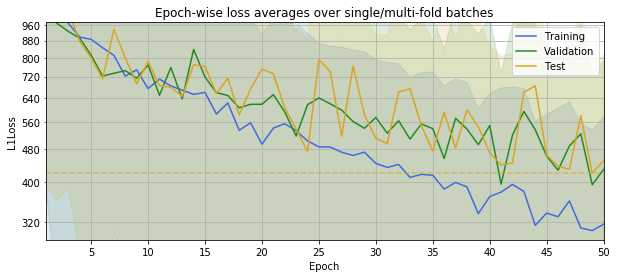

lr=1.0, rho=0.9
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_170140121_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_170140121_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 367.77


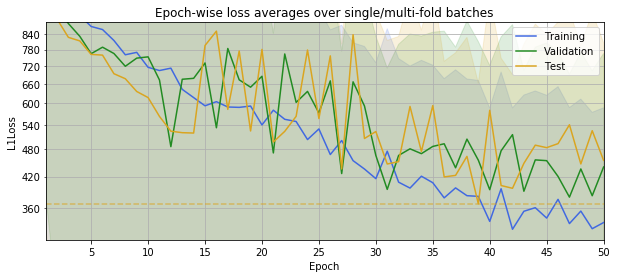

In [4]:
optimizer_later = test_optimizer(dp.DroneRGBLater, 
                                   best_l2_later[0], 
                                   [1e-4,1e-3,1e-2,1e-1,1e0], 
                                   [0,0.3,0.6,0.9])

rho,0.0,0.3,0.6,0.9
lr,,,,
0.0001,382.682472,438.342273,408.544558,388.484628
0.0010,424.899561,375.380826,444.415633,385.425533
0.0100,399.006300,446.269600,413.846500,390.132651
0.1000,373.922453,353.752415,427.003873,426.766499
1.0000,427.451355,357.334765,420.546837,367.766904


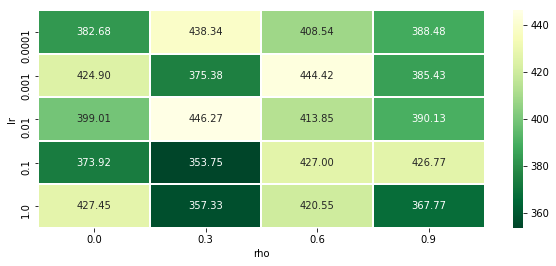

In [5]:
pivot = optimizer_later.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [6]:
best_row = optimizer_later.loc[optimizer_later['best_loss'].idxmin()]
best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_later

(0.1, 0.3, 353.75241492030295)

In [ ]:
# best_optimizer_later = (0.1, 0.3, 353.75241492030295)

#### 4.1.3 Conclusions

From the results it seems that the optimal learning rate is in the ballpark of ``0.01`` for the earlier and ``0.1`` for the later dataset. The coefficient for the squared gradients is however around ``0.3`` for both datasets.

### 4.2 Random Search

Next up the random search with values in the ballpark of the ones concluded in the grid search.

#### 4.2.1 RGB Earlier Dataset

lr=0.6864418130808305, rho=1.3973263338154513
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_172701849_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_172701849_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 521.45


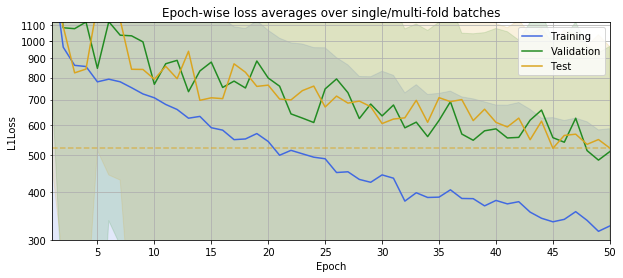

lr=0.6864418130808305, rho=1.0101312021439024
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_175512732_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_175512732_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 444.21


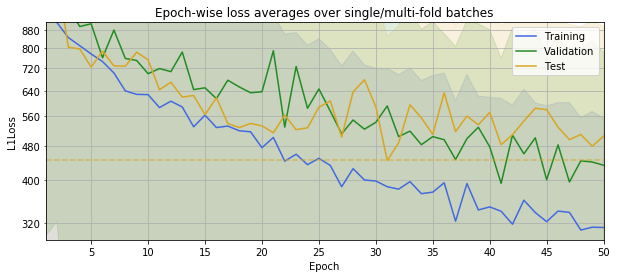

lr=0.6864418130808305, rho=0.7118424584848848
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_182317123_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_182317123_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 476.03


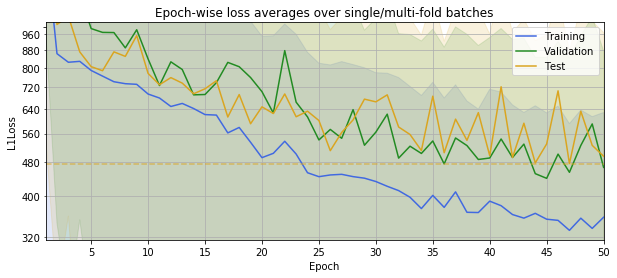

lr=0.6864418130808305, rho=0.8376077765576309
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_185119658_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_185119658_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 419.42


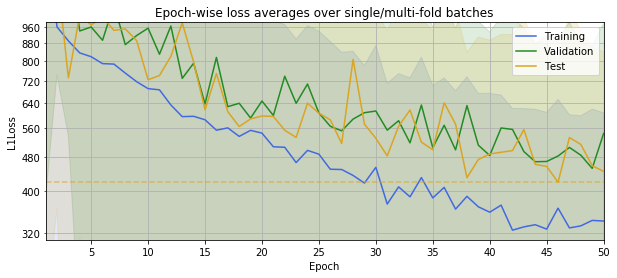

lr=0.9054020759727213, rho=1.3973263338154513
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_191923016_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_191923016_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 422.12


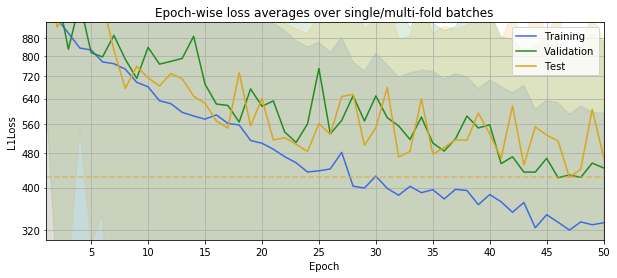

lr=0.9054020759727213, rho=1.0101312021439024
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_194726271_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_194726271_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 474.28


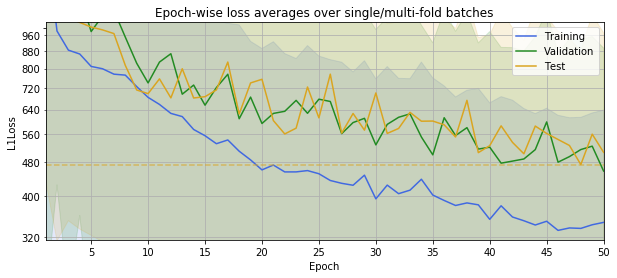

lr=0.9054020759727213, rho=0.7118424584848848
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_201528937_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_201528937_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 421.77


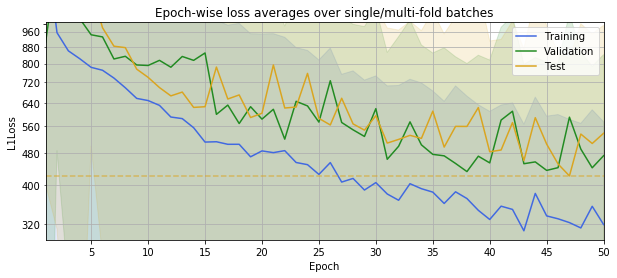

lr=0.9054020759727213, rho=0.8376077765576309
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_204330114_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_204330114_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 486.81


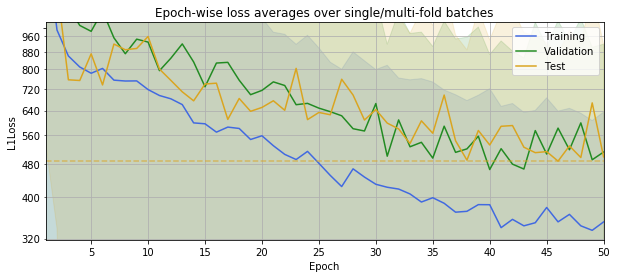

lr=1.062827629134786, rho=1.3973263338154513
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_211131162_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_211131162_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 440.48


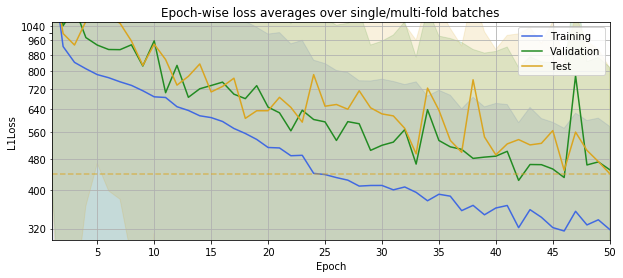

lr=1.062827629134786, rho=1.0101312021439024
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_213931588_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_213931588_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 457.98


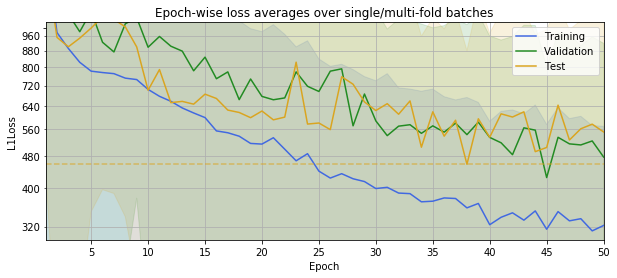

lr=1.062827629134786, rho=0.7118424584848848
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_220732798_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_220732798_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 429.75


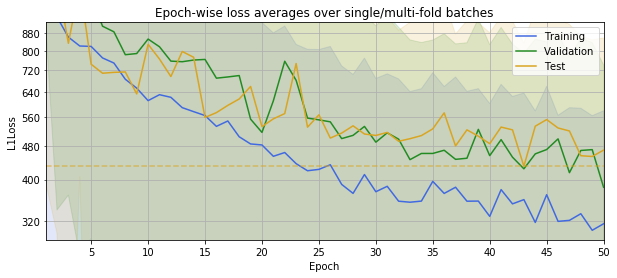

lr=1.062827629134786, rho=0.8376077765576309
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_223531322_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_223531322_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 462.79


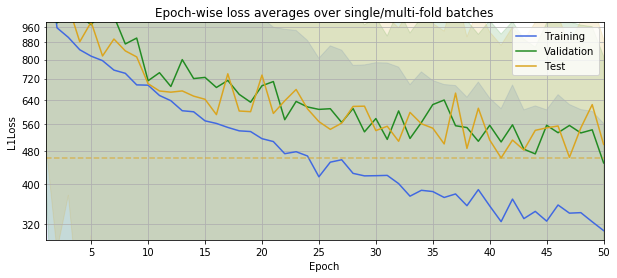

lr=1.0509830876493957, rho=1.3973263338154513
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_230330025_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_230330025_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 397.24


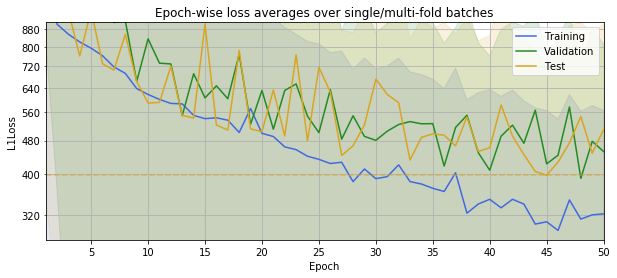

lr=1.0509830876493957, rho=1.0101312021439024
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_233128792_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_233128792_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 468.63


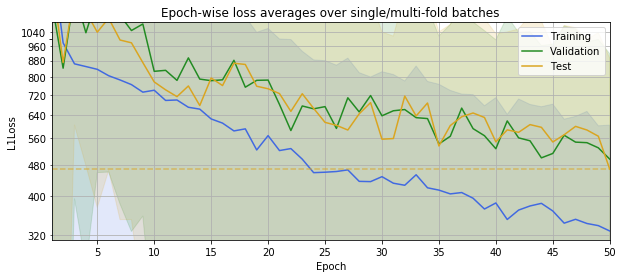

lr=1.0509830876493957, rho=0.7118424584848848
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181214_235925481_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181214_235925481_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 473.25


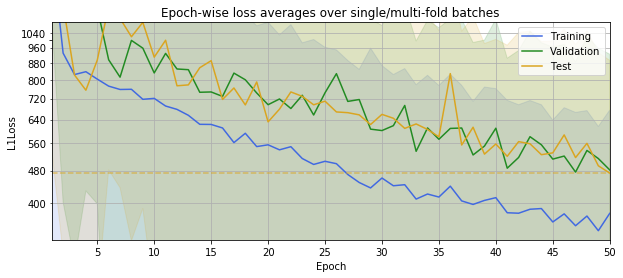

lr=1.0509830876493957, rho=0.8376077765576309
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_002721553_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_002721553_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 426.74


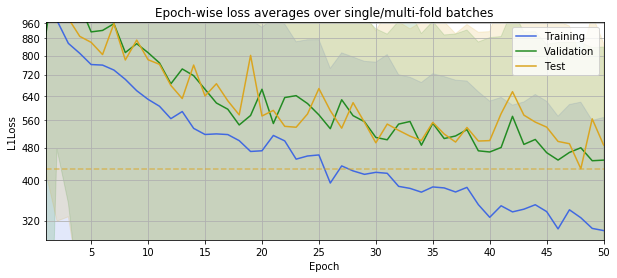

In [7]:
optimizer_earlier = test_optimizer(
    dp.DroneRGBEarlier, 
    best_l2_earlier[0],
    np.abs(np.random.normal(loc=best_optimizer_earlier[0],
                            scale=2*best_optimizer_earlier[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_earlier[1],
                            scale=2*best_optimizer_earlier[1]*0.1, 
                            size=4)))

rho,0.7118424584848848,0.8376077765576309,1.0101312021439024,1.3973263338154513
lr,,,,
0.686442,476.029642,419.419705,444.210648,521.448757
0.905402,421.767831,486.810391,474.275677,422.119263
1.050983,473.246582,426.740798,468.630668,397.235701
1.062828,429.753778,462.786990,457.982328,440.484724


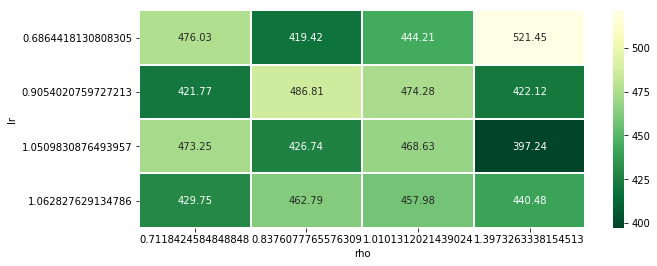

In [8]:
pivot = optimizer_earlier.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [9]:
best_row = optimizer_earlier.loc[optimizer_earlier['best_loss'].idxmin()]
if best_row['best_loss'] < best_optimizer_earlier[-1]:
    best_optimizer_earlier = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_earlier

(1.0, 0.9, 396.4310816322885)

#### 4.2.2 RGB Later Dataset

lr=0.10376769278534267, rho=0.31922988531917396
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_005517922_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_005517922_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 427.07


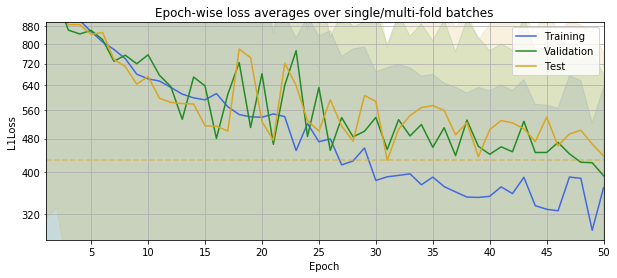

lr=0.10376769278534267, rho=0.3533399027782498
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_012028281_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_012028281_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 417.98


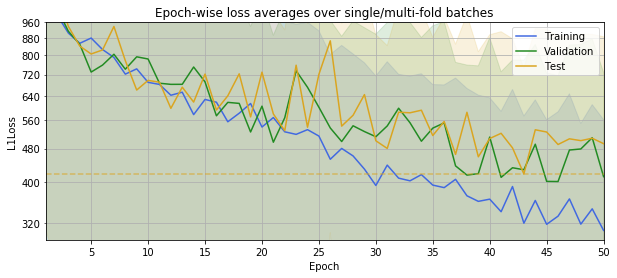

lr=0.10376769278534267, rho=0.22870152937431062
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_014534640_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_014534640_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 424.54


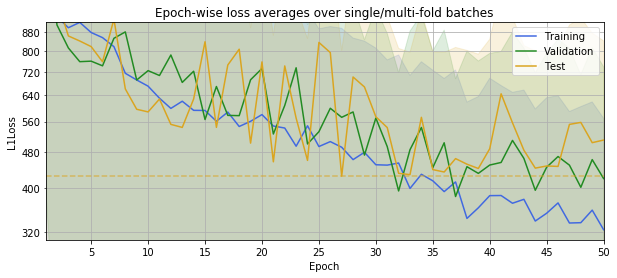

lr=0.10376769278534267, rho=0.3476022283915884
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_021046863_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_021046863_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 387.75


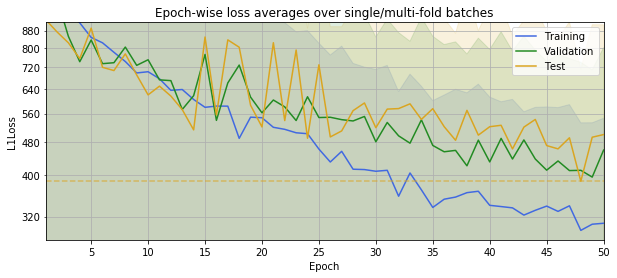

lr=0.0856975590925085, rho=0.31922988531917396
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_023553764_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_023553764_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 417.05


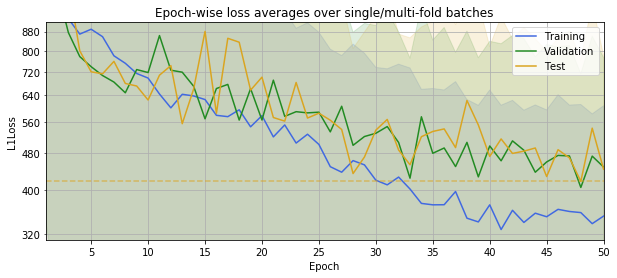

lr=0.0856975590925085, rho=0.3533399027782498
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_030059319_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_030059319_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 412.26


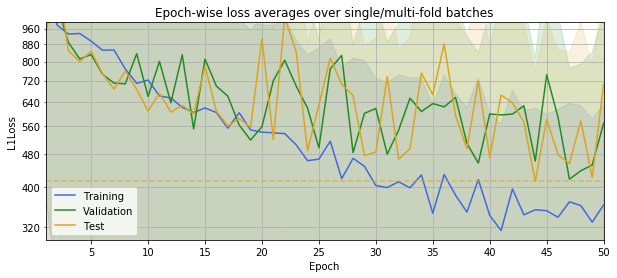

lr=0.0856975590925085, rho=0.22870152937431062
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_032611684_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_032611684_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 371.97


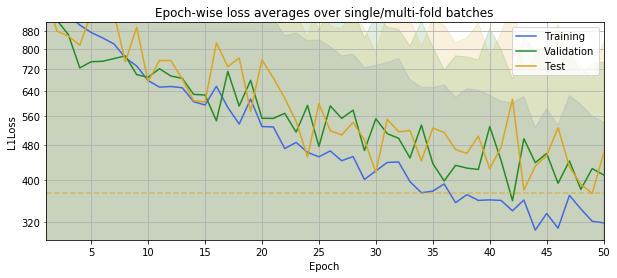

lr=0.0856975590925085, rho=0.3476022283915884
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_035117420_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_035117420_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 412.76


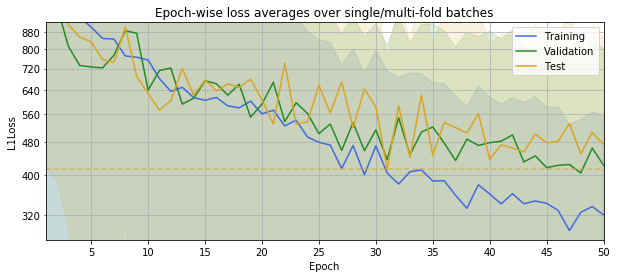

lr=0.1030955041463703, rho=0.31922988531917396
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_041622870_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_041622870_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 381.13


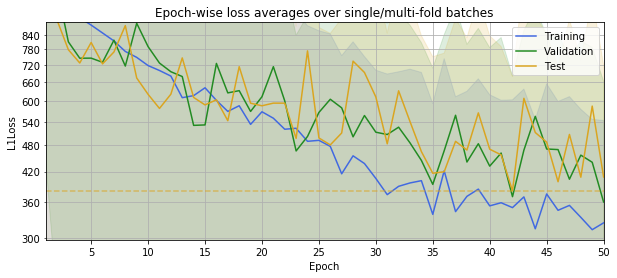

lr=0.1030955041463703, rho=0.3533399027782498
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_044128175_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_044128175_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 457.58


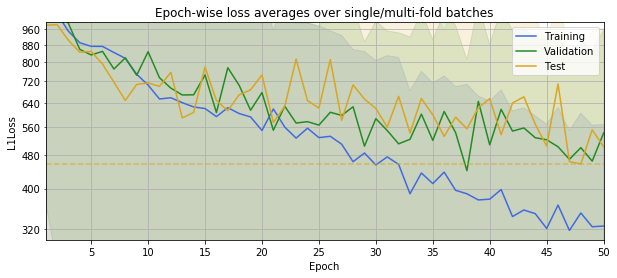

lr=0.1030955041463703, rho=0.22870152937431062
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_050631878_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_050631878_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 380.16


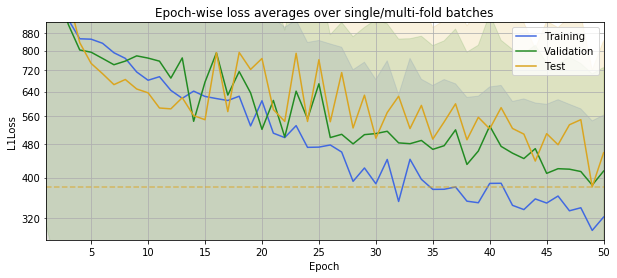

lr=0.1030955041463703, rho=0.3476022283915884
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_053135794_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_053135794_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 390.35


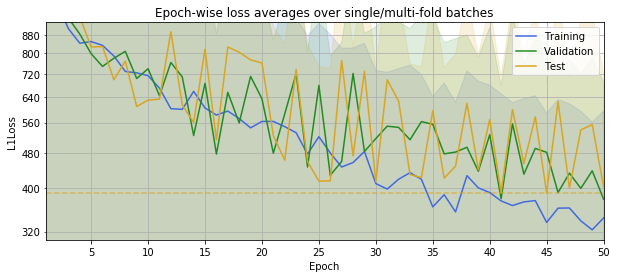

lr=0.09427382848949142, rho=0.31922988531917396
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_055636719_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_055636719_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 384.31


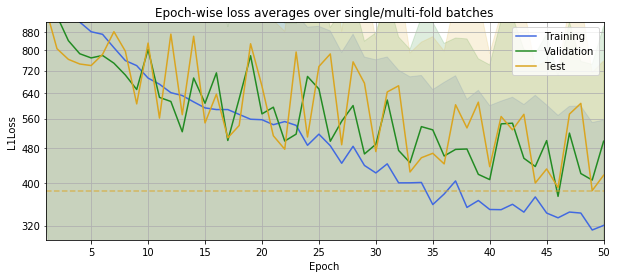

lr=0.09427382848949142, rho=0.3533399027782498
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_062138685_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_062138685_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 378.70


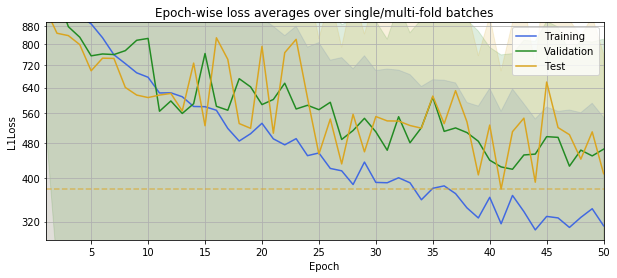

lr=0.09427382848949142, rho=0.22870152937431062
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_064640903_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_064640903_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 391.42


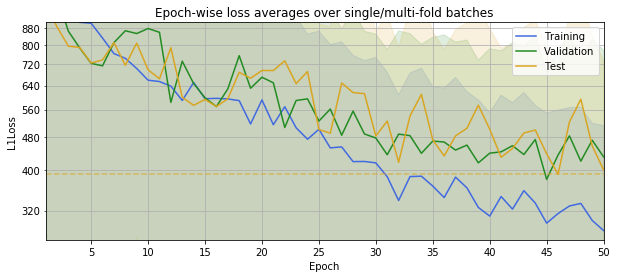

lr=0.09427382848949142, rho=0.3476022283915884
Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/optimization/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/optimization/20181215_071137358_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/optimization/20181215_071137358_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 419.27


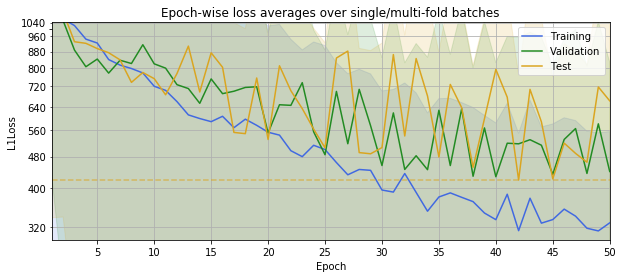

In [10]:
optimizer_later = test_optimizer(
    dp.DroneRGBLater, 
    best_l2_later[0],
    np.abs(np.random.normal(loc=best_optimizer_later[0],
                            scale=2*best_optimizer_later[0]*0.1, 
                            size=4)),
    np.abs(np.random.normal(loc=best_optimizer_later[1],
                            scale=2*best_optimizer_later[1]*0.1, 
                            size=4)))

rho,0.22870152937431062,0.31922988531917396,0.3476022283915884,0.3533399027782498
lr,,,,
0.085698,371.968038,417.052819,412.757781,412.257782
0.094274,391.415071,384.309299,419.269561,378.703735
0.103096,380.157350,381.131992,390.352912,457.581788
0.103768,424.538310,427.069887,387.752766,417.981714


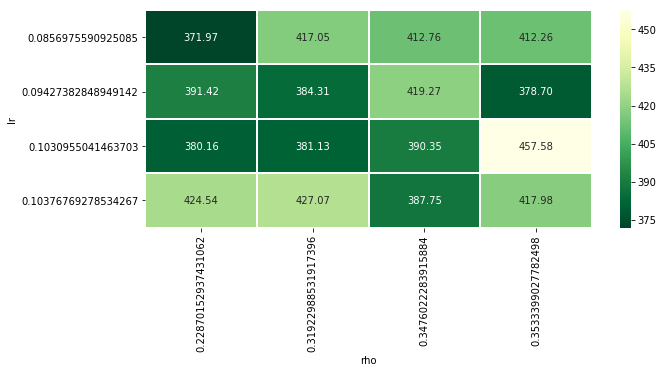

In [11]:
pivot = optimizer_later.pivot_table(values='best_loss',index='lr',columns='rho')
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGn_r', linewidth=1, linecolor='white')
pivot

In [12]:
best_row = optimizer_later.loc[optimizer_later['best_loss'].idxmin()]
if best_row['best_loss'] < best_optimizer_later[-1]:
    best_optimizer_later = (best_row['lr'], best_row['rho'], best_row['best_loss'])
best_optimizer_later

(0.1, 0.3, 353.75241492030295)

#### 4.2.3 Conclusions


In [13]:
#best_optimizer_earlier = (1.0, 0.9, 396.4310816322885)
#best_optimizer_later = (0.1, 0.3, 353.75241492030295)

print("RGB Earlier")
print("\tLearning Rate: {}".format(best_optimizer_earlier[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_earlier[1]))
print("\tBest Loss: {}".format(best_optimizer_earlier[2]))
print("RGB Later")
print("\tLearning Rate: {}".format(best_optimizer_later[0]))
print("\tMoving Mean Gradient Coefficient: {}".format(best_optimizer_later[1]))
print("\tBest Loss: {}".format(best_optimizer_later[2]))

RGB Earlier
	Learning Rate: 1.0
	Moving Mean Gradient Coefficient: 0.9
	Best Loss: 396.4310816322885
RGB Later
	Learning Rate: 0.1
	Moving Mean Gradient Coefficient: 0.3
	Best Loss: 353.75241492030295


## 5. Full Training

We then want to see if tuning the optimizer resulted in better loss than using only vanilla default values.

In [17]:
import os
import shutil
import numpy as np
import pandas as pd
import seaborn as sns

from torch import optim
from field_analysis.model.dataset import dataperiod as dp
from field_analysis.model.nets.cnn import DroneYieldMeanCNN
import field_analysis.settings.model as model_settings

%matplotlib inline

DB_128 = 'field_analysis_40m_128px.db'
DATASET_NAMES = ['earlier', 'later']
optimized_models_dir = os.path.join(model_settings.MODELS_DIR,'optimization')

def copy_model(cnn, is_later, save):
    "Copy the dataset-wise persisted model either for later use (`save=True`) or current use (`save=False`)."
    cnn.model_path = os.path.join(optimized_models_dir,cnn.model_filename)
    model_folder, _ = os.path.split(cnn.model_path)
    model_name, suffix = cnn.model_filename.split('.')
    model_name = "initial_model_{}.{}".format(
        DATASET_NAMES[is_later], suffix)
    if save:
        cnn.save_model()
        from_path = cnn.model_path
        to_path = os.path.join(model_folder, model_name)
    else:
        from_path = os.path.join(model_folder, model_name)
        to_path = cnn.model_path
    shutil.copyfile(from_path, to_path)
    print("Persisted model copied \n\tFrom: {} \n\tTo: {}".format(from_path, to_path))

def test_optimizer_full(dataset, weight_decay, patience, lr, rho):
    cnn = DroneYieldMeanCNN(
        source_bands=3,
        source_dim=128,
        cnn_layers=6,
        optimizer=optim.Adadelta,
        optimizer_parameters={
            'weight_decay': weight_decay,
            'lr': lr,
            'rho': rho})
    copy_model(
        cnn=cnn,
        is_later=isinstance(dataset, dp.DroneRGBLater),
        save=False)
    cnn.load_model()
    cnn.train(
        epochs=250,
        training_data=dataset(DB_128),
        k_cv_folds=3,
        early_stopping_patience=patience)
    cnn.train(
        epochs=250,
        training_data=dataset(DB_128),
        k_cv_folds=3,
        early_stopping_patience=patience)

###  5.1 RGB Earlier Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/20181215_090410073_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/20181215_090410073_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (7m 26s) 	Mean Loss:	Train=648.95 +-630.31	Test=771.47 +-730.96
[  26/ 250] (14m 33s) 	Mean Loss:	Train=481.78 +-407.88	Test=706.24 +-599.66
[  39/ 250] (21m 39s) 	Mean Loss:	Train=382.52 +-343.34	Test=634.35 +-502.51
[  52/ 250] (28m 46s) 	Mean Loss:	Train=340.46 +-262.18	Test=490.10 +-473.26
[  65/ 250] (35m 52s) 	Mean Loss:	Train=326.13 +-245.36	Test=489.71 +-474.26
[  78/ 250] (42m 58s) 	Mean Loss:	Train=290.53 +-211.51	Test=492.94 +-449.44
[  91/ 250] (50m  3s) 	Mean Loss:	Train=264.03 +-200.80	Test=514.59 +-425.33
[ 104/ 250] (57m  8s) 	Mean Loss:	Train=259.49 +-189.39	Test=495.08 +-422.37
[ 117/ 250] (64m 15s) 	Mean Loss:	Train=244.50 +-173.2

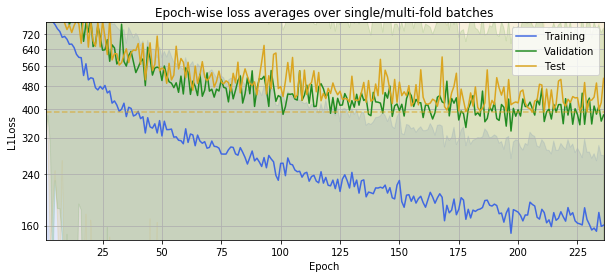

Starting the training with GPU:
[  13/ 250] (7m 26s) 	Mean Loss:	Train=160.94 +-124.57	Test=360.21 +-354.16
[  26/ 250] (14m 34s) 	Mean Loss:	Train=160.68 +-122.90	Test=357.68 +-349.82
[  39/ 250] (21m 41s) 	Mean Loss:	Train=163.74 +-123.42	Test=337.85 +-324.74
[  52/ 250] (28m 48s) 	Mean Loss:	Train=149.92 +-111.99	Test=348.42 +-348.64
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/20181215_090410073_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 330.37


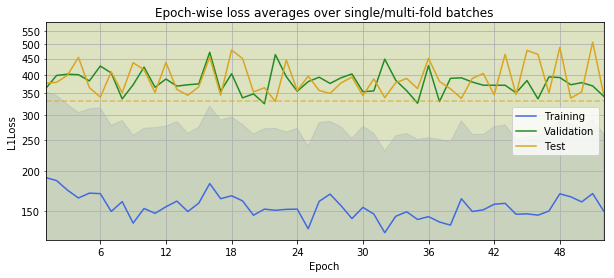

In [18]:
test_optimizer_full(dataset=dp.DroneRGBEarlier,
                    weight_decay=best_l2_earlier[0],
                    patience=30,
                    lr=best_optimizer_earlier[0], 
                    rho=best_optimizer_earlier[1])

### 5.2 RGB Later Dataset

Persisted model copied 
	From: /home/nevavuor/crop-field-cnn/models/initial_model_earlier.pkl 
	To: /home/nevavuor/crop-field-cnn/models/20181215_114213349_Adadelta_3x128x128_6cnn_2fc.pkl
Reading the model from /home/nevavuor/crop-field-cnn/models/20181215_114213349_Adadelta_3x128x128_6cnn_2fc.pkl
Starting the training with GPU:
[  13/ 250] (6m 43s) 	Mean Loss:	Train=606.17 +-548.88	Test=724.46 +-645.58
[  26/ 250] (13m  7s) 	Mean Loss:	Train=440.23 +-328.85	Test=674.31 +-531.22
[  39/ 250] (19m 30s) 	Mean Loss:	Train=362.28 +-254.49	Test=473.89 +-429.90
[  52/ 250] (25m 55s) 	Mean Loss:	Train=328.28 +-235.57	Test=383.54 +-332.46
[  65/ 250] (32m 18s) 	Mean Loss:	Train=309.69 +-211.39	Test=450.36 +-416.93
[  78/ 250] (38m 41s) 	Mean Loss:	Train=265.21 +-185.13	Test=397.92 +-332.99
[  91/ 250] (45m  4s) 	Mean Loss:	Train=266.25 +-191.83	Test=427.96 +-366.51
[ 104/ 250] (51m 27s) 	Mean Loss:	Train=203.94 +-156.42	Test=405.76 +-343.43
[ 117/ 250] (57m 50s) 	Mean Loss:	Train=217.22 +-167.2

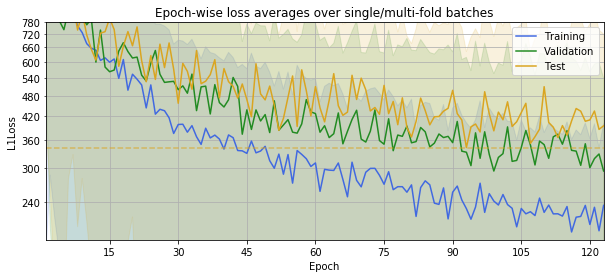

Starting the training with GPU:
[  13/ 250] (6m 42s) 	Mean Loss:	Train=208.25 +-151.50	Test=301.59 +-284.97
[  26/ 250] (13m  5s) 	Mean Loss:	Train=202.79 +-148.39	Test=393.14 +-337.90
[  31/ 250] (15m 32s) 	Mean Loss:	Train=195.21 +-136.61	Test=361.96 +-277.64
Early stopping criterion met, terminating training.
Saving the model to /home/nevavuor/crop-field-cnn/models/20181215_114213349_Adadelta_3x128x128_6cnn_2fc.pkl
Best Test Loss: 299.22


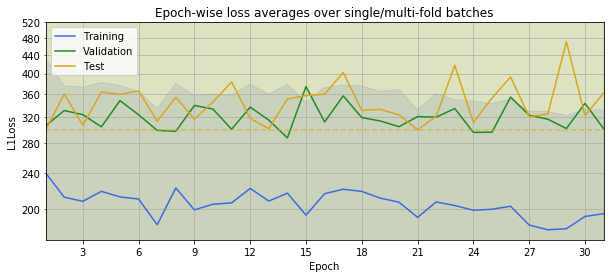

In [19]:
test_optimizer_full(dataset=dp.DroneRGBLater,
                    weight_decay=best_l2_later[0],
                    patience=30,
                    lr=best_optimizer_later[0], 
                    rho=best_optimizer_later[1])